In [1]:
import pandas as pd
from cdcqr.common.config import LOCAL_DATA_DIR
import os
from scipy.optimize import minimize
from scipy.interpolate import interp1d
from functools import partial
import numpy as np
DF= pd.DataFrame
from importlib import reload
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import cdcqr.analytics.derivatives.option_utils as optUtil
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from cdcqr.common.config import LOCAL_FIGURE_DIR

In [2]:
LOCAL_FIGURE_DIR

'C:\\Users\\Wang\\Documents\\GitHub\\figure'

In [21]:
reload(optUtil)

<module 'cdcqr.analytics.derivatives.option_utils' from 'c:\\users\\wang\\documents\\github\\cdcqr\\cdcqr\\analytics\\derivatives\\option_utils.py'>

In [4]:
df=pd.read_pickle(os.path.join(LOCAL_DATA_DIR, 'optchain5Min.pkl'))

In [5]:
df.head(2).T

tm,2021-07-01 00:05:00,2021-07-01 00:10:00
symbol,ETH-24SEP21-1600-C,ETH-24SEP21-1600-C
tm,2021-07-01 00:00:00,2021-07-01 00:05:00
aiv,2.0024,2.0031
ap,0.4855,0.4835
av,1.0,1.0
biv,0.8025,0.8026
bp,0.3315,0.328
bv,5.0,5.0
delta,0.82375,0.82068
exch,deribit,deribit


In [6]:
df=df[df.symbol.str.contains('BTC')]
df=df.set_index(['tm','expire','strike']).sort_index()

T=2021-09-24 08:00:00 t=2021-07-01 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.0635357  -0.06125823  0.04176506  0.05782864  0.1572483  -0.20940072]
<class 'pandas._libs.tslibs.timestamps.Timestamp'>


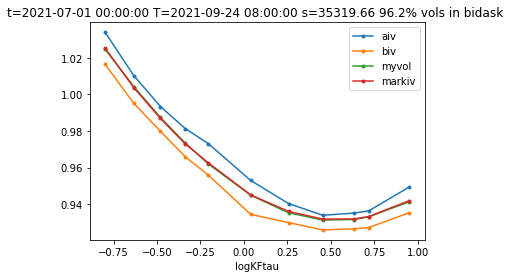

T=2021-09-24 08:00:00 t=2021-07-01 00:05:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.06351495 -0.06129762  0.04186032  0.05878535  0.15375393 -0.20715998]
<class 'pandas._libs.tslibs.timestamps.Timestamp'>


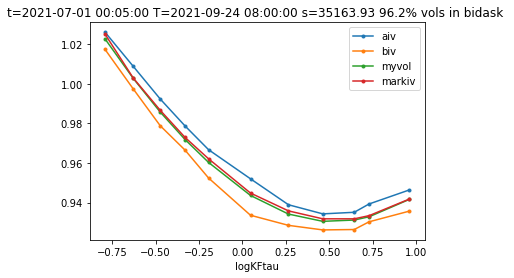

T=2021-09-24 08:00:00 t=2021-07-01 00:10:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.06569245 -0.06083374  0.03978181  0.05833577  0.15373452 -0.20740046]
<class 'pandas._libs.tslibs.timestamps.Timestamp'>


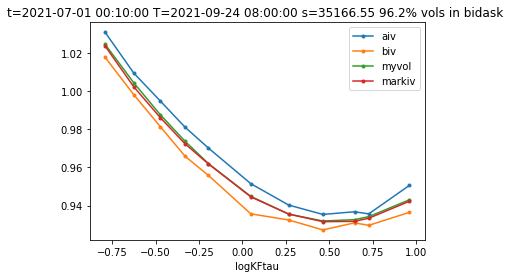

T=2021-09-24 08:00:00 t=2021-07-01 00:15:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.05851086 -0.06443519  0.04431904  0.05990578  0.15208199 -0.20557011]
<class 'pandas._libs.tslibs.timestamps.Timestamp'>


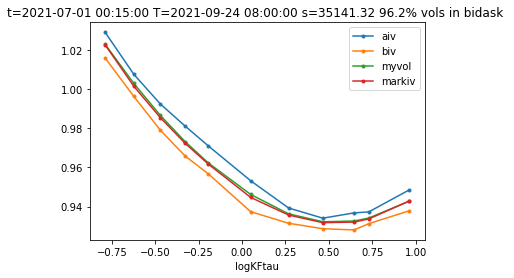

T=2021-09-24 08:00:00 t=2021-07-01 00:20:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6


KeyboardInterrupt: 

In [29]:
reload(optUtil)
optUtil.volfit(df,plot=3,model="errfunc_parabolic_linear6",kleft=-1.5,kright=2.3)

In [3]:
vfres=optUtil.volfit(df,plot=0,model='errfunc_parabolic_linear6',kleft=-2,kright=1.5)

NameError: name 'optUtil' is not defined

<AxesSubplot:xlabel='t'>

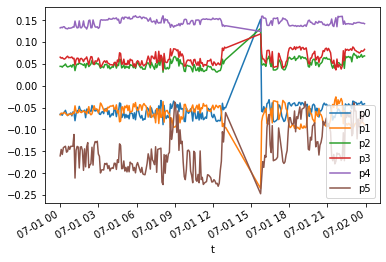

In [15]:
DF(vfres).set_index('t')[['p0','p1','p2','p3','p4','p5']].plot()

In [16]:
import time
t = (2009, 2, 17, 17, 3, 38, 1, 48, 0)
t = time.mktime(t)
print (time.strftime("%Y%M%d%H%M%S", time.gmtime(t)))

20090317170338


T=2021-09-24 08:00:00 t=2021-08-01 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.02108585  0.01677644  0.10455532  0.04706738  0.19489145 -0.23580741]


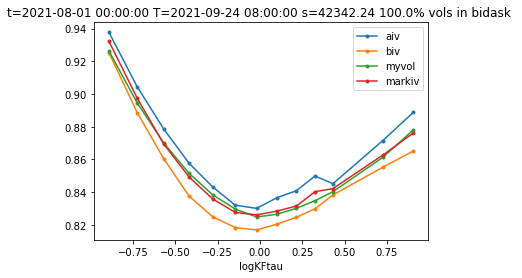

T=2021-09-24 08:00:00 t=2021-08-01 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01340566  0.00978399  0.10916801  0.05033762  0.19683599 -0.23458774]


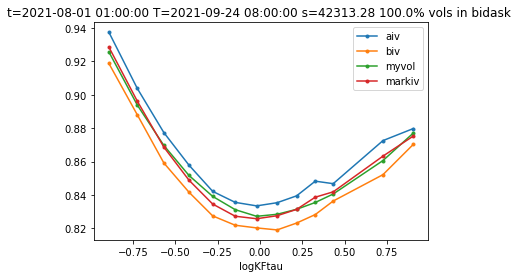

T=2021-09-24 08:00:00 t=2021-08-01 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.02013044  0.0136625   0.10442619  0.04802873  0.19840993 -0.23469675]


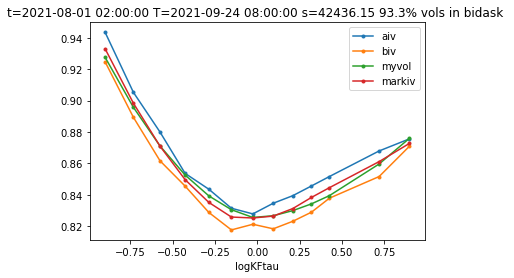

T=2021-09-24 08:00:00 t=2021-08-01 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01511882  0.01697136  0.1081945   0.04555422  0.19403729 -0.24156481]


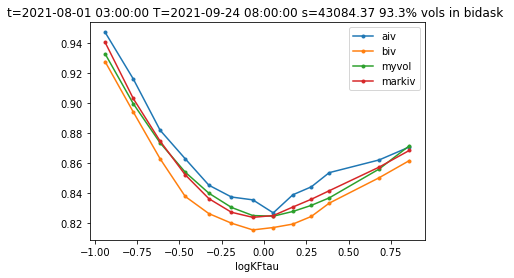

T=2021-09-24 08:00:00 t=2021-08-01 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01325083  0.01328456  0.10827802  0.04718221  0.18737285 -0.24276809]


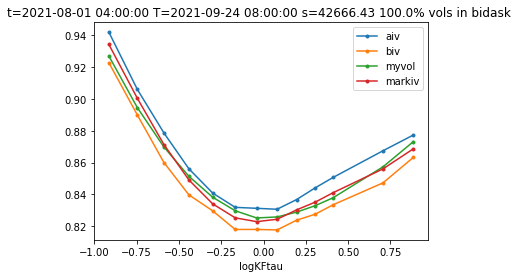

T=2021-09-24 08:00:00 t=2021-08-01 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01060995  0.01222837  0.10961047  0.0446782   0.21257018 -0.24103527]


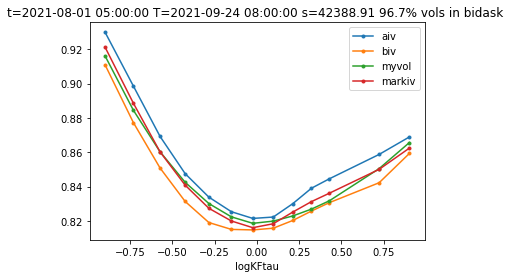

T=2021-09-24 08:00:00 t=2021-08-01 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00816583  0.00431915  0.10834308  0.04872775  0.20976736 -0.24064544]


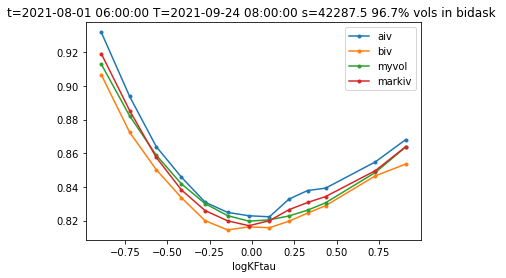

T=2021-09-24 08:00:00 t=2021-08-01 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01116151  0.00658539  0.1083828   0.04869162  0.21092224 -0.24175808]


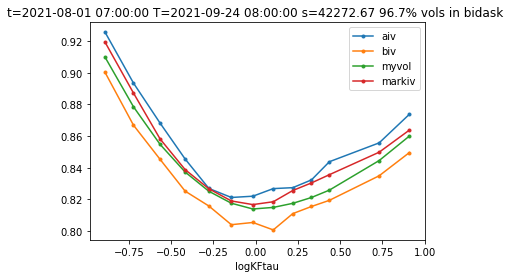

T=2021-09-24 08:00:00 t=2021-08-01 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01714792  0.00793081  0.10217386  0.04720071  0.19936068 -0.24243075]


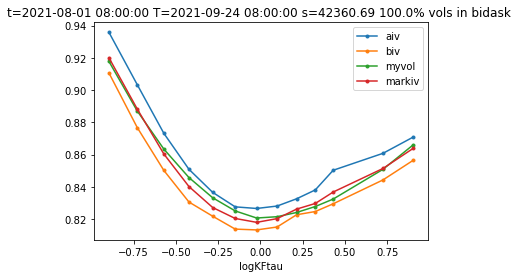

T=2021-09-24 08:00:00 t=2021-08-01 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.03625193  0.02184332  0.09344463  0.0446034   0.21351201 -0.2428793 ]


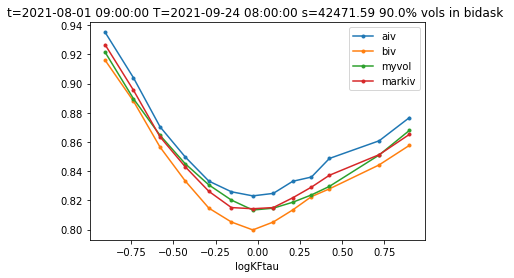

T=2021-09-24 08:00:00 t=2021-08-01 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.02040937  0.01440866  0.10322156  0.04877367  0.20609383 -0.23725572]


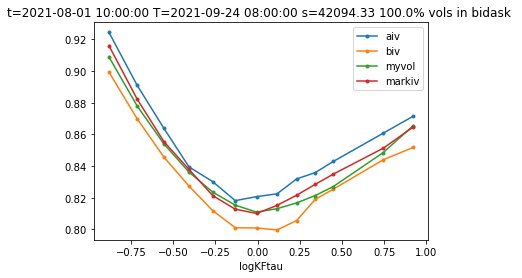

T=2021-09-24 08:00:00 t=2021-08-01 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.02785922  0.0116361   0.0957689   0.05048518  0.195979   -0.24056798]


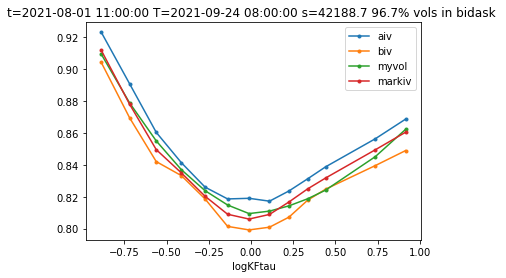

T=2021-09-24 08:00:00 t=2021-08-01 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01959181  0.02100372  0.10226727  0.04749276  0.2031473  -0.24155026]


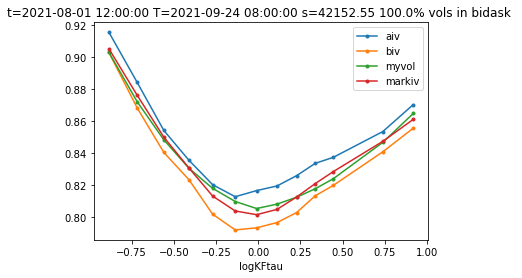

T=2021-09-24 08:00:00 t=2021-08-01 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01947571  0.0111362   0.09926046  0.04974361  0.1987998  -0.24028012]


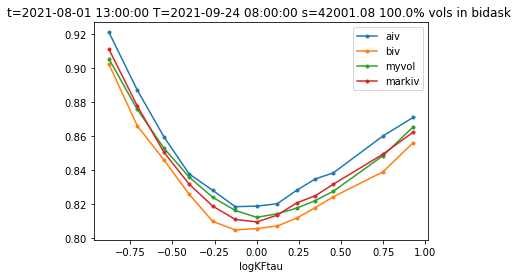

T=2021-09-24 08:00:00 t=2021-08-01 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.03015015  0.0255876   0.09392894  0.04358543  0.21325721 -0.24165836]


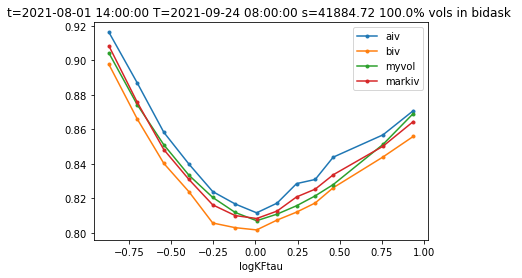

T=2021-09-24 08:00:00 t=2021-08-01 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.02481101  0.02287067  0.10335723  0.04577559  0.21273243 -0.2336579 ]


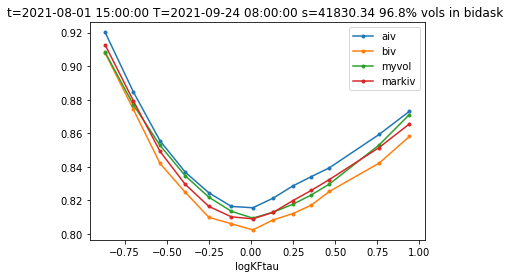

T=2021-09-24 08:00:00 t=2021-08-01 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.0070102   0.02137095  0.11461564  0.04412796  0.21585691 -0.23401921]


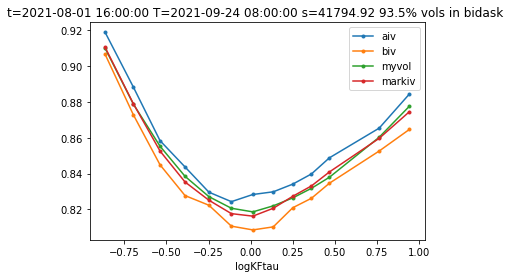

T=2021-09-24 08:00:00 t=2021-08-01 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01326353  0.02852788  0.10933971  0.04181653  0.2164883  -0.23615297]


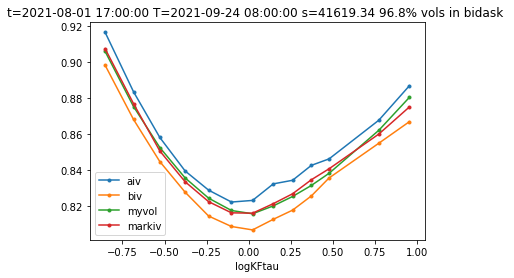

T=2021-09-24 08:00:00 t=2021-08-01 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01812839  0.03091116  0.10413787  0.04115799  0.21699787 -0.23221271]


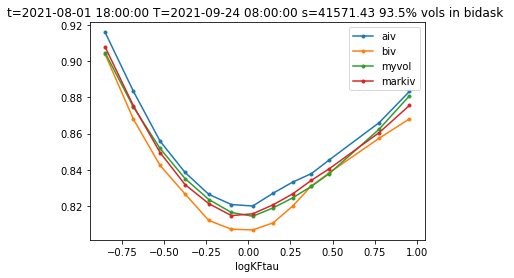

T=2021-09-24 08:00:00 t=2021-08-01 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01086848  0.02424505  0.10814332  0.04390959  0.20075511 -0.22826693]


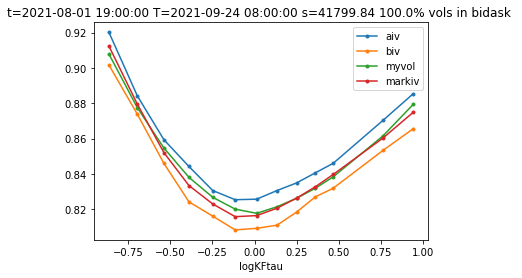

T=2021-09-24 08:00:00 t=2021-08-01 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01426182  0.02334156  0.10721377  0.04443041  0.19630361 -0.20808058]


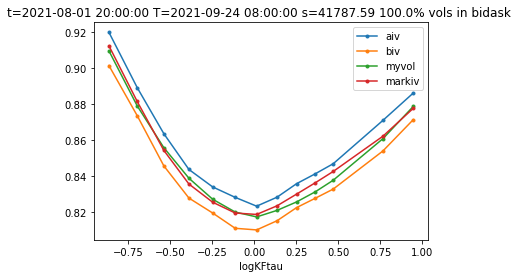

T=2021-09-24 08:00:00 t=2021-08-01 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00229244  0.02019364  0.11119627  0.04691167  0.1953218  -0.21237159]


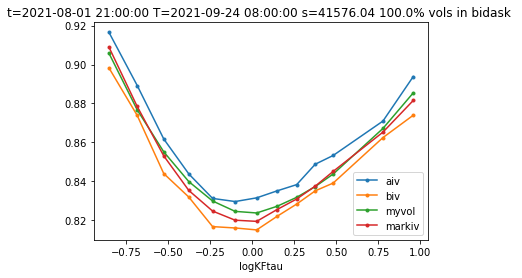

T=2021-09-24 08:00:00 t=2021-08-01 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00607931  0.02645323  0.10956974  0.04537539  0.19833767 -0.20550742]


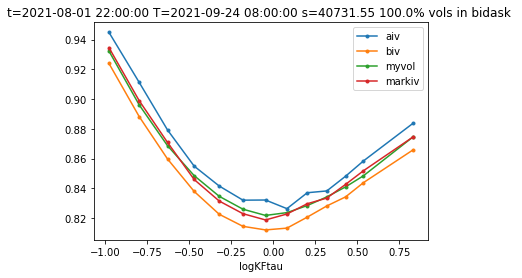

T=2021-09-24 08:00:00 t=2021-08-01 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00344286  0.03022989  0.10802685  0.04342681  0.20051174 -0.20428891]


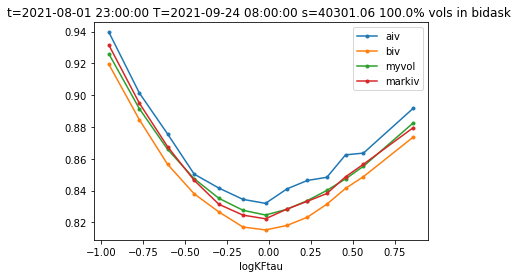

T=2021-09-24 08:00:00 t=2021-08-02 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00294991  0.02859587  0.11448152  0.04474689  0.20399898 -0.1969126 ]


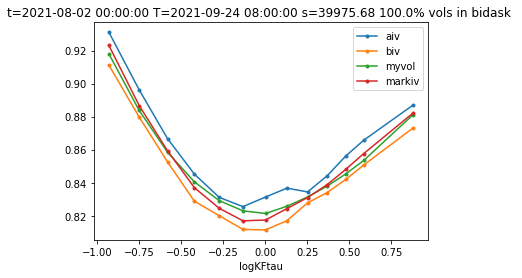

T=2021-09-24 08:00:00 t=2021-08-02 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01864749  0.05517353  0.10056929  0.03441731  0.2060982  -0.20094313]


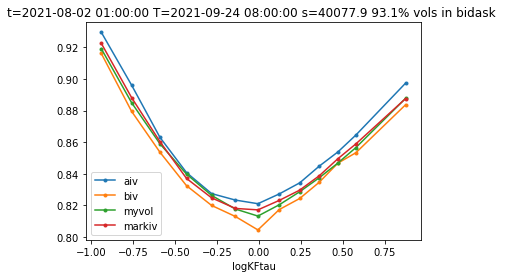

T=2021-09-24 08:00:00 t=2021-08-02 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00410598  0.04794317  0.11119022  0.03673289  0.21012239 -0.20429352]


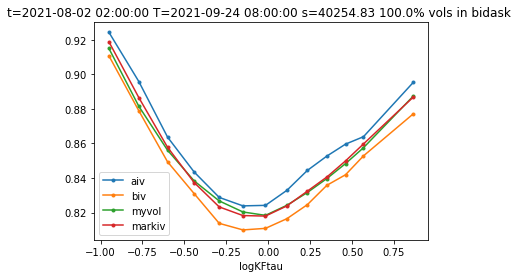

T=2021-09-24 08:00:00 t=2021-08-02 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00484793  0.05824688  0.11621351  0.03422698  0.20216085 -0.2329442 ]


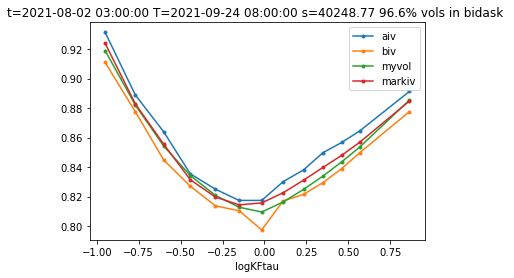

T=2021-09-24 08:00:00 t=2021-08-02 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00272799  0.04744998  0.12083342  0.03921901  0.19917911 -0.22406026]


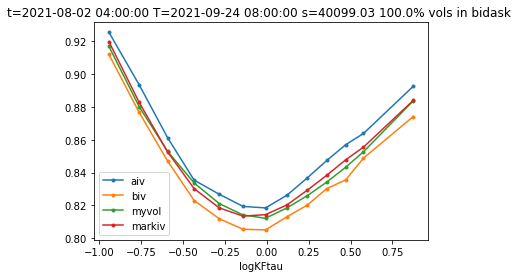

T=2021-09-24 08:00:00 t=2021-08-02 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00279206  0.05484362  0.12280924  0.03630916  0.2067404  -0.21957746]


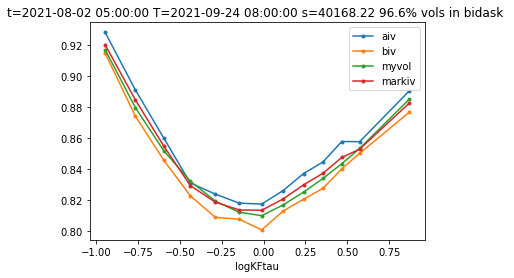

T=2021-09-24 08:00:00 t=2021-08-02 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00912798  0.03901093  0.12438248  0.04211115  0.19416109 -0.21084348]


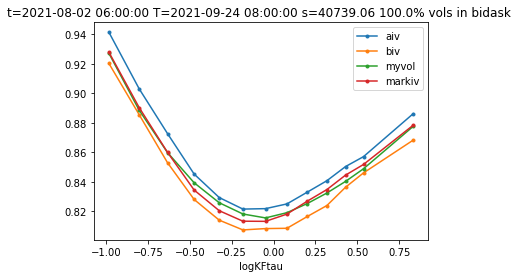

T=2021-09-24 08:00:00 t=2021-08-02 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00168478  0.05023492  0.11794033  0.03913484  0.19618217 -0.21063973]


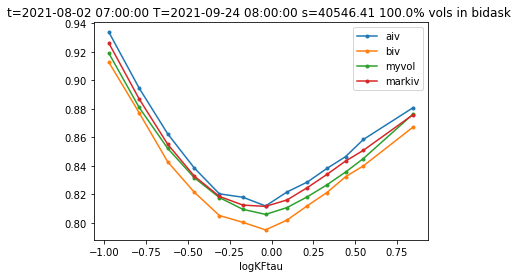

T=2021-09-24 08:00:00 t=2021-08-02 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01830122  0.04112796  0.1297563   0.04067746  0.21164856 -0.21117003]


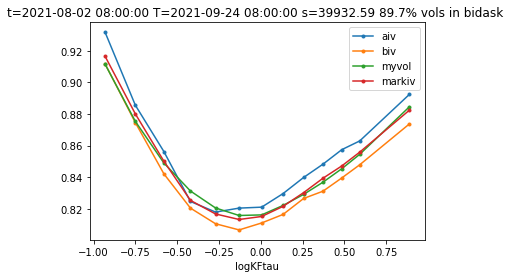

T=2021-09-24 08:00:00 t=2021-08-02 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0078659   0.04697441  0.12115419  0.03905955  0.20013657 -0.21657894]


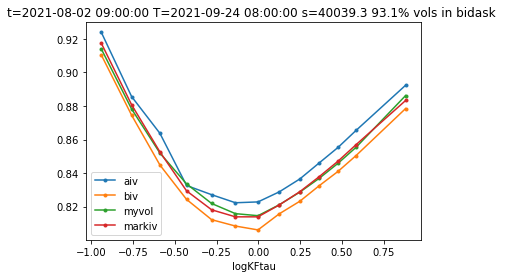

T=2021-09-24 08:00:00 t=2021-08-02 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00408895  0.04744018  0.11340541  0.03818449  0.20602852 -0.21588917]


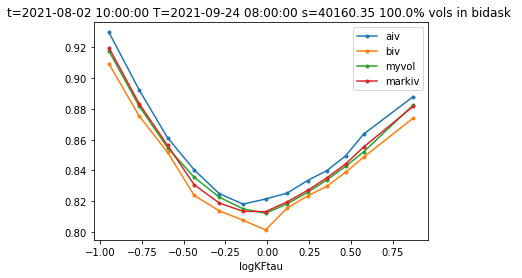

T=2021-09-24 08:00:00 t=2021-08-02 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00718172  0.04402689  0.12199018  0.04054104  0.20580287 -0.21537445]


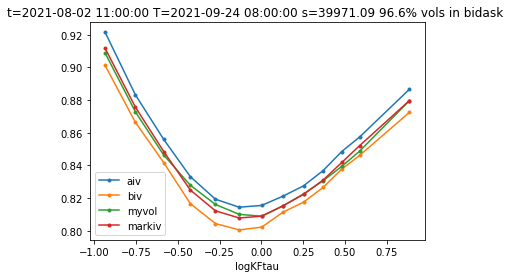

T=2021-09-24 08:00:00 t=2021-08-02 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01378783  0.04814828  0.12212296  0.0382995   0.21134807 -0.22011282]


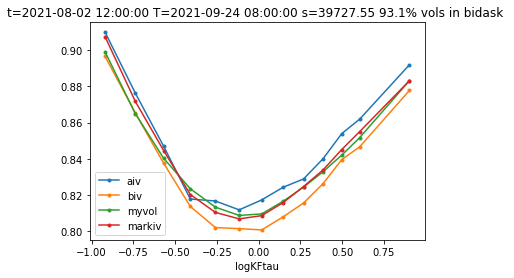

T=2021-09-24 08:00:00 t=2021-08-02 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00487213  0.05391893  0.11274994  0.03783917  0.20408534 -0.22568274]


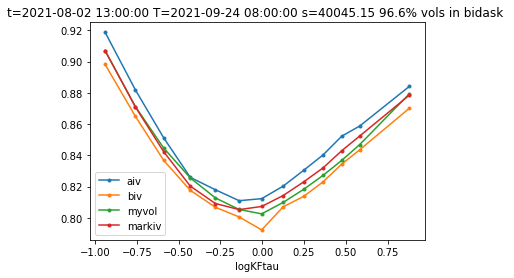

T=2021-09-24 08:00:00 t=2021-08-02 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00146423  0.06119924  0.11450377  0.03458346  0.1968688  -0.22765423]


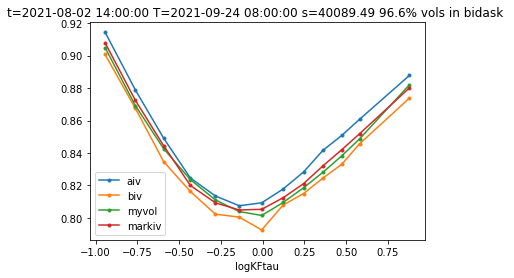

T=2021-09-24 08:00:00 t=2021-08-02 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00682589  0.05009014  0.11684621  0.03881322  0.1978621  -0.19864205]


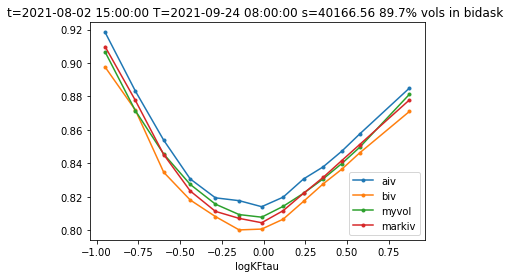

T=2021-09-24 08:00:00 t=2021-08-02 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0118956   0.04416542  0.11692296  0.04088033  0.19314164 -0.20096179]


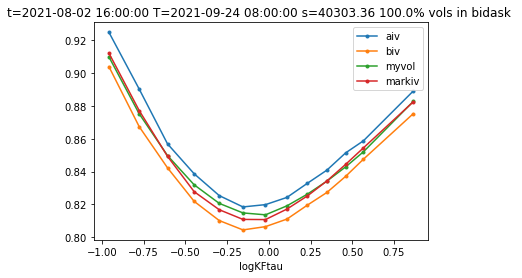

T=2021-09-24 08:00:00 t=2021-08-02 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01649521  0.04156598  0.11950908  0.04181715  0.19431797 -0.19867168]


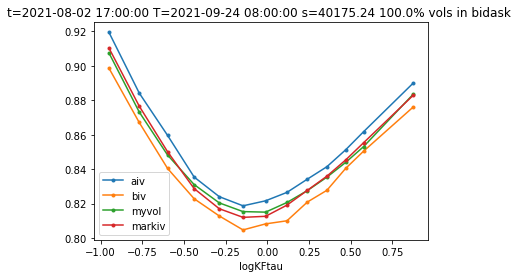

T=2021-09-24 08:00:00 t=2021-08-02 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00493232  0.05144697  0.11313139  0.03810792  0.18076126 -0.19786401]


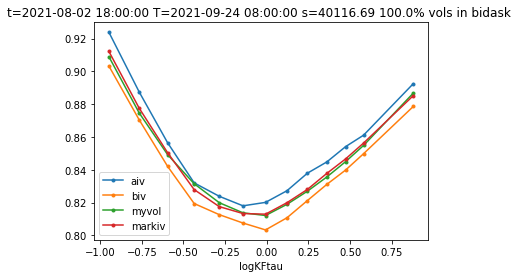

T=2021-09-24 08:00:00 t=2021-08-02 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0126386   0.04421472  0.11655977  0.041215    0.17059011 -0.20955266]


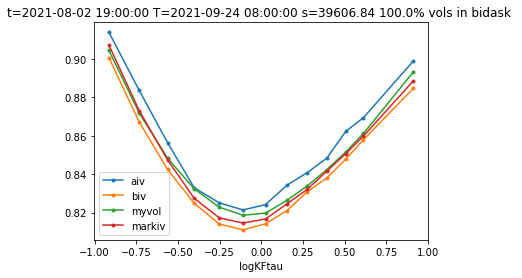

T=2021-09-24 08:00:00 t=2021-08-02 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01148792  0.04314941  0.11377569  0.04053771  0.1874877  -0.21226237]


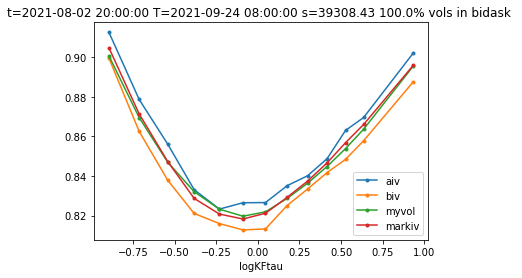

T=2021-09-24 08:00:00 t=2021-08-02 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01732982  0.04796752  0.11926654  0.03763975  0.18694983 -0.21220252]


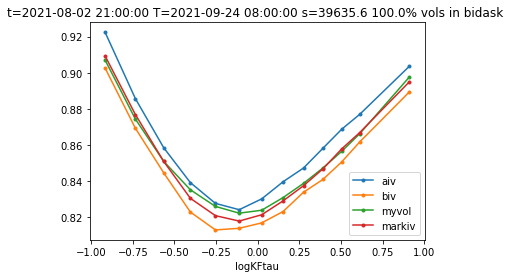

T=2021-09-24 08:00:00 t=2021-08-02 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01039885  0.04638356  0.11313578  0.03881804  0.18986255 -0.21954851]


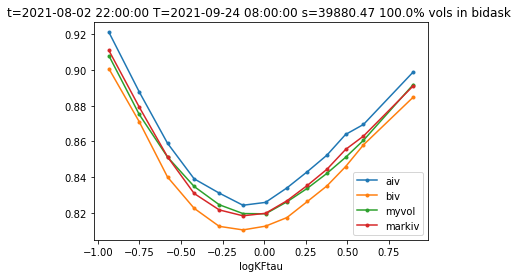

T=2021-09-24 08:00:00 t=2021-08-02 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01443804  0.04396903  0.12012058  0.04087996  0.18872592 -0.1921312 ]


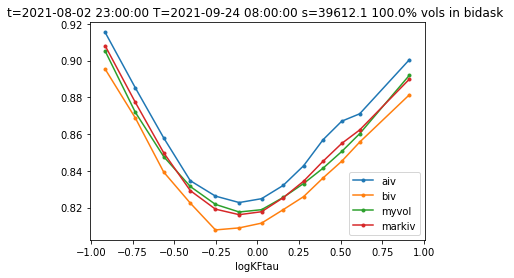

T=2021-09-24 08:00:00 t=2021-08-03 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01737916  0.0464426   0.12271516  0.03974609  0.19028558 -0.19192894]


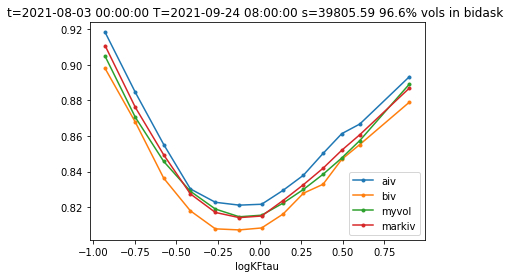

T=2021-09-24 08:00:00 t=2021-08-03 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01250444  0.04390186  0.11500007  0.03966564  0.18970584 -0.19953905]


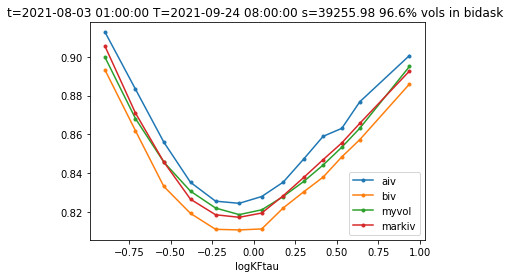

T=2021-09-24 08:00:00 t=2021-08-03 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01172005  0.04446591  0.11439622  0.04007948  0.18720521 -0.22287042]


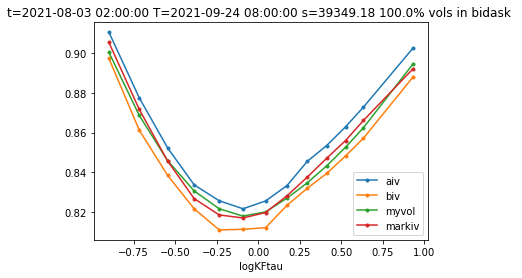

T=2021-09-24 08:00:00 t=2021-08-03 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01548018  0.044561    0.11953916  0.03873875  0.19782691 -0.18698505]


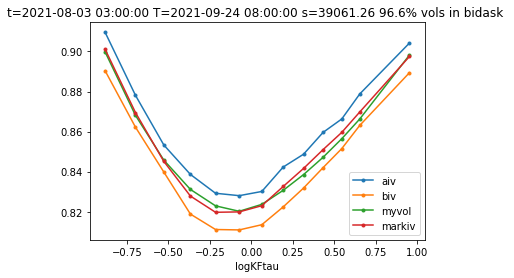

T=2021-09-24 08:00:00 t=2021-08-03 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01710043  0.03842133  0.11798269  0.04298372  0.18687404 -0.18612886]


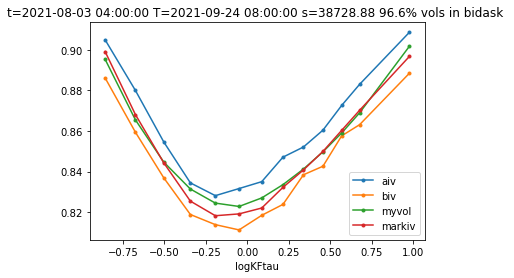

T=2021-09-24 08:00:00 t=2021-08-03 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00658279  0.04265272  0.1116581   0.04062657  0.19476358 -0.20923009]


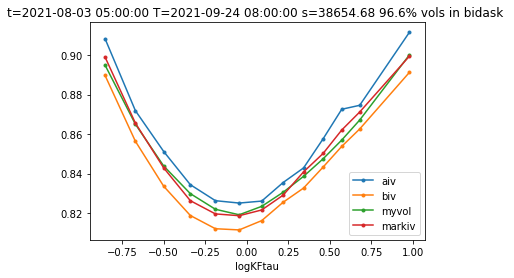

T=2021-09-24 08:00:00 t=2021-08-03 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00659919  0.04547241  0.10853132  0.04029256  0.16920687 -0.22743142]


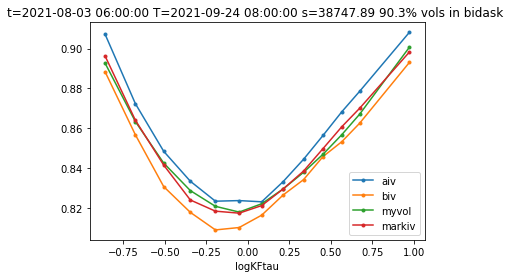

T=2021-09-24 08:00:00 t=2021-08-03 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00024112  0.03737817  0.10273552  0.04166515  0.1739409  -0.23476019]


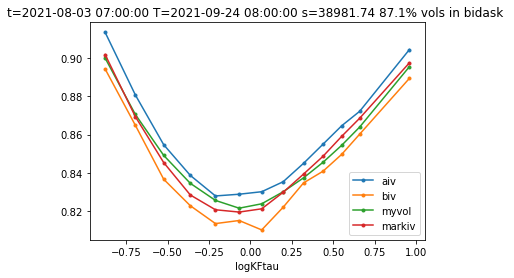

T=2021-09-24 08:00:00 t=2021-08-03 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00645107  0.03987248  0.11115392  0.04148745  0.17226661 -0.23003295]


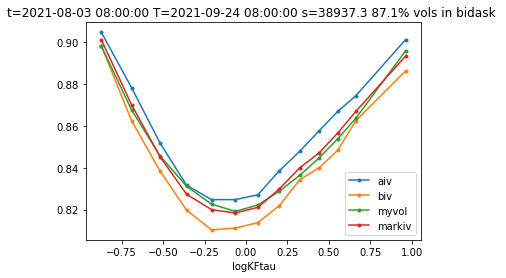

T=2021-09-24 08:00:00 t=2021-08-03 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00670151  0.03159803  0.11157201  0.04469938  0.16986053 -0.23505797]


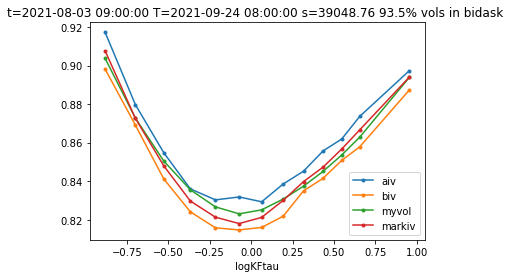

T=2021-09-24 08:00:00 t=2021-08-03 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00579136  0.03678408  0.11238654  0.04289444  0.16937221 -0.23357917]


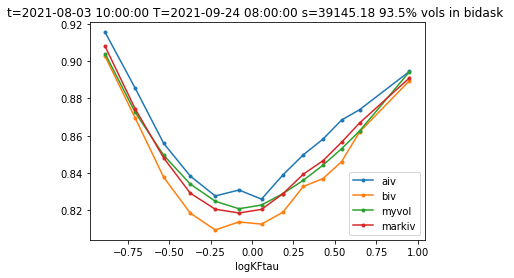

T=2021-09-24 08:00:00 t=2021-08-03 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00509692  0.03441443  0.11010694  0.04833021  0.17230238 -0.23310037]


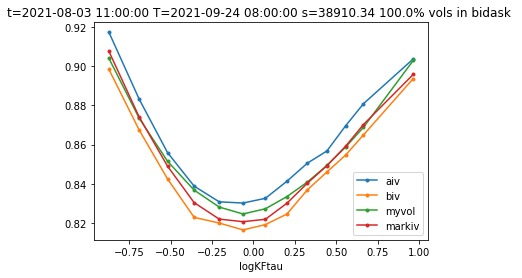

T=2021-09-24 08:00:00 t=2021-08-03 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00082817  0.05367783  0.10453637  0.04732017  0.16241842 -0.2345753 ]


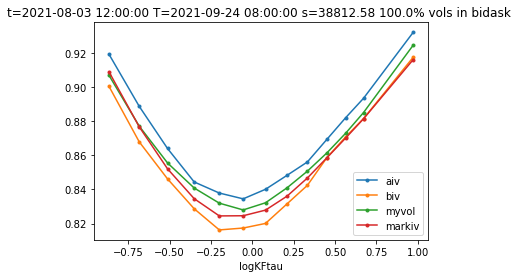

T=2021-09-24 08:00:00 t=2021-08-03 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00275433  0.04450188  0.1073359   0.05218615  0.15855528 -0.23504101]


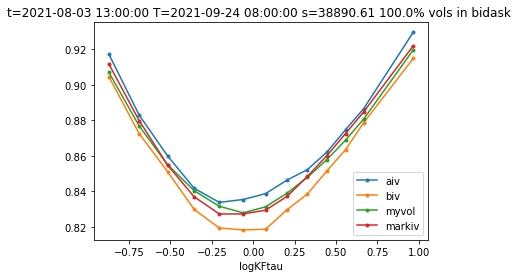

T=2021-09-24 08:00:00 t=2021-08-03 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00517536  0.04764162  0.10277642  0.04966217  0.16380328 -0.23351862]


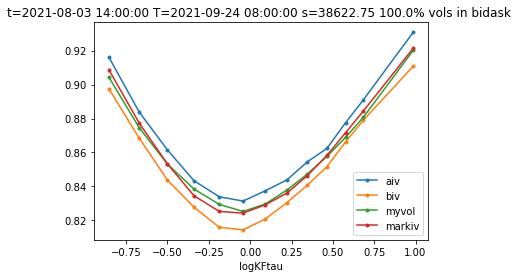

T=2021-09-24 08:00:00 t=2021-08-03 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00199736  0.04592419  0.1063281   0.05020277  0.16487104 -0.23050297]


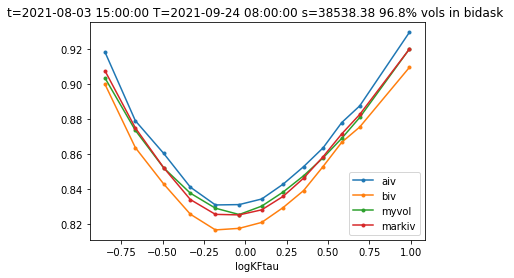

T=2021-09-24 08:00:00 t=2021-08-03 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00537446  0.04733096  0.10916054  0.04990136  0.1660221  -0.23496364]


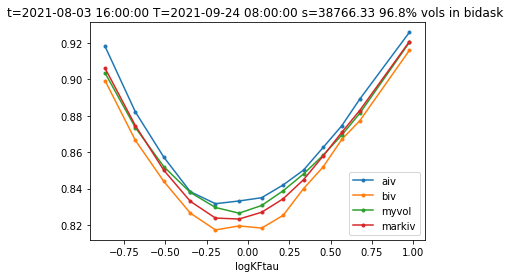

T=2021-09-24 08:00:00 t=2021-08-03 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00531169  0.05198855  0.1041      0.04848557  0.15957329 -0.23321734]


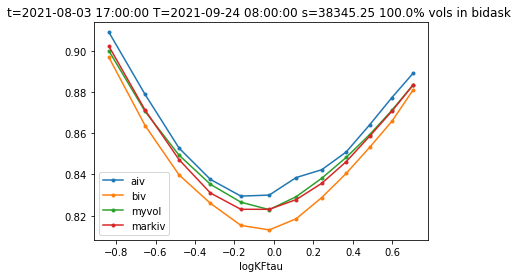

T=2021-09-24 08:00:00 t=2021-08-03 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00133708  0.0514211   0.10722062  0.04911374  0.1684583  -0.23500913]


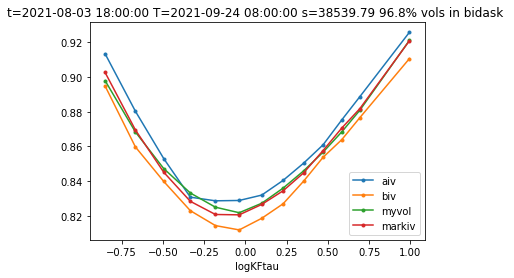

T=2021-09-24 08:00:00 t=2021-08-03 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00256415  0.04818138  0.10926877  0.04959422  0.16153828 -0.23235234]


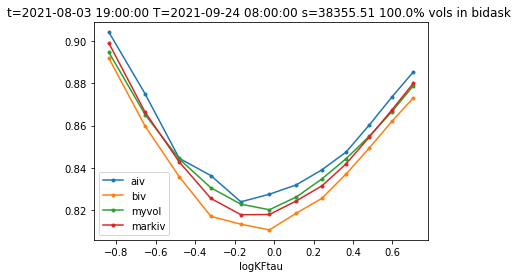

T=2021-09-24 08:00:00 t=2021-08-03 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.0028503   0.04896994  0.1064392   0.04923557  0.16210273 -0.23268746]


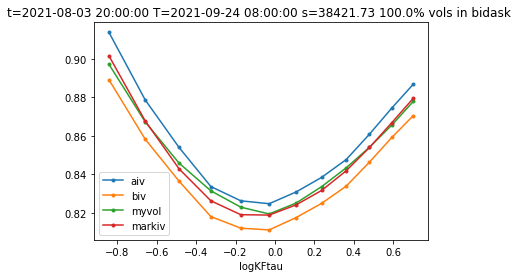

T=2021-09-24 08:00:00 t=2021-08-03 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00193531  0.05508152  0.1074355   0.04751329  0.16192353 -0.2362865 ]


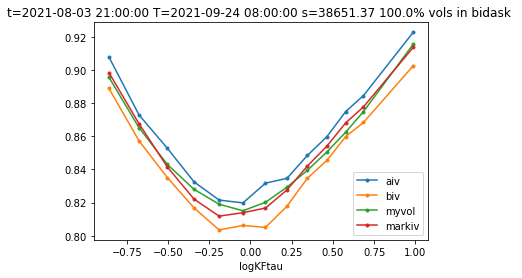

T=2021-09-24 08:00:00 t=2021-08-03 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00732263  0.0463777   0.11300869  0.05106452  0.16298118 -0.23460148]


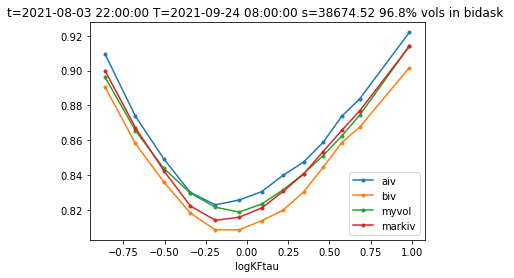

T=2021-09-24 08:00:00 t=2021-08-03 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01059106  0.04609901  0.11477517  0.04993523  0.16749775 -0.23268325]


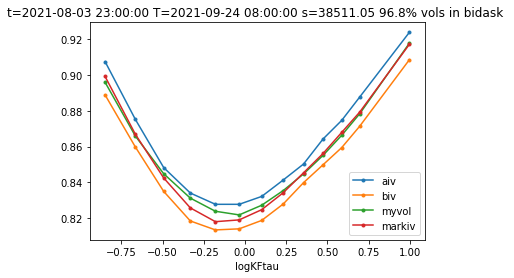

T=2021-09-24 08:00:00 t=2021-08-04 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00808186  0.05332986  0.11267481  0.04766991  0.16709127 -0.23461199]


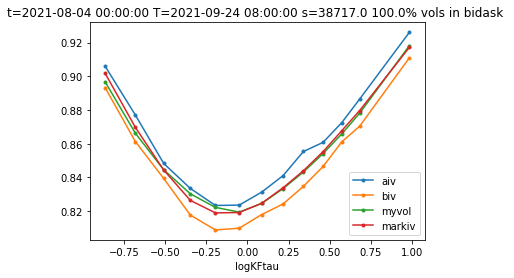

T=2021-09-24 08:00:00 t=2021-08-04 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00985287  0.04973009  0.11389267  0.04798721  0.16696208 -0.23447976]


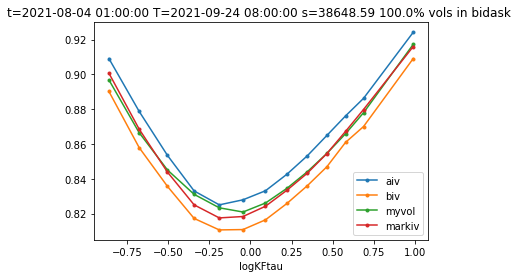

T=2021-09-24 08:00:00 t=2021-08-04 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0081965   0.05169124  0.11233706  0.04800893  0.17268275 -0.23423527]


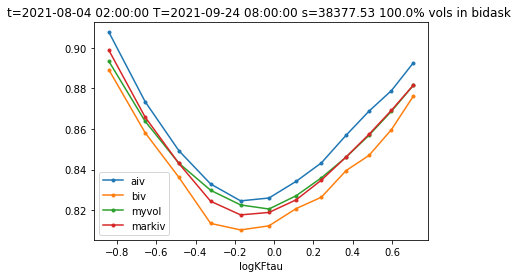

T=2021-09-24 08:00:00 t=2021-08-04 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00187539  0.05400967  0.10666267  0.04644663  0.17137616 -0.23360744]


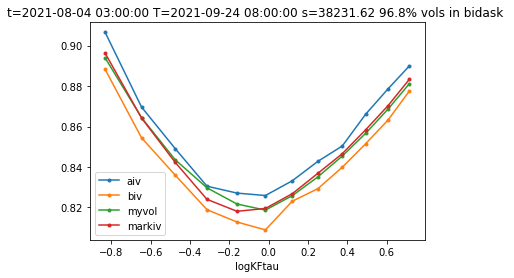

T=2021-09-24 08:00:00 t=2021-08-04 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00175552  0.05295569  0.10691911  0.04750591  0.16859781 -0.23279859]


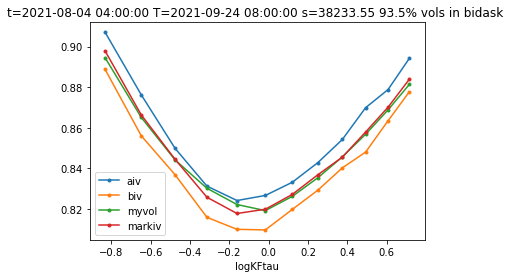

T=2021-09-24 08:00:00 t=2021-08-04 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00032863  0.05017935  0.10686165  0.0472125   0.1585141  -0.23274364]


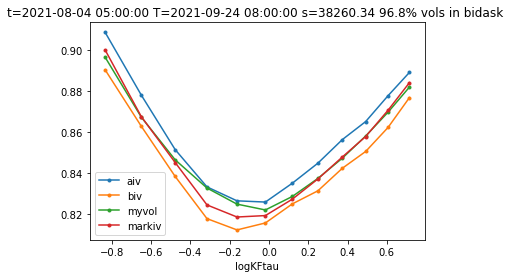

T=2021-09-24 08:00:00 t=2021-08-04 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00633175  0.05971071  0.10309122  0.04279245  0.16198292 -0.23003377]


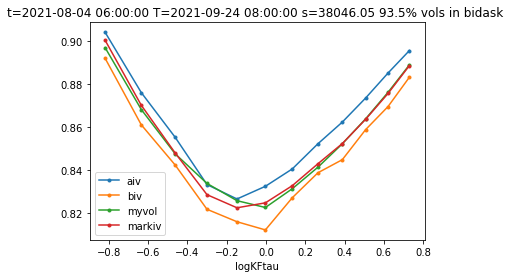

T=2021-09-24 08:00:00 t=2021-08-04 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.01331019  0.04911447  0.09472975  0.04681229  0.14926048 -0.23983121]


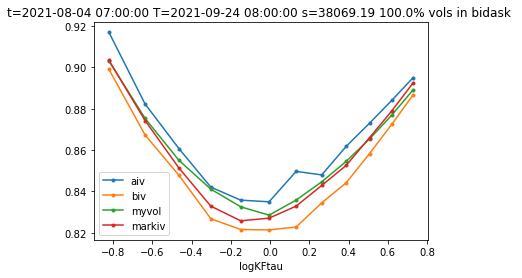

T=2021-09-24 08:00:00 t=2021-08-04 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00329605  0.04689306  0.1027184   0.04784967  0.15418403 -0.2275622 ]


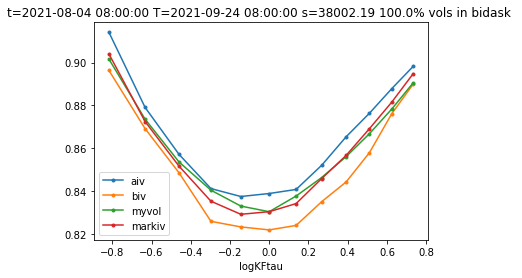

T=2021-09-24 08:00:00 t=2021-08-04 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.0007022   0.04709304  0.10677788  0.05126052  0.15251744 -0.2273155 ]


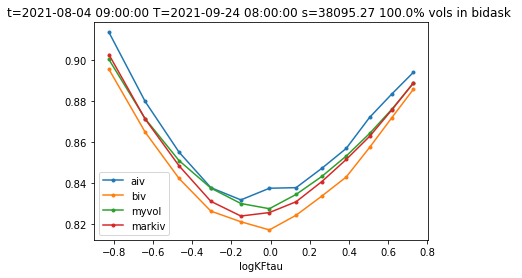

T=2021-09-24 08:00:00 t=2021-08-04 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.0016904   0.06511744  0.10147015  0.04711106  0.17216984 -0.23531343]


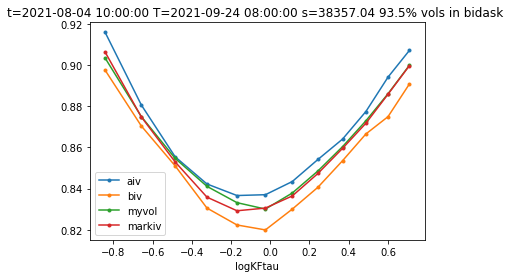

T=2021-09-24 08:00:00 t=2021-08-04 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[-0.00188537  0.06222443  0.10144984  0.04888102  0.16923707 -0.23393024]


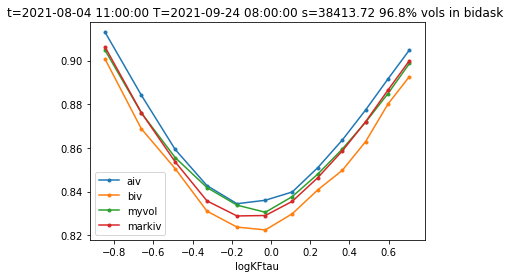

T=2021-09-24 08:00:00 t=2021-08-04 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01612692  0.06900127  0.11003659  0.0442269   0.15760683 -0.24170887]


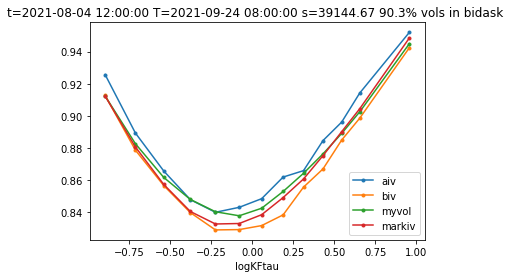

T=2021-09-24 08:00:00 t=2021-08-04 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0205187   0.07753443  0.112694    0.03852059  0.1573342  -0.23617325]


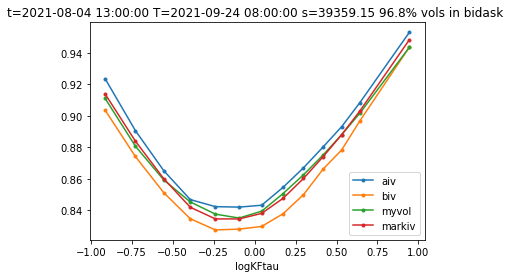

T=2021-09-24 08:00:00 t=2021-08-04 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02296012  0.07894115  0.11397748  0.03733565  0.1585667  -0.21361722]


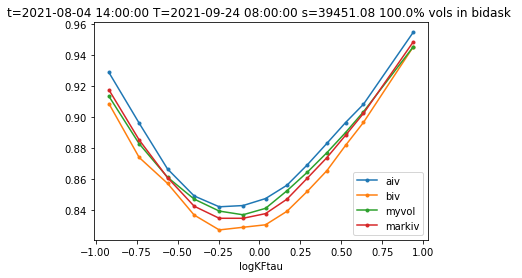

T=2021-09-24 08:00:00 t=2021-08-04 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02876745  0.08259292  0.11628548  0.03448008  0.16021921 -0.21631992]


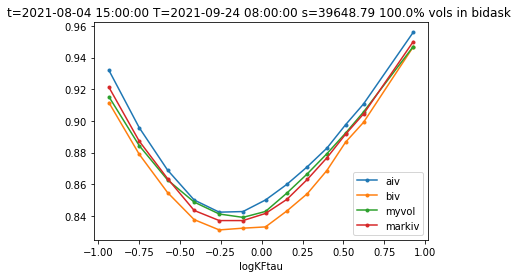

T=2021-09-24 08:00:00 t=2021-08-04 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02664955  0.07993432  0.1143628   0.03546263  0.15678949 -0.2179787 ]


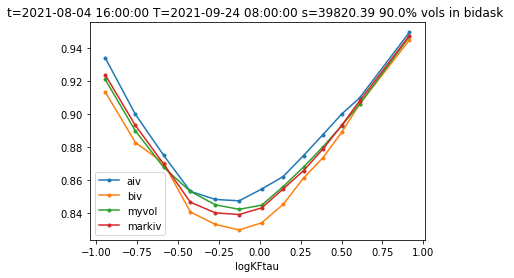

T=2021-09-24 08:00:00 t=2021-08-04 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02590133  0.07497571  0.1140655   0.03744419  0.15814386 -0.21955377]


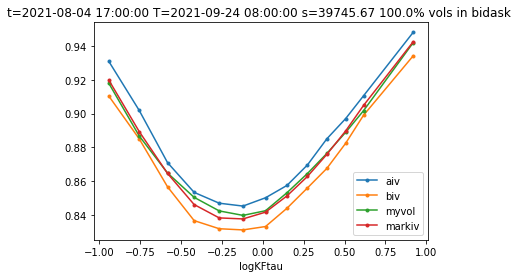

T=2021-09-24 08:00:00 t=2021-08-04 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02091847  0.07672465  0.10864074  0.03802657  0.15544321 -0.2256981 ]


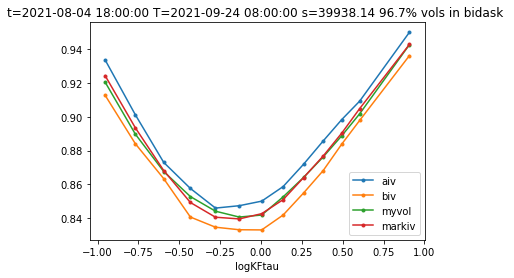

T=2021-09-24 08:00:00 t=2021-08-04 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01678598  0.08324398  0.10949114  0.03414705  0.16198124 -0.21882404]


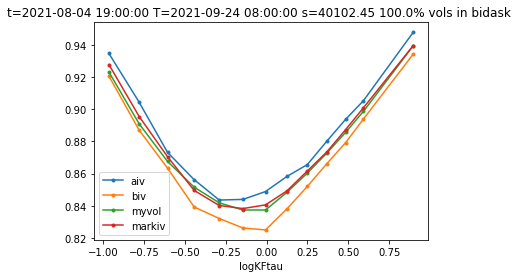

T=2021-09-24 08:00:00 t=2021-08-04 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01369151  0.07727756  0.10908454  0.03641821  0.15373761 -0.21272444]


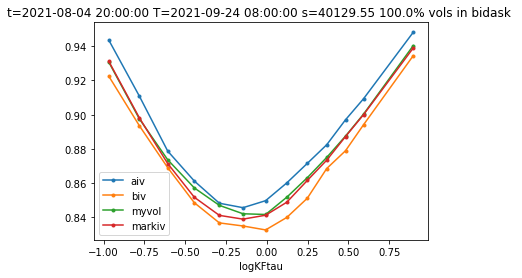

T=2021-09-24 08:00:00 t=2021-08-04 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01461868  0.07650508  0.10962057  0.03757355  0.15459979 -0.19539194]


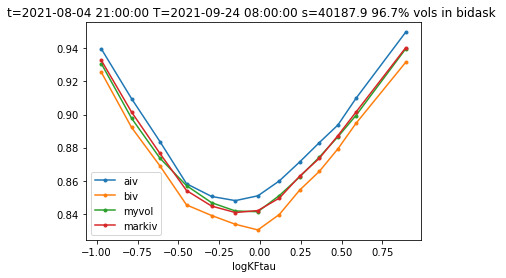

T=2021-09-24 08:00:00 t=2021-08-04 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02026443  0.06640552  0.11103256  0.04320714  0.15511764 -0.19535944]


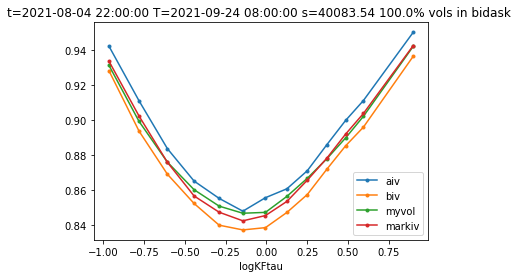

T=2021-09-24 08:00:00 t=2021-08-04 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01167781  0.07786807  0.10563381  0.0385736   0.15682802 -0.19937297]


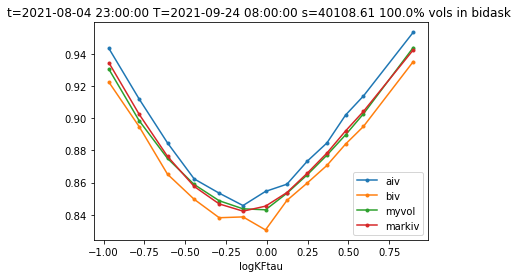

T=2021-09-24 08:00:00 t=2021-08-05 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02444052  0.07361492  0.11513706  0.04002055  0.15917765 -0.19181237]


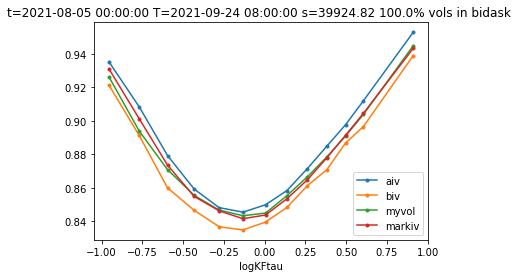

T=2021-09-24 08:00:00 t=2021-08-05 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01980255  0.07518839  0.11249129  0.0393939   0.16159481 -0.19311884]


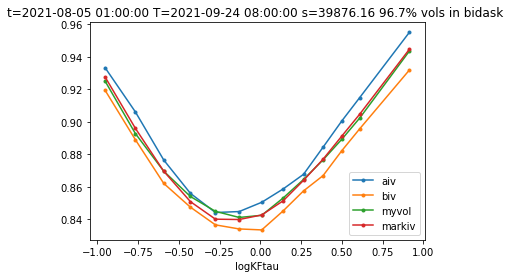

T=2021-09-24 08:00:00 t=2021-08-05 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02453731  0.07165945  0.11616131  0.04010956  0.16692355 -0.19182826]


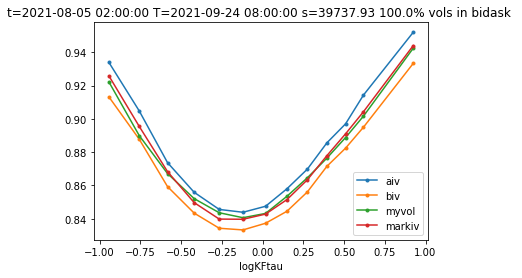

T=2021-09-24 08:00:00 t=2021-08-05 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01764757  0.07614961  0.11320091  0.03894364  0.16216541 -0.19163347]


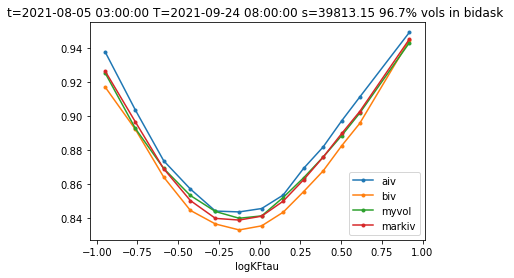

T=2021-09-24 08:00:00 t=2021-08-05 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01934459  0.074547    0.11153762  0.03920795  0.16152434 -0.19122199]


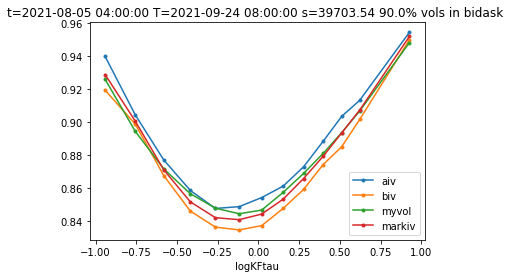

T=2021-09-24 08:00:00 t=2021-08-05 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00941438  0.07494524  0.1070753   0.03809475  0.1632372  -0.18427431]


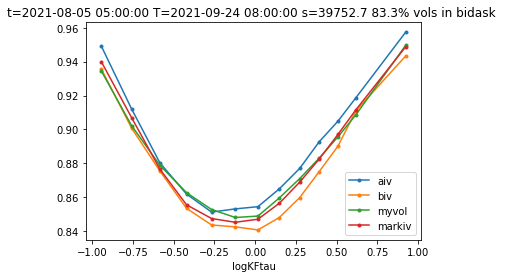

T=2021-09-24 08:00:00 t=2021-08-05 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00786826  0.07477287  0.1054497   0.03836291  0.16542264 -0.18308733]


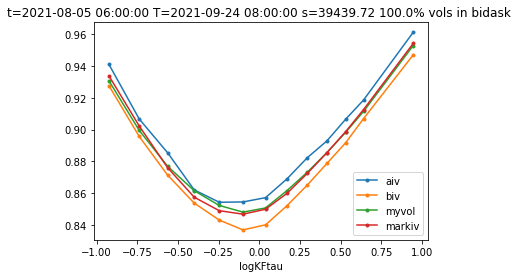

T=2021-09-24 08:00:00 t=2021-08-05 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01392019  0.07334226  0.10559264  0.03872783  0.14476917 -0.19897159]


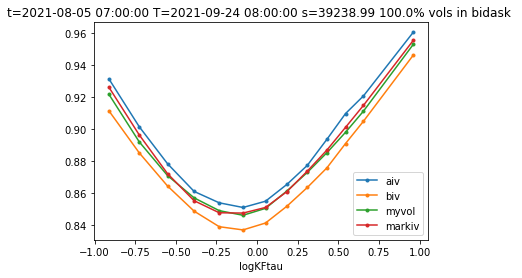

T=2021-09-24 08:00:00 t=2021-08-05 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01964235  0.07433535  0.11158407  0.03713291  0.1593125  -0.18776344]


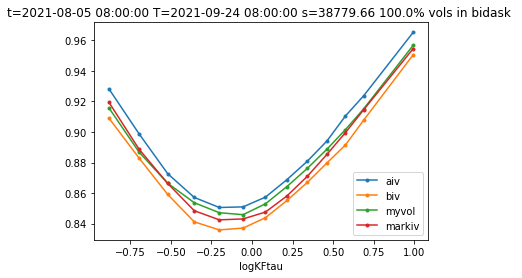

T=2021-09-24 08:00:00 t=2021-08-05 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01185823  0.06585393  0.10515446  0.04182338  0.15854191 -0.18863905]


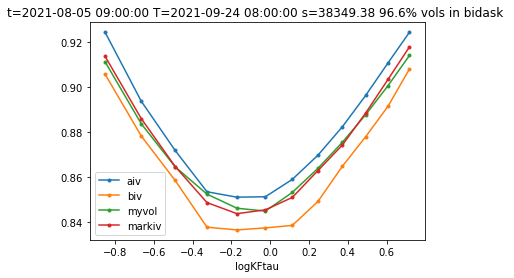

T=2021-09-24 08:00:00 t=2021-08-05 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.00616008  0.07054982  0.10291826  0.03881623  0.15320874 -0.18660604]


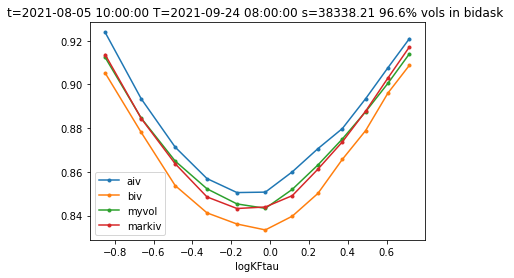

T=2021-09-24 08:00:00 t=2021-08-05 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01775101  0.06814502  0.10707637  0.04037968  0.15194717 -0.19486232]


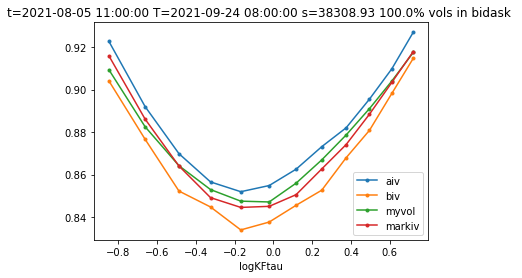

T=2021-09-24 08:00:00 t=2021-08-05 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01889057  0.07326926  0.10784592  0.0399551   0.16141018 -0.19558631]


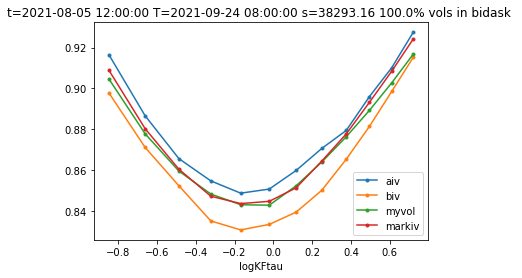

T=2021-09-24 08:00:00 t=2021-08-05 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01562146  0.06002537  0.10724064  0.04632234  0.16476044 -0.19179049]


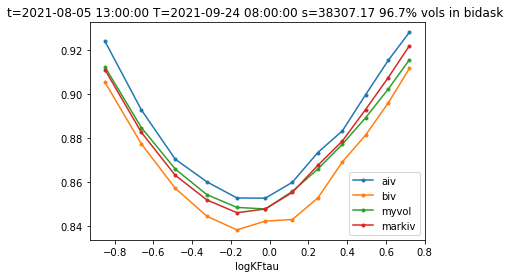

T=2021-09-24 08:00:00 t=2021-08-05 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01622488  0.07489097  0.10697842  0.03981971  0.15833477 -0.20322323]


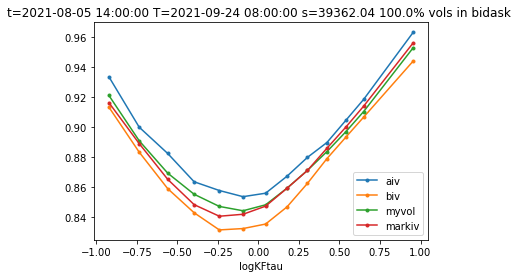

T=2021-09-24 08:00:00 t=2021-08-05 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02815392  0.06982823  0.11572487  0.04032031  0.15359324 -0.19122738]


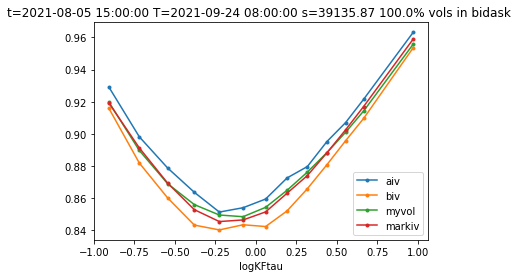

T=2021-09-24 08:00:00 t=2021-08-05 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01389229  0.08526681  0.1047567   0.03301273  0.15800484 -0.20670691]


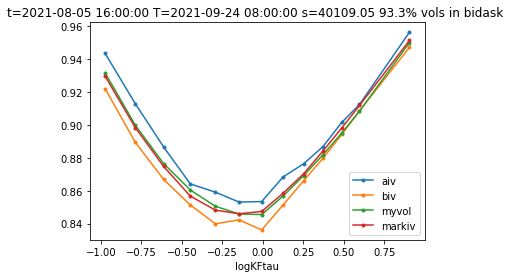

T=2021-09-24 08:00:00 t=2021-08-05 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01689151  0.07036945  0.10384923  0.03565671  0.15013317 -0.21323115]


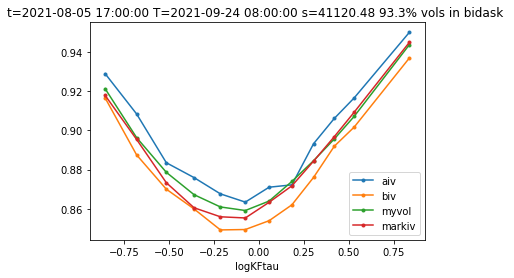

T=2021-09-24 08:00:00 t=2021-08-05 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01717844  0.0679486   0.09772682  0.03488776  0.14879496 -0.21891819]


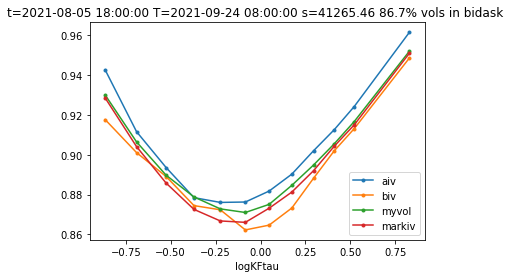

T=2021-09-24 08:00:00 t=2021-08-05 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03528874  0.05663492  0.11012108  0.04220333  0.15027538 -0.21177599]


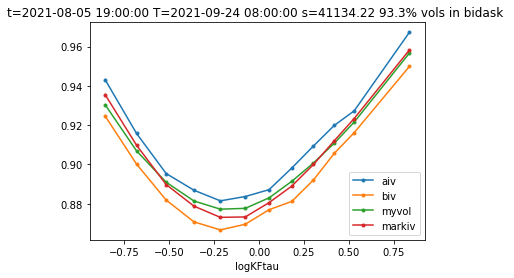

T=2021-09-24 08:00:00 t=2021-08-05 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04645775  0.05536032  0.11825283  0.0411693   0.14957893 -0.20780433]


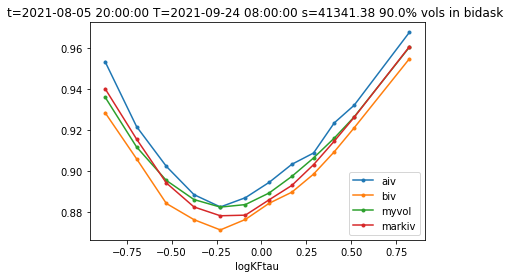

T=2021-09-24 08:00:00 t=2021-08-05 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04558997  0.06365553  0.11788573  0.0377977   0.15031629 -0.20926329]


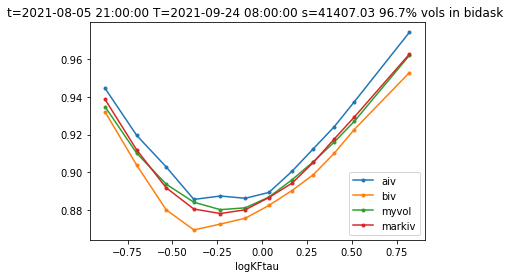

T=2021-09-24 08:00:00 t=2021-08-05 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03975744  0.06155005  0.11372732  0.03913342  0.1486716  -0.2109753 ]


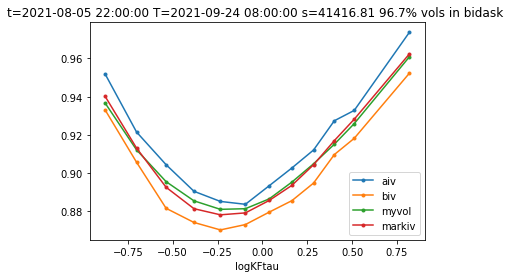

T=2021-09-24 08:00:00 t=2021-08-05 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03931315  0.05881456  0.11399805  0.04130189  0.14649331 -0.20522463]


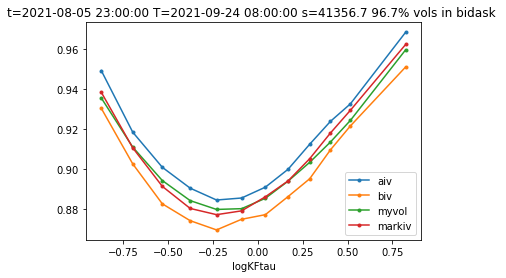

T=2021-09-24 08:00:00 t=2021-08-06 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03211083  0.06217093  0.11100212  0.03579397  0.15942291 -0.19899966]


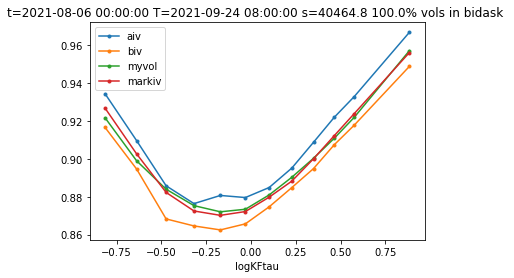

T=2021-09-24 08:00:00 t=2021-08-06 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03995944  0.0653261   0.11608609  0.03312912  0.16544238 -0.20361365]


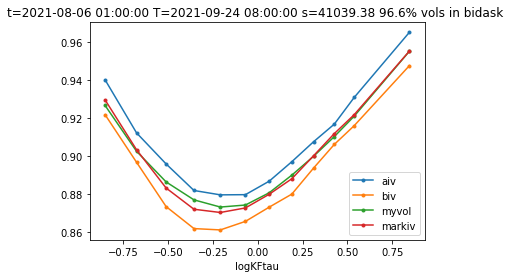

T=2021-09-24 08:00:00 t=2021-08-06 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02719102  0.07130036  0.1076195   0.03127593  0.17098639 -0.19986787]


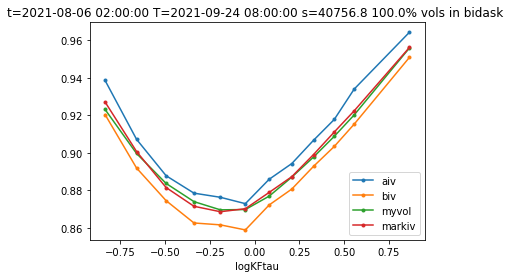

T=2021-09-24 08:00:00 t=2021-08-06 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02583261  0.06364742  0.10711716  0.0368454   0.14351777 -0.19967469]


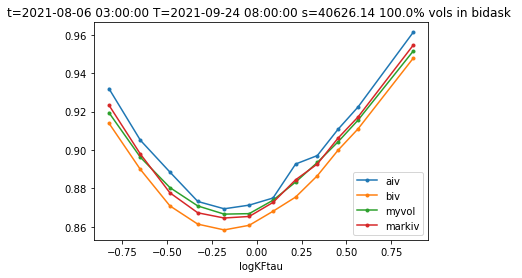

T=2021-09-24 08:00:00 t=2021-08-06 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03277871  0.05780537  0.1128567   0.03898391  0.15772712 -0.19299498]


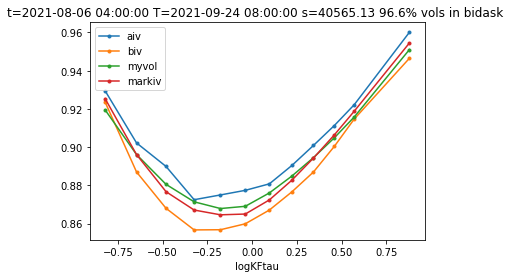

T=2021-09-24 08:00:00 t=2021-08-06 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02882782  0.06330253  0.11058715  0.03600153  0.15140279 -0.20343961]


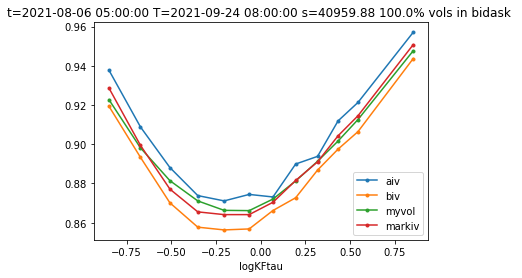

T=2021-09-24 08:00:00 t=2021-08-06 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03789456  0.06513377  0.11724547  0.03361284  0.16253358 -0.21102679]


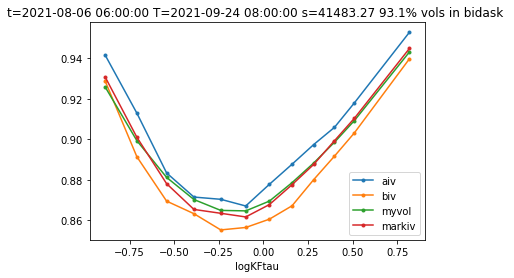

T=2021-09-24 08:00:00 t=2021-08-06 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02858107  0.05527427  0.11522199  0.03977682  0.14321535 -0.20884947]


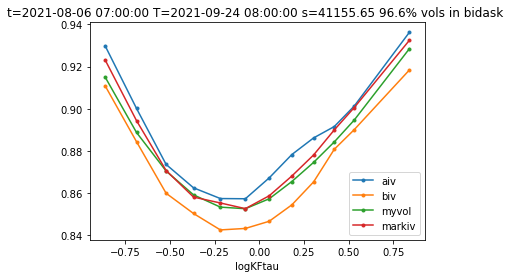

T=2021-09-24 08:00:00 t=2021-08-06 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02376725  0.06673245  0.11407979  0.03366538  0.16627778 -0.21164691]


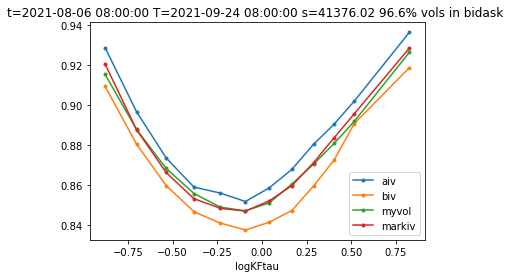

T=2021-09-24 08:00:00 t=2021-08-06 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02409799  0.05532546  0.11394042  0.04081253  0.14500674 -0.20863085]


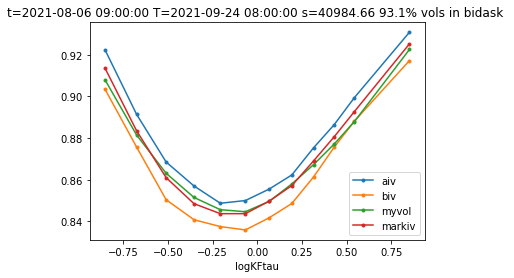

T=2021-09-24 08:00:00 t=2021-08-06 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02843248  0.05197137  0.11820191  0.0428881   0.14017009 -0.21114048]


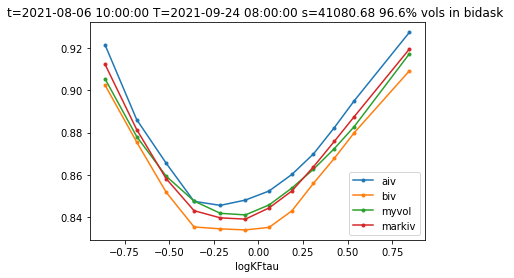

T=2021-09-24 08:00:00 t=2021-08-06 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02204594  0.06222633  0.11497129  0.03817569  0.14613122 -0.20832775]


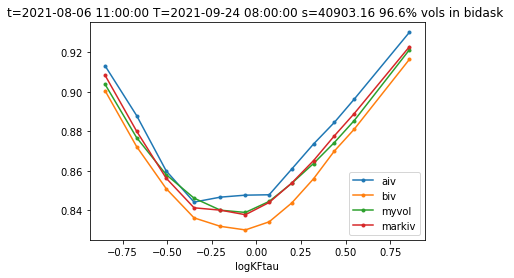

T=2021-09-24 08:00:00 t=2021-08-06 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02420902  0.05684864  0.11741972  0.03971172  0.13901005 -0.211172  ]


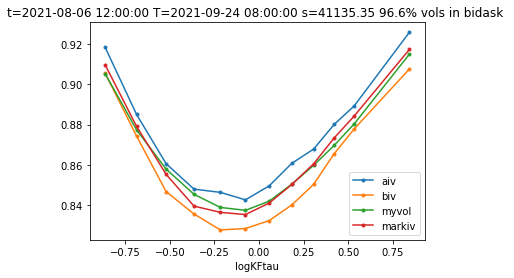

T=2021-09-24 08:00:00 t=2021-08-06 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03633606  0.05979836  0.12387105  0.03716364  0.15018769 -0.21869165]


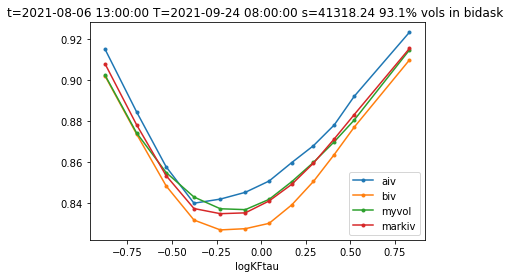

T=2021-09-24 08:00:00 t=2021-08-06 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02389752  0.05739581  0.11462427  0.03782829  0.15360825 -0.2186653 ]


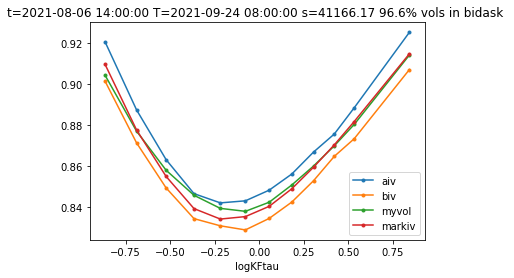

T=2021-09-24 08:00:00 t=2021-08-06 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01397458  0.04808308  0.10743974  0.03604339  0.1860449  -0.22122578]


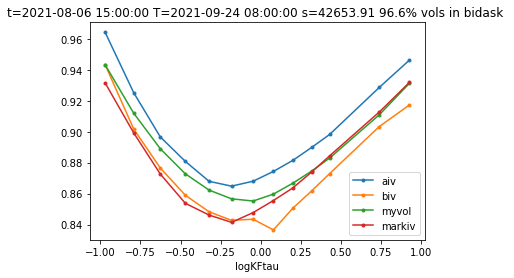

T=2021-09-24 08:00:00 t=2021-08-06 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02961201  0.06125322  0.11328664  0.03047593  0.14597117 -0.21748475]


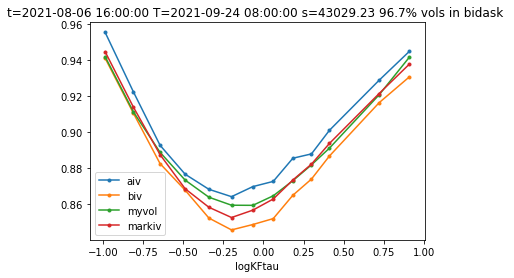

T=2021-09-24 08:00:00 t=2021-08-06 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03644214  0.0514179   0.1188989   0.03475704  0.16261574 -0.22924672]


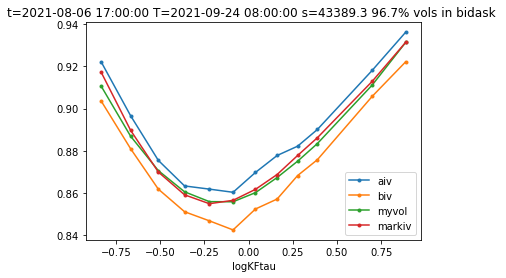

T=2021-09-24 08:00:00 t=2021-08-06 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03592383  0.05615898  0.11634559  0.03445599  0.15717485 -0.22597404]


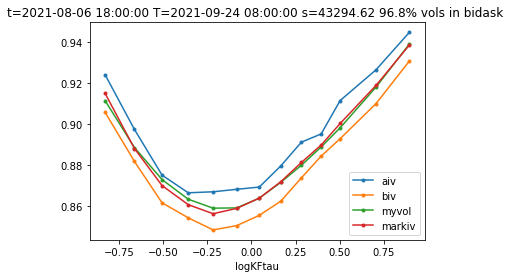

T=2021-09-24 08:00:00 t=2021-08-06 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04449738  0.06020065  0.12058989  0.03348523  0.15675426 -0.22551178]


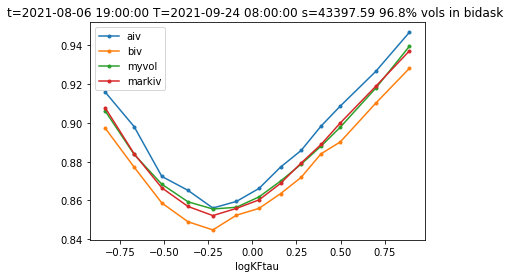

T=2021-09-24 08:00:00 t=2021-08-06 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04252196  0.06292998  0.12139629  0.03272054  0.15717154 -0.22033655]


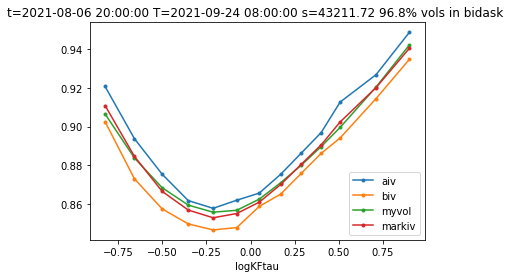

T=2021-09-24 08:00:00 t=2021-08-06 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03367828  0.06434419  0.11505624  0.03326127  0.16233128 -0.22478457]


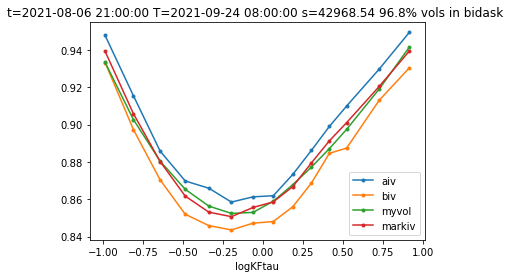

T=2021-09-24 08:00:00 t=2021-08-06 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0448615   0.06285713  0.12122842  0.03365338  0.15821858 -0.2254869 ]


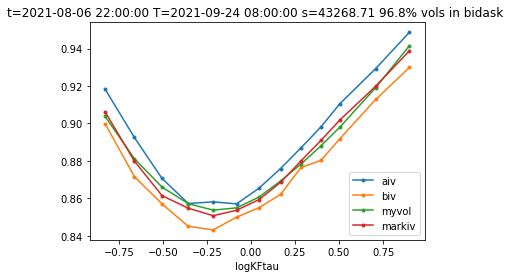

T=2021-09-24 08:00:00 t=2021-08-06 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04463943  0.06254523  0.12094571  0.03460045  0.15657997 -0.22741543]


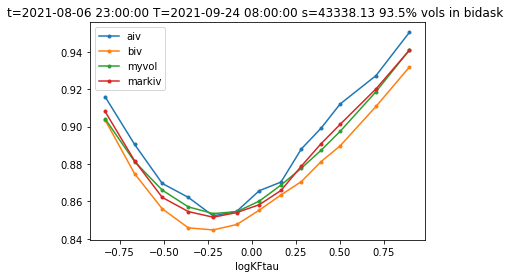

T=2021-09-24 08:00:00 t=2021-08-07 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04458101  0.058125    0.12049158  0.03578678  0.15248129 -0.22778296]


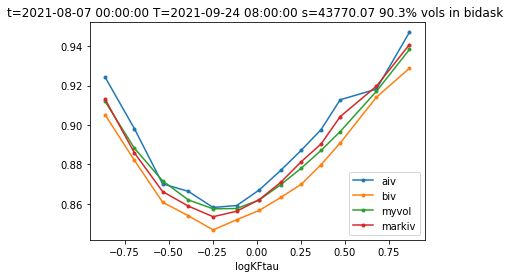

T=2021-09-24 08:00:00 t=2021-08-07 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04189061  0.05785732  0.11820502  0.03548139  0.15706343 -0.22962894]


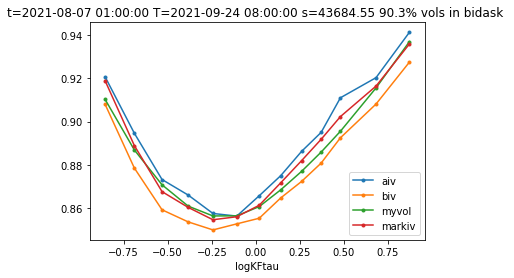

T=2021-09-24 08:00:00 t=2021-08-07 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04556752  0.05900393  0.12132793  0.03473257  0.16012305 -0.2344411 ]


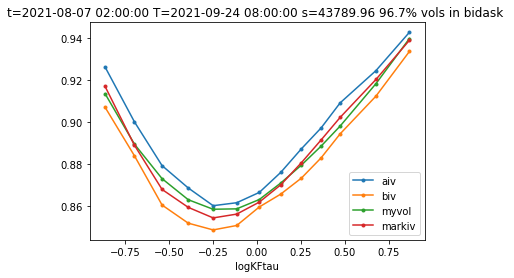

T=2021-09-24 08:00:00 t=2021-08-07 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02688348  0.07100675  0.11012329  0.03004787  0.16875166 -0.23593749]


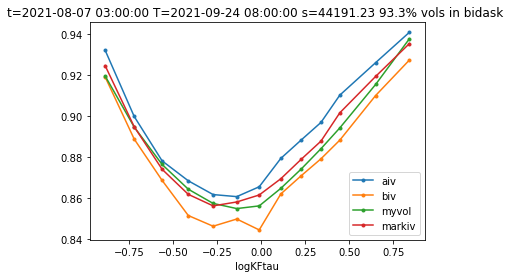

T=2021-09-24 08:00:00 t=2021-08-07 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02525644  0.06271717  0.11361262  0.03524388  0.16840306 -0.23000162]


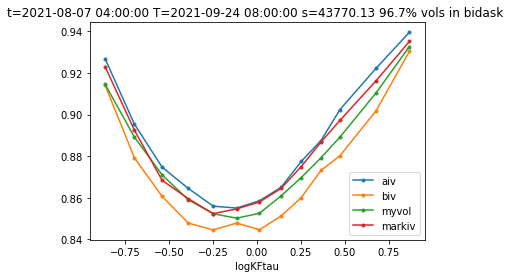

T=2021-09-24 08:00:00 t=2021-08-07 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03879362  0.0609457   0.12607212  0.03660616  0.16518743 -0.22875027]


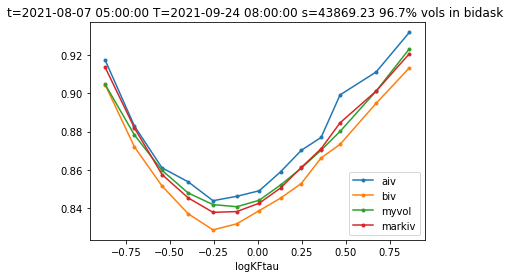

T=2021-09-24 08:00:00 t=2021-08-07 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02702398  0.06960491  0.12060593  0.03318855  0.17667129 -0.225568  ]


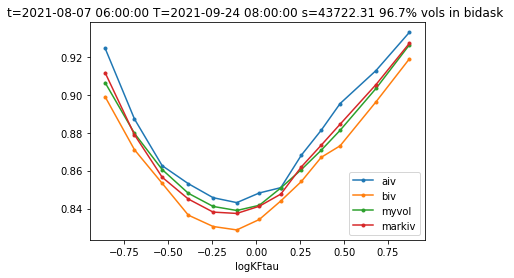

T=2021-09-24 08:00:00 t=2021-08-07 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04251442  0.06556704  0.13071345  0.03545415  0.16671941 -0.24535099]


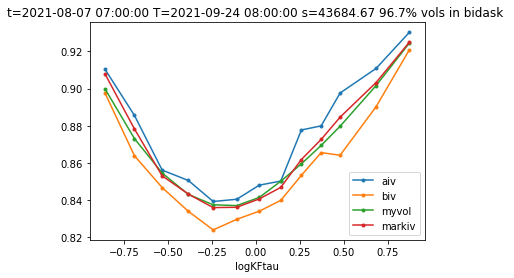

T=2021-09-24 08:00:00 t=2021-08-07 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03081698  0.06103072  0.12488194  0.0385138   0.16524299 -0.23282075]


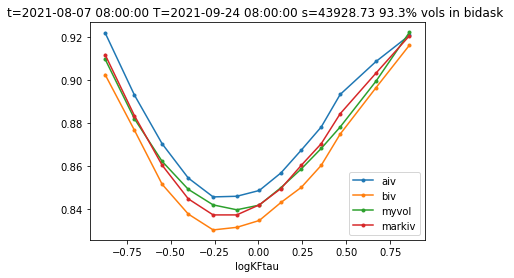

T=2021-09-24 08:00:00 t=2021-08-07 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03926645  0.06565405  0.13003424  0.03432898  0.16801625 -0.23531788]


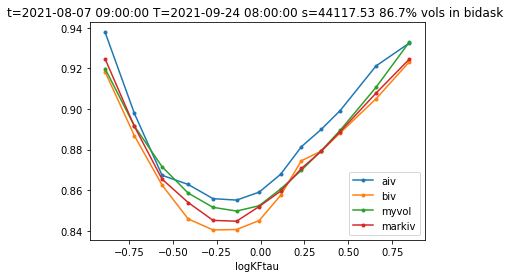

T=2021-09-24 08:00:00 t=2021-08-07 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03480606  0.06032467  0.11880717  0.0342227   0.1658974  -0.23096948]


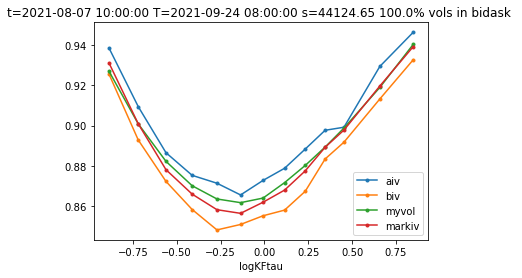

T=2021-09-24 08:00:00 t=2021-08-07 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02838077  0.06296265  0.11825489  0.0333851   0.16742701 -0.23601781]


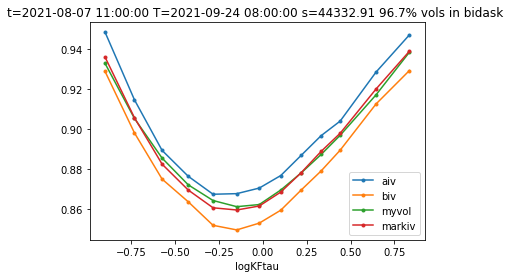

T=2021-09-24 08:00:00 t=2021-08-07 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02543673  0.06311163  0.12045764  0.03398243  0.17018149 -0.23603284]


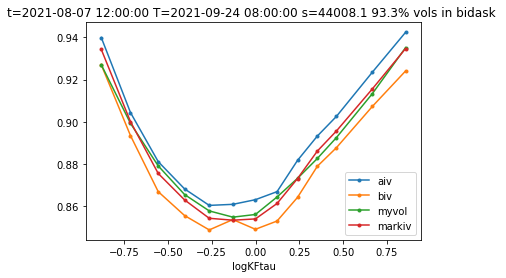

T=2021-09-24 08:00:00 t=2021-08-07 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03121135  0.06394632  0.12687701  0.03316084  0.15960599 -0.22894027]


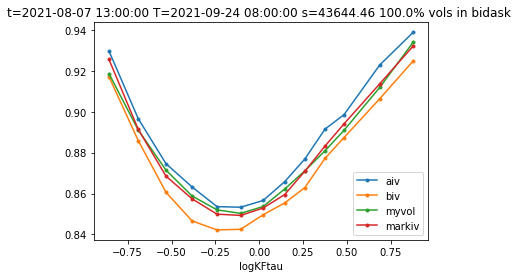

T=2021-09-24 08:00:00 t=2021-08-07 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03318704  0.05940525  0.1257052   0.03544255  0.16454374 -0.2357477 ]


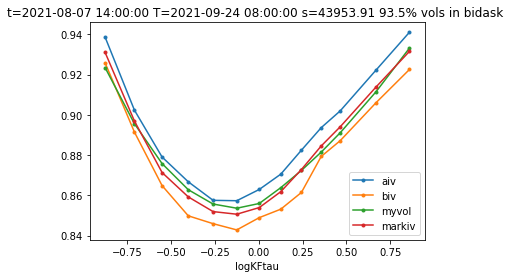

T=2021-09-24 08:00:00 t=2021-08-07 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02264042  0.06593974  0.12132776  0.03310629  0.16777425 -0.23322673]


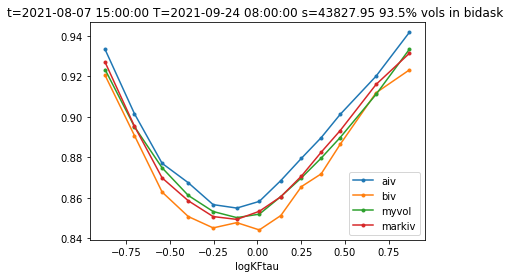

T=2021-09-24 08:00:00 t=2021-08-07 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02801316  0.06337993  0.12257157  0.03402888  0.1658642  -0.23472326]


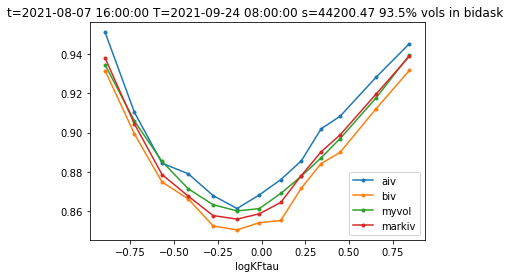

T=2021-09-24 08:00:00 t=2021-08-07 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02559053  0.0645752   0.1220303   0.03353487  0.1594146  -0.22490174]


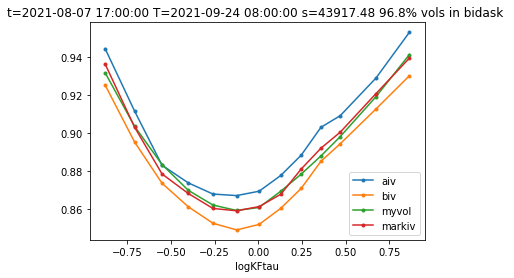

T=2021-09-24 08:00:00 t=2021-08-07 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03535015  0.05018737  0.12766643  0.03914544  0.1565014  -0.22911387]


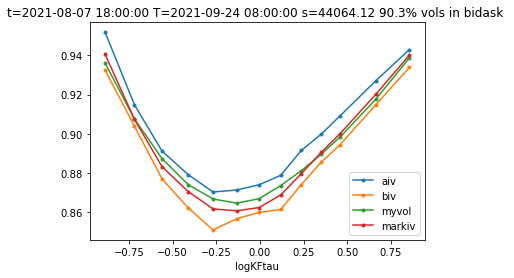

T=2021-09-24 08:00:00 t=2021-08-07 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02182602  0.05562289  0.12041054  0.03317385  0.17700934 -0.23028922]


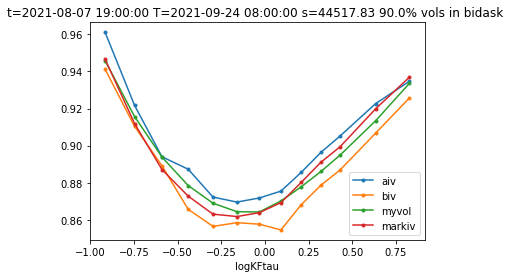

T=2021-09-24 08:00:00 t=2021-08-07 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02700088  0.05812405  0.12289752  0.03298761  0.17922741 -0.23751151]


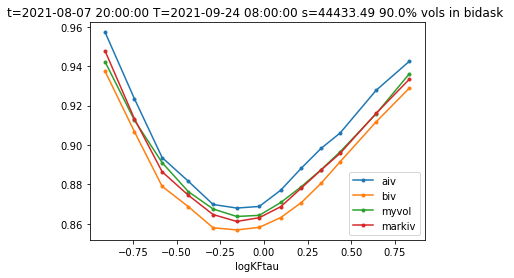

T=2021-09-24 08:00:00 t=2021-08-07 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01609125  0.05481173  0.11285994  0.03340082  0.17262235 -0.22343091]


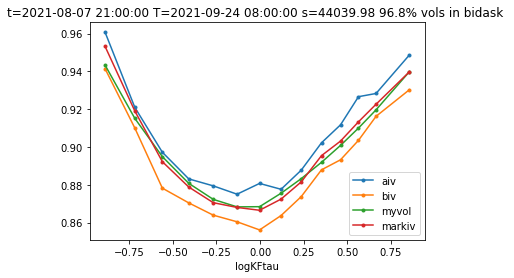

T=2021-09-24 08:00:00 t=2021-08-07 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02763883  0.05891221  0.12249997  0.03247056  0.17474854 -0.22695585]


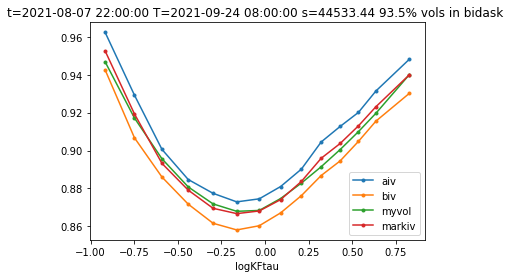

T=2021-09-24 08:00:00 t=2021-08-07 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03808893  0.0560332   0.1260321   0.03243129  0.16475419 -0.23596848]


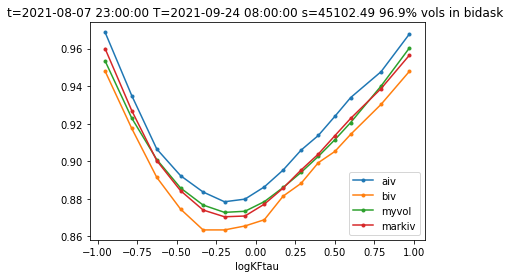

T=2021-09-24 08:00:00 t=2021-08-08 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03671623  0.05640683  0.12531417  0.03240048  0.16539977 -0.23687457]


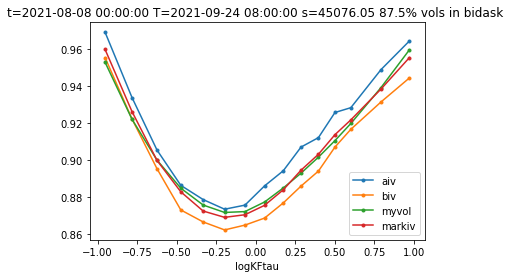

T=2021-09-24 08:00:00 t=2021-08-08 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03258832  0.05671085  0.12537615  0.03318232  0.16382286 -0.22748811]


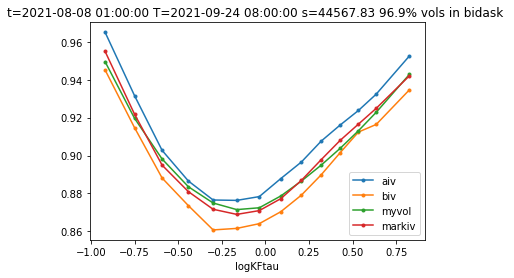

T=2021-09-24 08:00:00 t=2021-08-08 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03641315  0.04682531  0.12412021  0.03615675  0.16202422 -0.2245337 ]


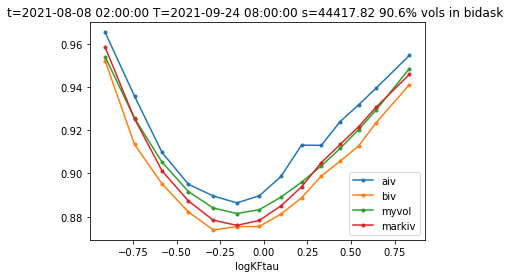

T=2021-09-24 08:00:00 t=2021-08-08 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03929569  0.05318291  0.12378489  0.03407636  0.16397774 -0.23733315]


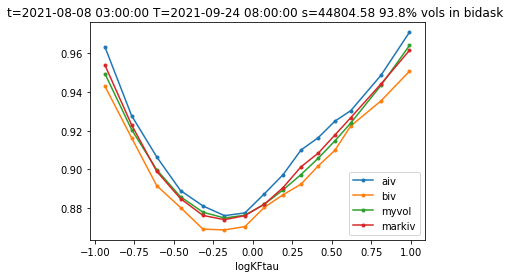

T=2021-09-24 08:00:00 t=2021-08-08 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0317589   0.05433151  0.12050892  0.03363332  0.16611216 -0.23441582]


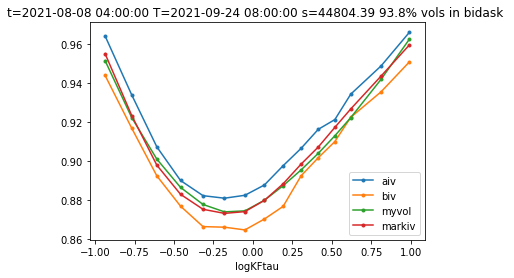

T=2021-09-24 08:00:00 t=2021-08-08 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02315756  0.05131323  0.11524206  0.03347211  0.16746545 -0.23737056]


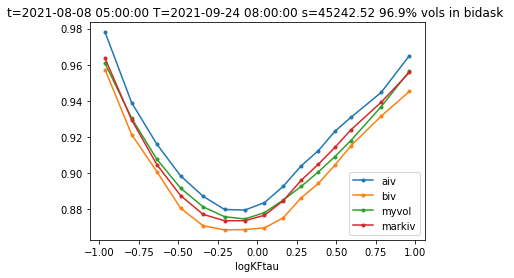

T=2021-09-24 08:00:00 t=2021-08-08 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03220663  0.0598324   0.12014383  0.02795952  0.16929788 -0.23283376]


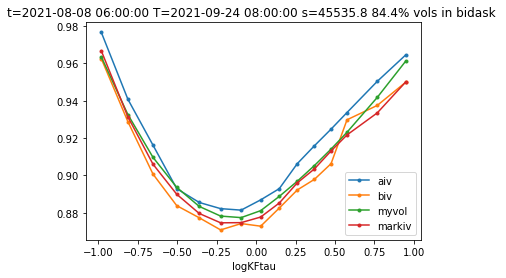

T=2021-09-24 08:00:00 t=2021-08-08 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05003236  0.06506525  0.1326217   0.02220015  0.14948459 -0.2177309 ]


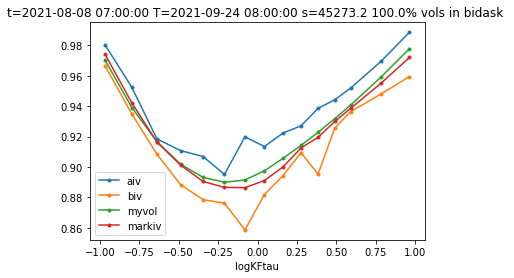

T=2021-09-24 08:00:00 t=2021-08-08 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02610527  0.0632229   0.11401951  0.02831605  0.15524324 -0.22809228]


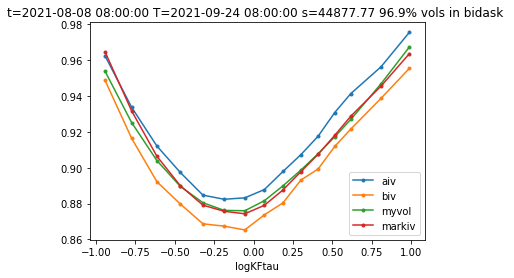

T=2021-09-24 08:00:00 t=2021-08-08 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02252253  0.05564792  0.11592085  0.03102781  0.15515763 -0.22496427]


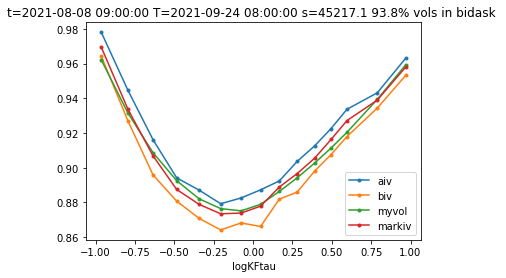

T=2021-09-24 08:00:00 t=2021-08-08 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03216495  0.08104092  0.12513389  0.01895079  0.16003702 -0.21949162]


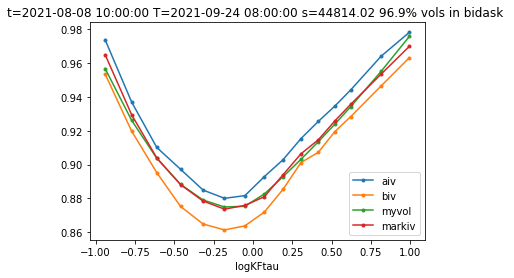

T=2021-09-24 08:00:00 t=2021-08-08 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02627498  0.07592909  0.12238129  0.02226469  0.15221372 -0.22774576]


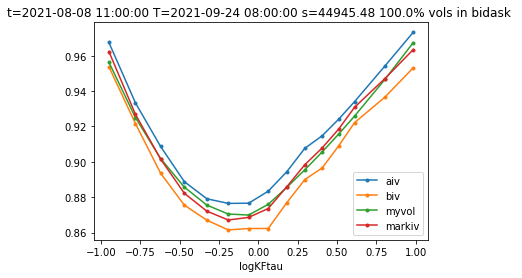

T=2021-09-24 08:00:00 t=2021-08-08 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0105548   0.0851128   0.11569454  0.01894402  0.147594   -0.22339208]


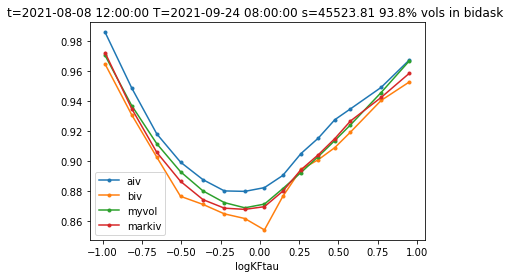

T=2021-09-24 08:00:00 t=2021-08-08 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02884583  0.06909936  0.12032006  0.02930637  0.15030523 -0.22533628]


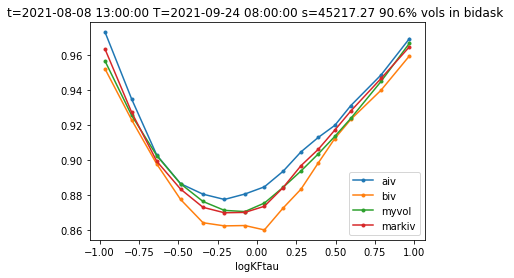

T=2021-09-24 08:00:00 t=2021-08-08 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02828217  0.07153753  0.1152179   0.0271356   0.1540401  -0.22467468]


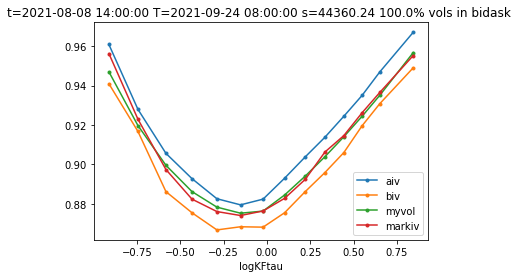

T=2021-09-24 08:00:00 t=2021-08-08 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02550336  0.06590499  0.11509878  0.02988742  0.15167545 -0.22298133]


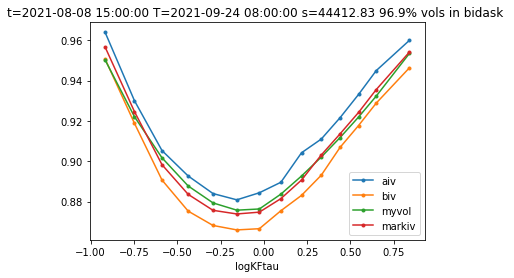

T=2021-09-24 08:00:00 t=2021-08-08 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01919587  0.07045276  0.11055517  0.02765185  0.14838313 -0.22958855]


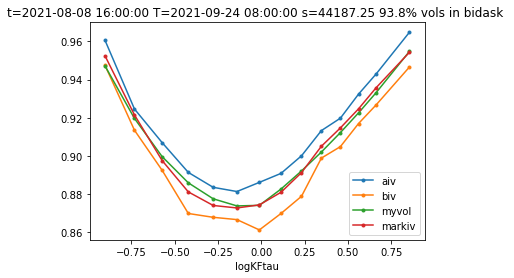

T=2021-09-24 08:00:00 t=2021-08-08 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01259872  0.07638429  0.10677131  0.02610927  0.1466032  -0.23001147]


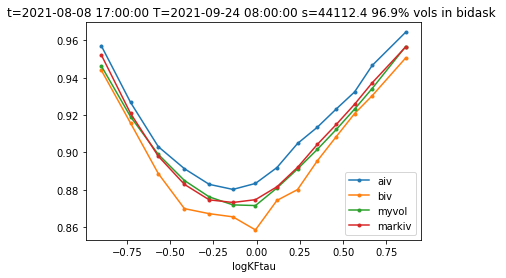

T=2021-09-24 08:00:00 t=2021-08-08 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0286622   0.06283061  0.11680718  0.03169074  0.14316481 -0.22646916]


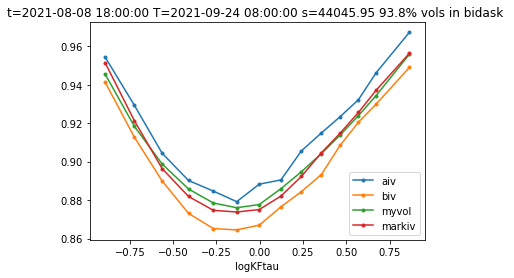

T=2021-09-24 08:00:00 t=2021-08-08 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0289592   0.07187923  0.11654897  0.02769636  0.14643371 -0.2239582 ]


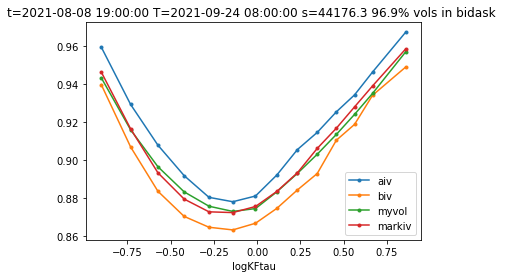

T=2021-09-24 08:00:00 t=2021-08-08 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0407496   0.0757374   0.12283988  0.02668521  0.15333526 -0.22463535]


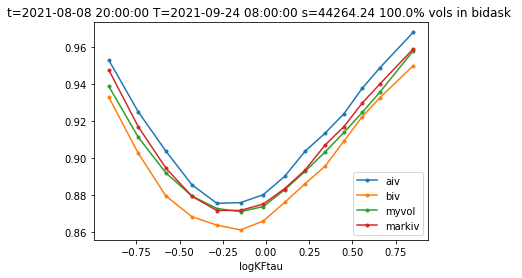

T=2021-09-24 08:00:00 t=2021-08-08 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04251601  0.07310689  0.12592691  0.02584602  0.15460473 -0.22521123]


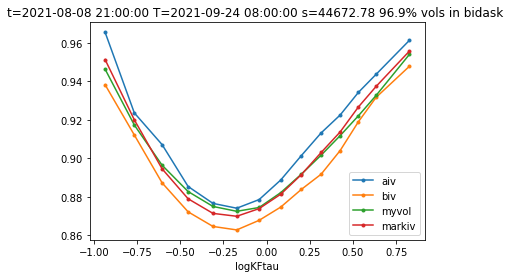

T=2021-09-24 08:00:00 t=2021-08-08 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04167939  0.07465707  0.1234727   0.02587109  0.15163738 -0.23443583]


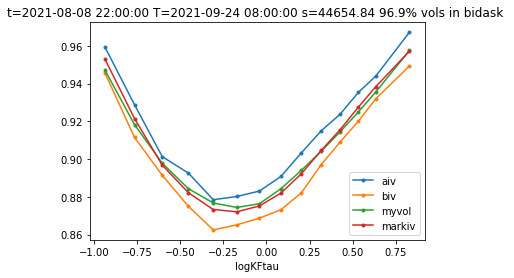

T=2021-09-24 08:00:00 t=2021-08-08 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0361278   0.07115489  0.11909121  0.02755418  0.15844155 -0.2289991 ]


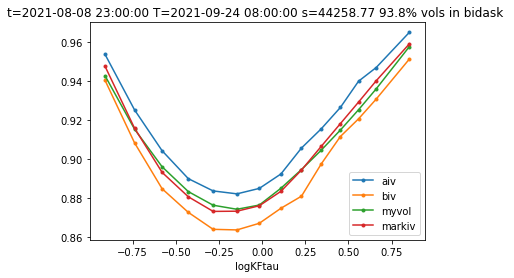

T=2021-09-24 08:00:00 t=2021-08-09 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03953113  0.06772351  0.12062241  0.02980731  0.1488125  -0.22653638]


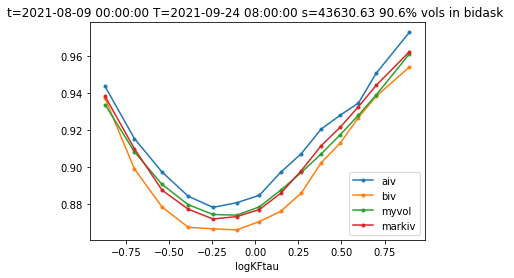

T=2021-09-24 08:00:00 t=2021-08-09 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03015049  0.06993443  0.11524758  0.02653845  0.15943002 -0.2305696 ]


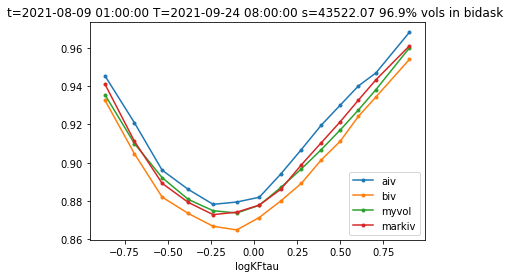

T=2021-09-24 08:00:00 t=2021-08-09 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02897602  0.07288142  0.11506408  0.02352896  0.1713783  -0.22735496]


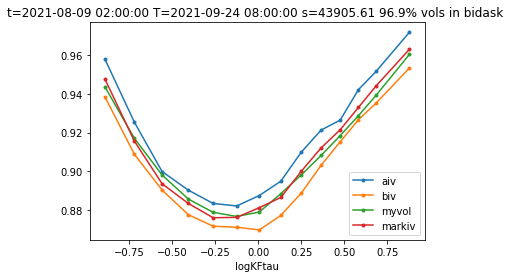

T=2021-09-24 08:00:00 t=2021-08-09 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0452745   0.07387715  0.12274235  0.0232883   0.15452543 -0.22626433]


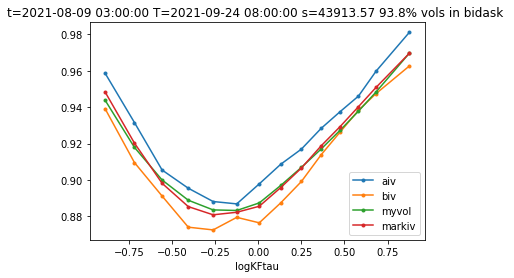

T=2021-09-24 08:00:00 t=2021-08-09 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04092862  0.0654354   0.11975395  0.02775316  0.16916057 -0.225265  ]


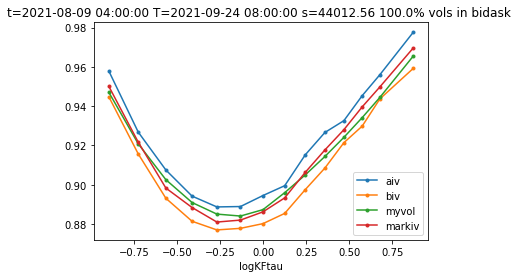

T=2021-09-24 08:00:00 t=2021-08-09 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03144453  0.07022863  0.11442882  0.02531085  0.17211477 -0.22616256]


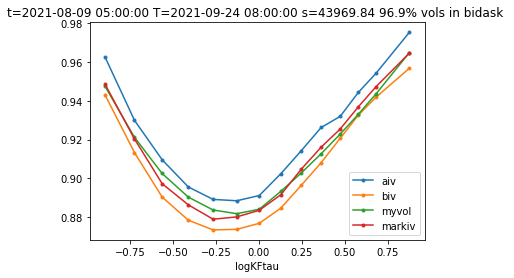

T=2021-09-24 08:00:00 t=2021-08-09 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03279164  0.06521377  0.11388036  0.02752576  0.1690394  -0.22749953]


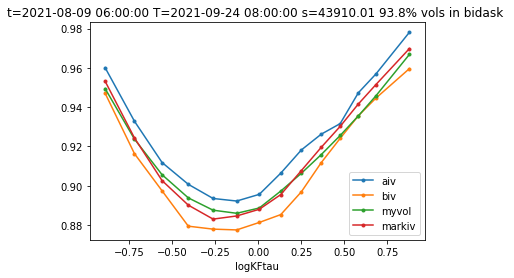

T=2021-09-24 08:00:00 t=2021-08-09 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03476364  0.0571008   0.11993591  0.02807139  0.17159468 -0.21930708]


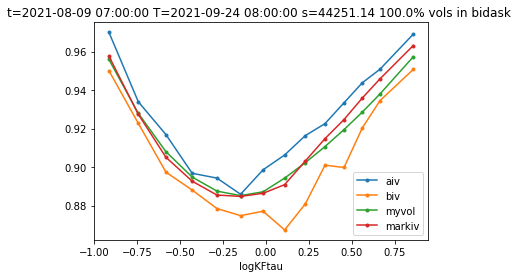

T=2021-09-24 08:00:00 t=2021-08-09 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02810903  0.06526436  0.10731904  0.02429717  0.16761426 -0.22364326]


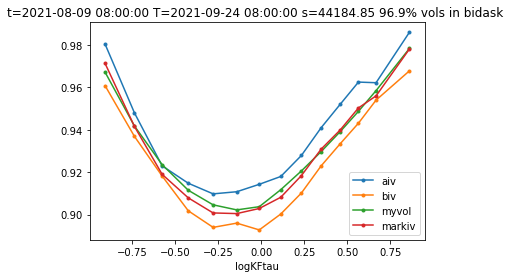

T=2021-09-24 08:00:00 t=2021-08-09 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03454772  0.06324382  0.11087695  0.02451602  0.16206074 -0.22551337]


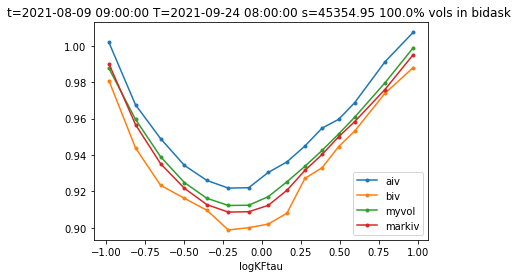

T=2021-09-24 08:00:00 t=2021-08-09 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04669726  0.06019773  0.11357243  0.02090684  0.14044509 -0.22031988]


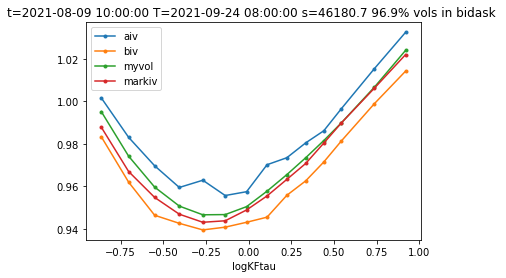

T=2021-09-24 08:00:00 t=2021-08-09 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04315715  0.06872812  0.10596812  0.01685124  0.15642938 -0.21725469]


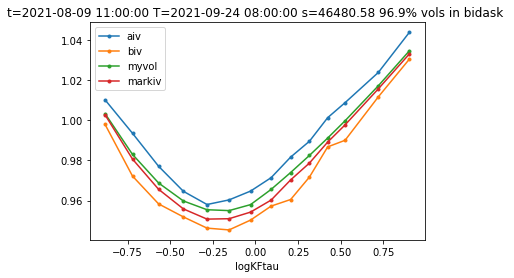

T=2021-09-24 08:00:00 t=2021-08-09 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03631141  0.06069721  0.1003254   0.02260552  0.16080762 -0.22156584]


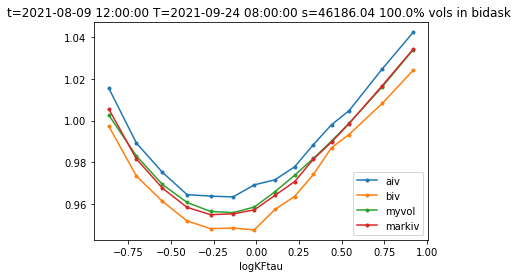

T=2021-09-24 08:00:00 t=2021-08-09 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04039146  0.06248154  0.10460043  0.02160961  0.15665385 -0.21501251]


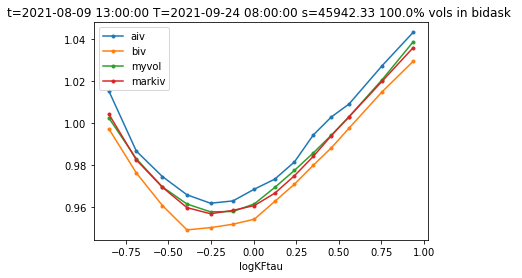

T=2021-09-24 08:00:00 t=2021-08-09 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0387714   0.07139812  0.1017238   0.01831909  0.1648713  -0.22005573]


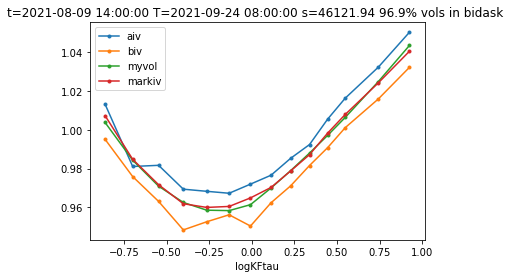

T=2021-09-24 08:00:00 t=2021-08-09 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03163288  0.06618313  0.09109625  0.01894148  0.16434578 -0.22076003]


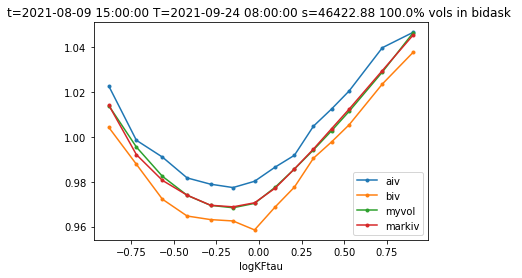

T=2021-09-24 08:00:00 t=2021-08-09 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03668518  0.06911524  0.09413055  0.01510302  0.16951005 -0.21715087]


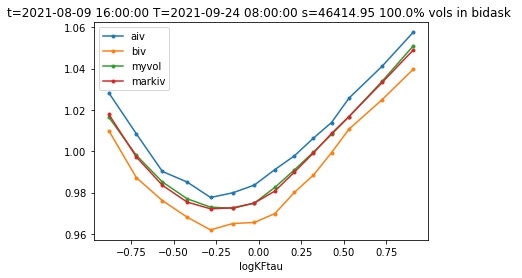

T=2021-09-24 08:00:00 t=2021-08-09 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0264196   0.06706638  0.08717612  0.01732249  0.17039739 -0.21832886]


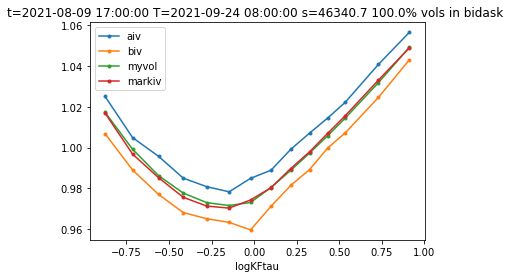

T=2021-09-24 08:00:00 t=2021-08-09 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04712823  0.07150203  0.09594983  0.01157423  0.17922329 -0.21870799]


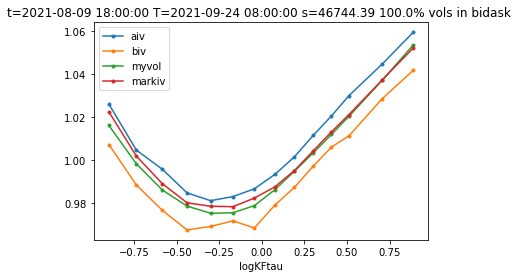

T=2021-09-24 08:00:00 t=2021-08-09 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04990259  0.06599666  0.09596958  0.01368302  0.16596972 -0.21588738]


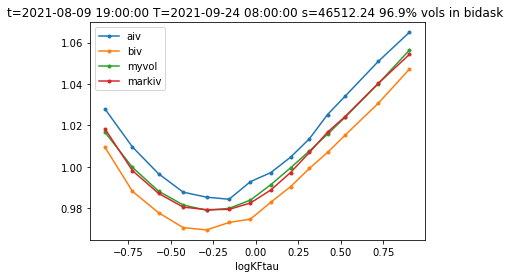

T=2021-09-24 08:00:00 t=2021-08-09 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0578205   0.07690916  0.09750907  0.00814726  0.16331864 -0.20665424]


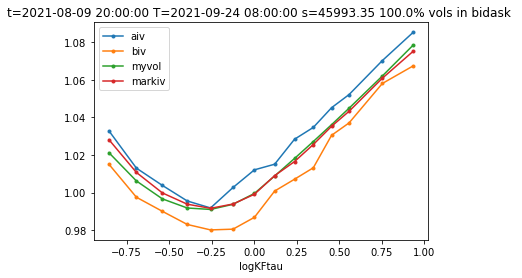

T=2021-09-24 08:00:00 t=2021-08-09 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05090268  0.07767832  0.09486258  0.00888207  0.15699075 -0.21115075]


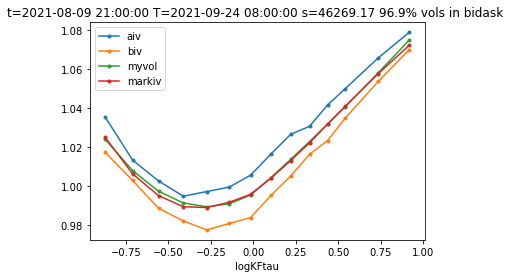

T=2021-09-24 08:00:00 t=2021-08-09 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.06263172  0.07237924  0.09997166  0.01005603  0.14023471 -0.21142632]


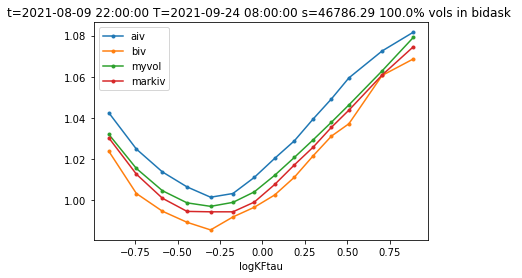

T=2021-09-24 08:00:00 t=2021-08-09 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04897492  0.08121587  0.08903697  0.00592089  0.15438981 -0.2153245 ]


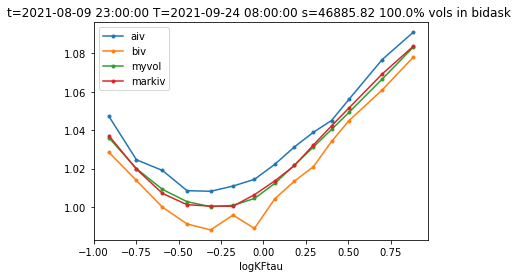

T=2021-09-24 08:00:00 t=2021-08-10 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05761295  0.0813986   0.09919367  0.0085527   0.15027754 -0.2084357 ]


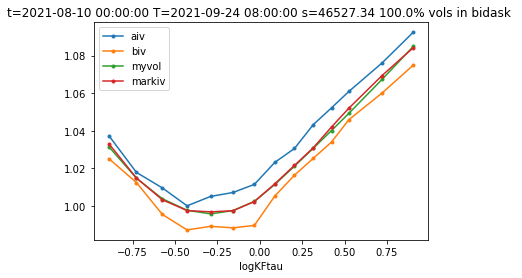

T=2021-09-24 08:00:00 t=2021-08-10 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04451199  0.06428578  0.09278941  0.01611196  0.14496603 -0.21673556]


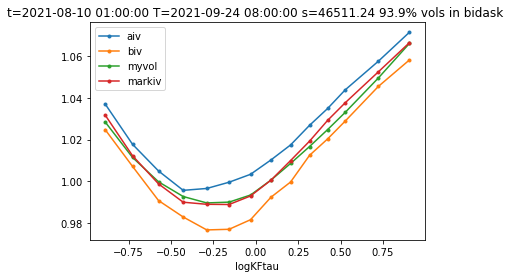

T=2021-09-24 08:00:00 t=2021-08-10 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04330794  0.06032454  0.09181037  0.01770269  0.16110092 -0.22314846]


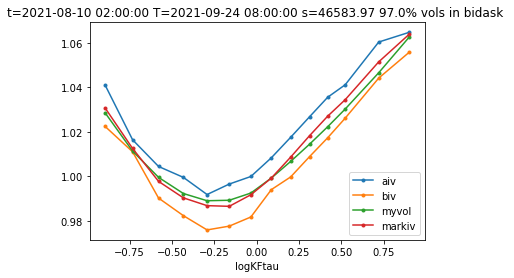

T=2021-09-24 08:00:00 t=2021-08-10 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03707237  0.05944865  0.0866188   0.01891327  0.14939631 -0.23325261]


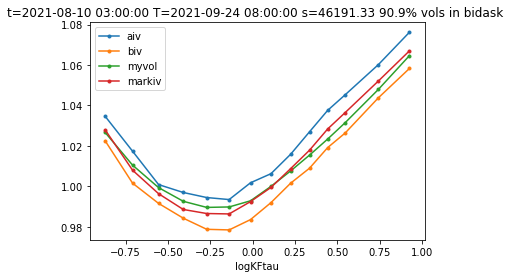

T=2021-09-24 08:00:00 t=2021-08-10 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04309751  0.06719775  0.09146637  0.01483143  0.16824674 -0.231565  ]


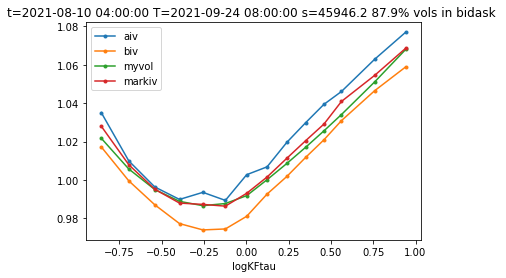

T=2021-09-24 08:00:00 t=2021-08-10 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03173773  0.07249834  0.08251316  0.01237943  0.15396782 -0.23313513]


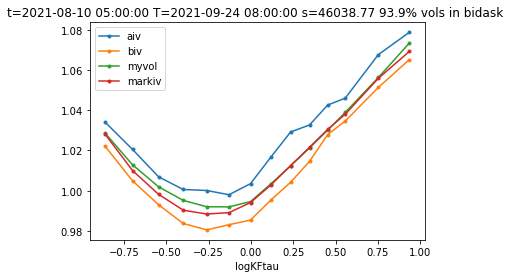

T=2021-09-24 08:00:00 t=2021-08-10 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03173394  0.06422134  0.08688734  0.01545557  0.15572842 -0.23636535]


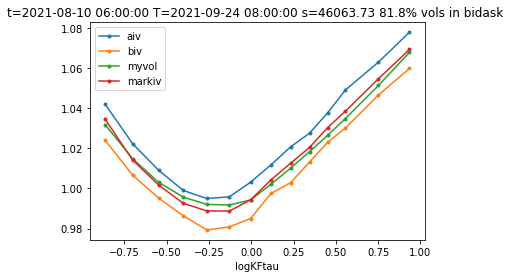

T=2021-09-24 08:00:00 t=2021-08-10 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04055151  0.06257806  0.08923393  0.0133709   0.14886402 -0.23227523]


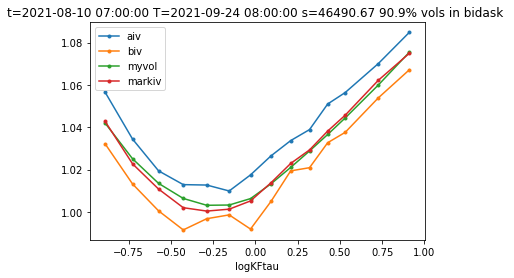

T=2021-09-24 08:00:00 t=2021-08-10 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03783609  0.05237326  0.0852572   0.01864767  0.14990922 -0.23483653]


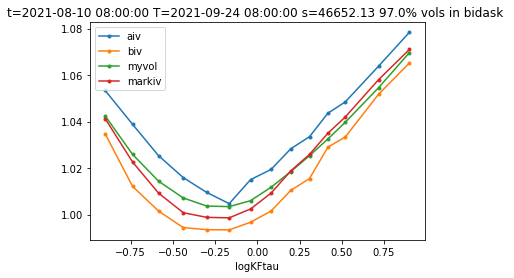

T=2021-09-24 08:00:00 t=2021-08-10 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03769974  0.06245959  0.08579943  0.01440889  0.14839761 -0.23629438]


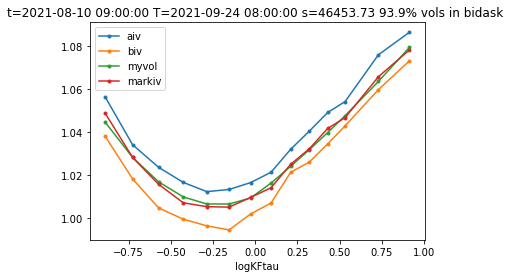

T=2021-09-24 08:00:00 t=2021-08-10 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02593737  0.05445852  0.08110007  0.02064112  0.14631084 -0.23022994]


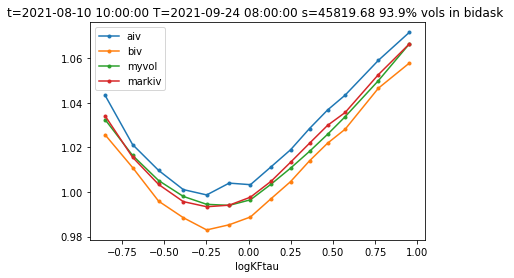

T=2021-09-24 08:00:00 t=2021-08-10 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01512033  0.06058913  0.0726797   0.0184213   0.14607836 -0.23345793]


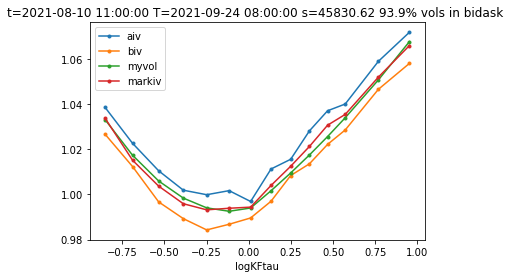

T=2021-09-24 08:00:00 t=2021-08-10 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02817771  0.06334052  0.08723625  0.01490204  0.16495804 -0.2128382 ]


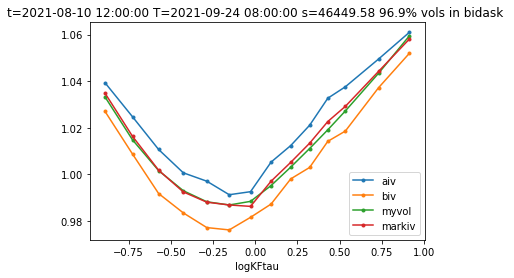

T=2021-09-24 08:00:00 t=2021-08-10 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02579377  0.06299396  0.08587232  0.01685861  0.16141017 -0.2219732 ]


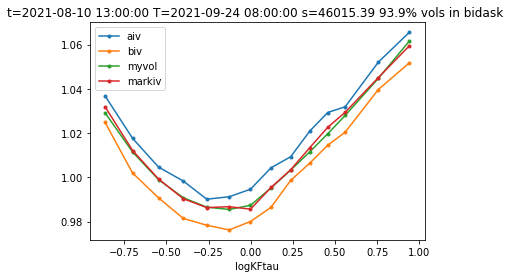

T=2021-09-24 08:00:00 t=2021-08-10 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02173687  0.05319719  0.08189285  0.01962195  0.17323344 -0.22255904]


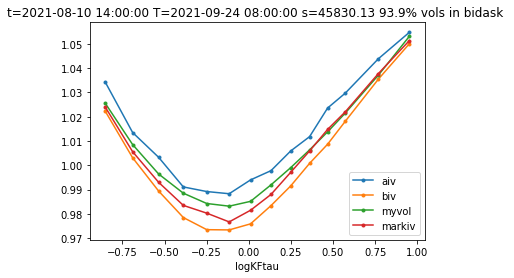

T=2021-09-24 08:00:00 t=2021-08-10 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01106653  0.05592437  0.07186133  0.01751429  0.17590512 -0.23133914]


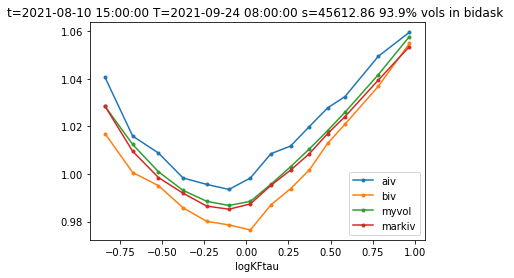

T=2021-09-24 08:00:00 t=2021-08-10 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02707381  0.05108119  0.08397385  0.02126411  0.17048222 -0.23449233]


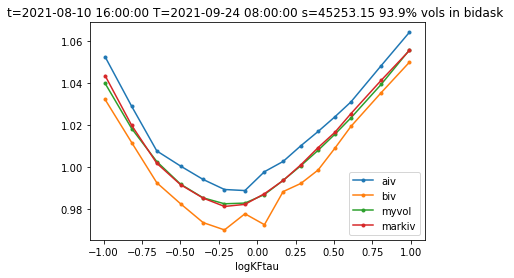

T=2021-09-24 08:00:00 t=2021-08-10 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02874055  0.04876929  0.0847198   0.0216014   0.17105228 -0.23311839]


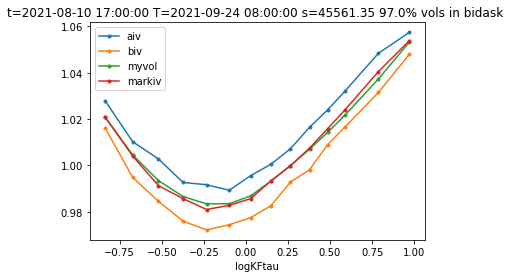

T=2021-09-24 08:00:00 t=2021-08-10 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01604499  0.05448236  0.07774166  0.01887652  0.17592202 -0.23183235]


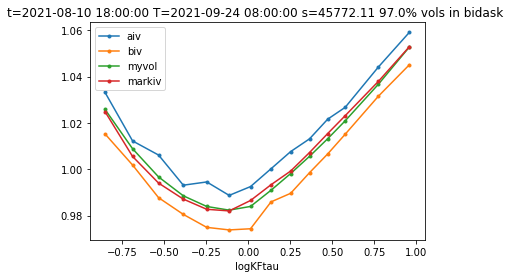

T=2021-09-24 08:00:00 t=2021-08-10 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02623776  0.05182548  0.08404226  0.01939229  0.17881348 -0.23345643]


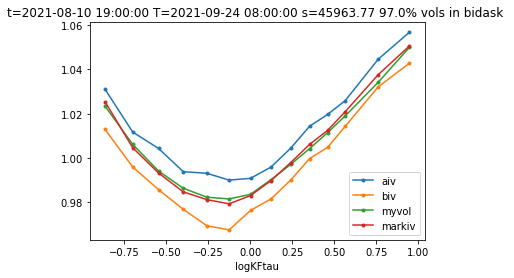

T=2021-09-24 08:00:00 t=2021-08-10 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01921118  0.06017223  0.08116344  0.01606724  0.18015738 -0.23525782]


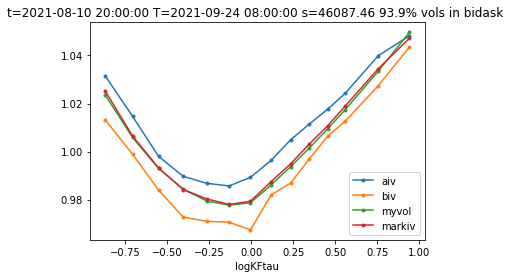

T=2021-09-24 08:00:00 t=2021-08-10 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03225701  0.06407373  0.0939408   0.01506027  0.16247259 -0.21810211]


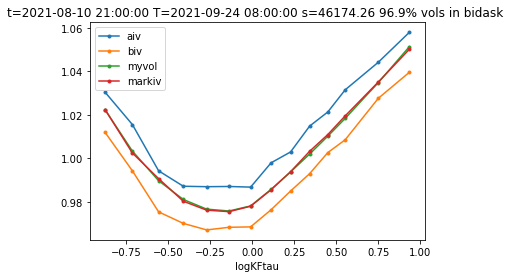

T=2021-09-24 08:00:00 t=2021-08-10 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03193332  0.06302189  0.09410325  0.01724777  0.17765601 -0.21719489]


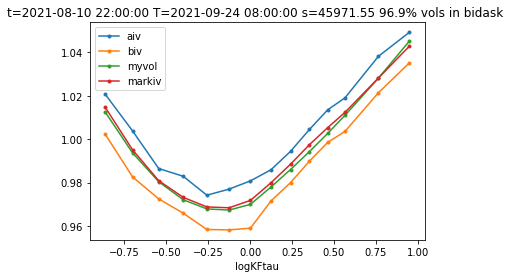

T=2021-09-24 08:00:00 t=2021-08-10 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03821439  0.06633477  0.09821843  0.01586359  0.17712197 -0.2237397 ]


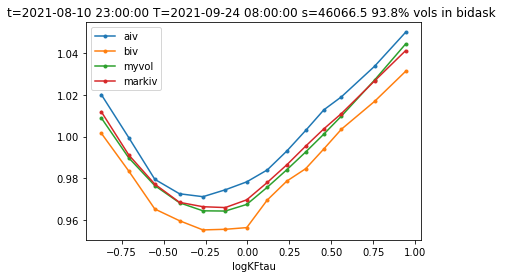

T=2021-09-24 08:00:00 t=2021-08-11 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02013358  0.06183604  0.08769985  0.01772976  0.17989686 -0.22494243]


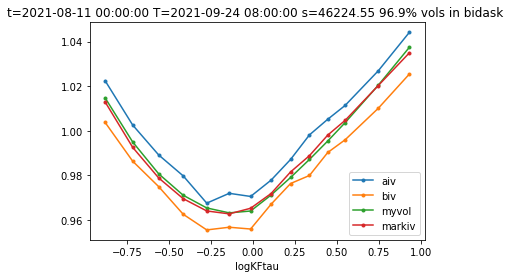

T=2021-09-24 08:00:00 t=2021-08-11 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02832886  0.05288915  0.09482767  0.02246214  0.15640019 -0.21624994]


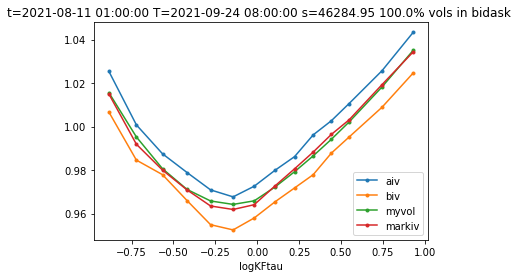

T=2021-09-24 08:00:00 t=2021-08-11 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02028614  0.05405028  0.09109396  0.02418639  0.15765279 -0.23062625]


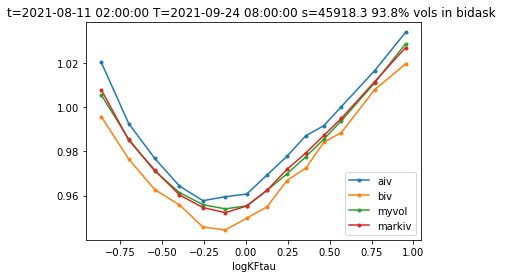

T=2021-09-24 08:00:00 t=2021-08-11 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02099939  0.06337893  0.09455054  0.01968938  0.16018307 -0.2173024 ]


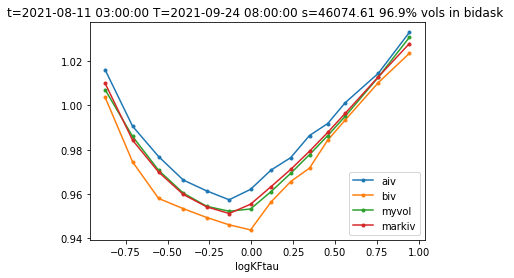

T=2021-09-24 08:00:00 t=2021-08-11 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02378198  0.06006498  0.09570137  0.02093888  0.15906028 -0.2200055 ]


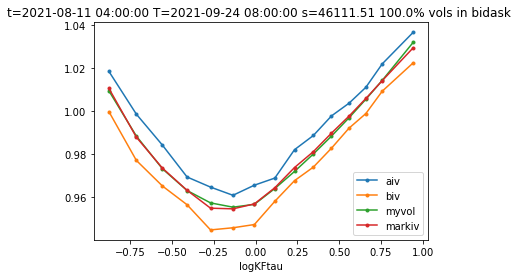

T=2021-09-24 08:00:00 t=2021-08-11 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02748598  0.05563076  0.09712513  0.02319099  0.15489303 -0.20512681]


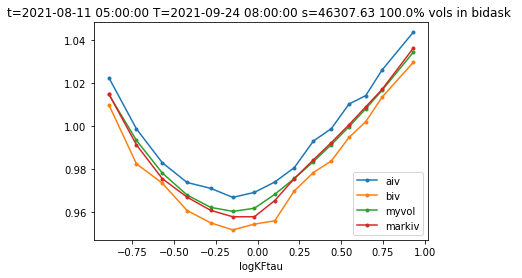

T=2021-09-24 08:00:00 t=2021-08-11 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02478359  0.05484091  0.09410673  0.02322031  0.1501447  -0.22204523]


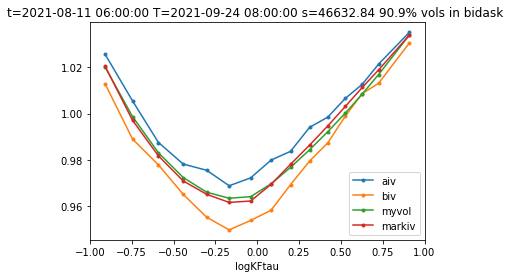

T=2021-09-24 08:00:00 t=2021-08-11 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02544605  0.06727524  0.09885854  0.01757077  0.15425951 -0.2326187 ]


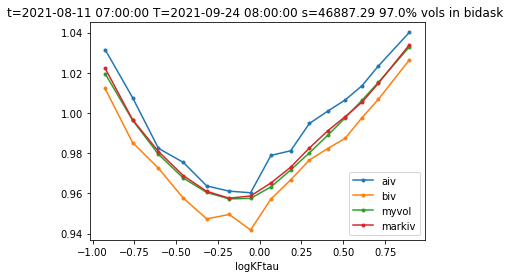

T=2021-09-24 08:00:00 t=2021-08-11 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02845029  0.06354297  0.09895182  0.01794581  0.16278837 -0.22525892]


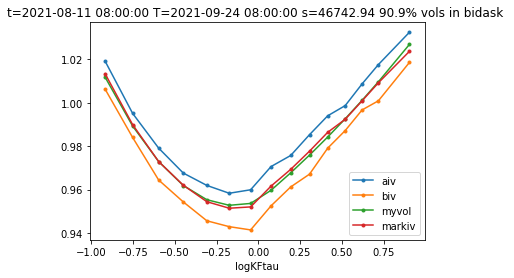

T=2021-09-24 08:00:00 t=2021-08-11 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03438366  0.05235179  0.1023785   0.02457521  0.15924214 -0.23701487]


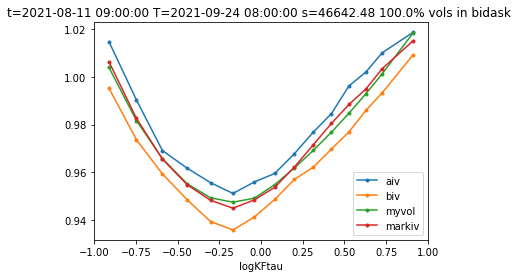

T=2021-09-24 08:00:00 t=2021-08-11 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02792684  0.05599616  0.09695864  0.02269179  0.16229392 -0.23759579]


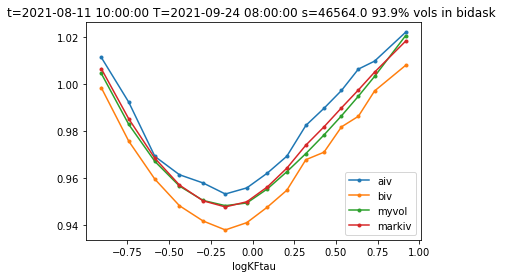

T=2021-09-24 08:00:00 t=2021-08-11 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03397476  0.05707144  0.09946446  0.02198636  0.16463643 -0.22850212]


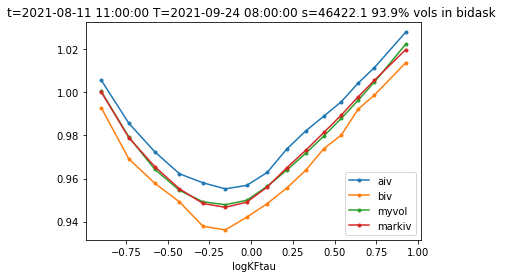

T=2021-09-24 08:00:00 t=2021-08-11 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02972642  0.05980469  0.09894273  0.02049426  0.16957381 -0.23177547]


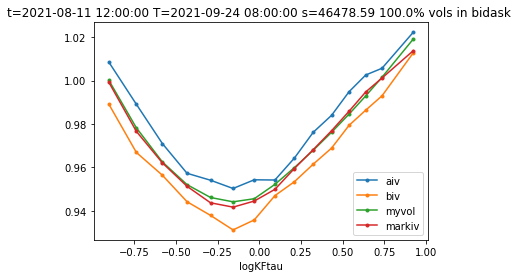

T=2021-09-24 08:00:00 t=2021-08-11 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03089787  0.05957828  0.09851276  0.02263063  0.15967195 -0.24428862]


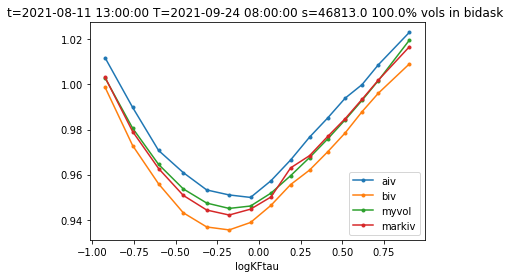

T=2021-09-24 08:00:00 t=2021-08-11 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.034566    0.05997756  0.10086457  0.02092053  0.15626745 -0.23042183]


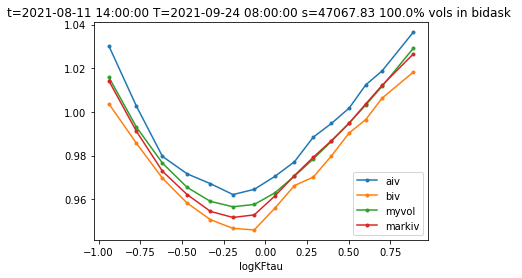

T=2021-09-24 08:00:00 t=2021-08-11 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03787099  0.06294413  0.1017084   0.01838385  0.15907371 -0.23304489]


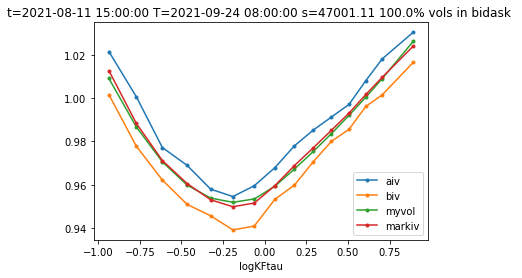

T=2021-09-24 08:00:00 t=2021-08-11 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03802767  0.05888884  0.10151136  0.0202866   0.15844986 -0.23144495]


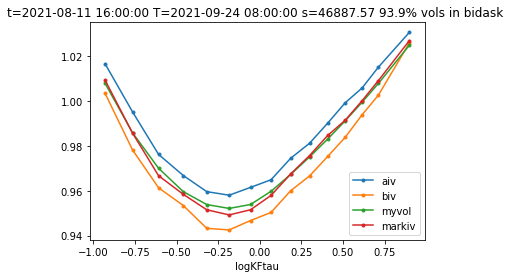

T=2021-09-24 08:00:00 t=2021-08-11 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03923823  0.06638559  0.10425029  0.01852891  0.15806156 -0.22263797]


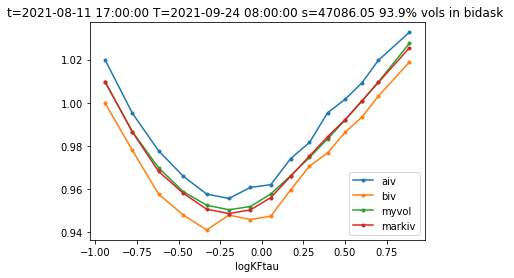

T=2021-09-24 08:00:00 t=2021-08-11 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03568937  0.06445192  0.09898593  0.01908695  0.15863031 -0.22373376]


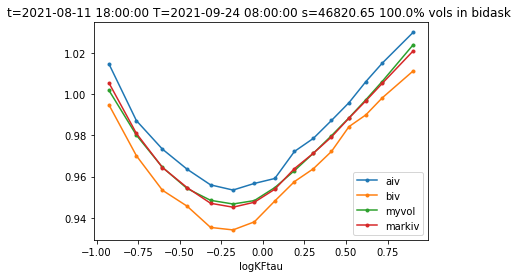

T=2021-09-24 08:00:00 t=2021-08-11 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03194838  0.0626782   0.09740983  0.01989625  0.15800892 -0.22579831]


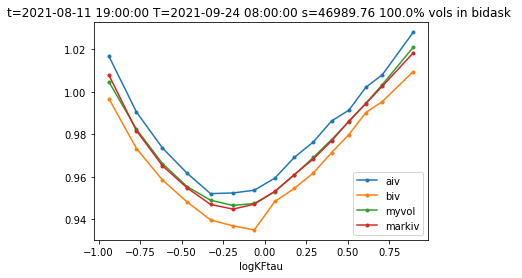

T=2021-09-24 08:00:00 t=2021-08-11 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03603297  0.0580726   0.09658055  0.02201487  0.15039874 -0.22689928]


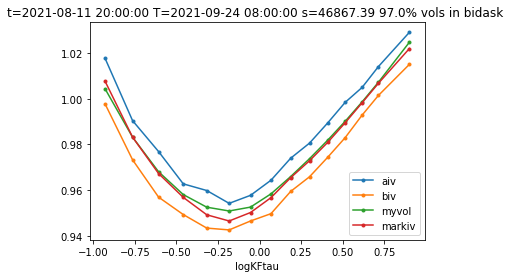

T=2021-09-24 08:00:00 t=2021-08-11 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03269899  0.06652911  0.09790619  0.01735567  0.15425552 -0.21490983]


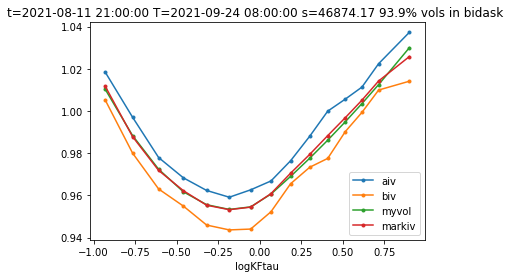

T=2021-09-24 08:00:00 t=2021-08-11 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03910462  0.06665371  0.10146467  0.01799598  0.15957345 -0.21986269]


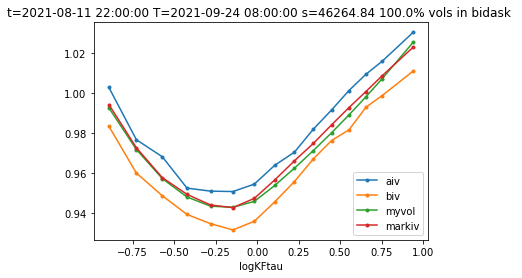

T=2021-09-24 08:00:00 t=2021-08-11 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03859669  0.06934808  0.1002719   0.01653741  0.16234228 -0.22746525]


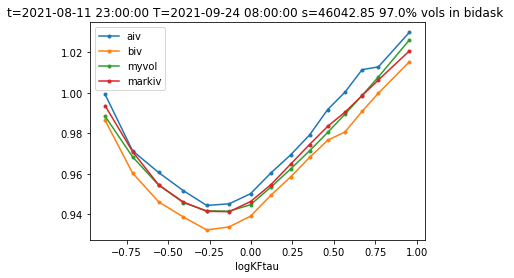

T=2021-09-24 08:00:00 t=2021-08-12 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03752248  0.06484561  0.10147082  0.01931706  0.16428137 -0.2286144 ]


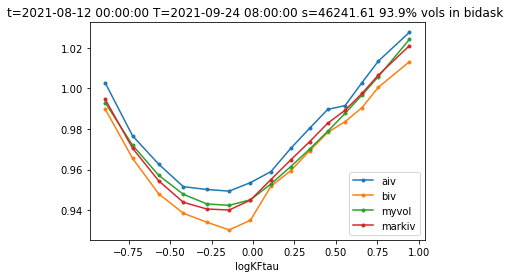

T=2021-09-24 08:00:00 t=2021-08-12 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03843288  0.06325216  0.10231265  0.0213795   0.16608544 -0.24294866]


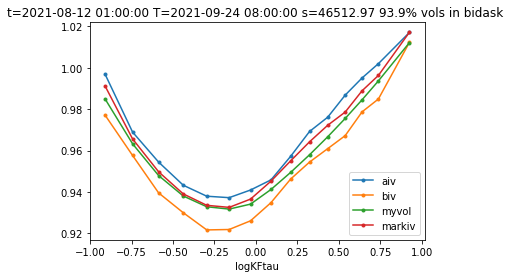

T=2021-09-24 08:00:00 t=2021-08-12 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03627157  0.06126229  0.10168904  0.02176941  0.16724375 -0.23761127]


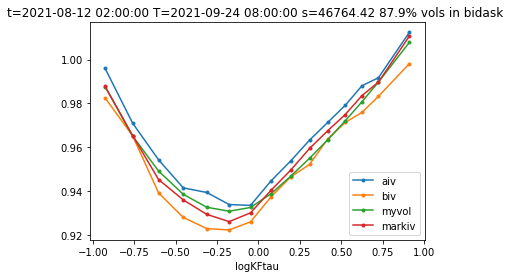

T=2021-09-24 08:00:00 t=2021-08-12 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.043271    0.06217949  0.10892025  0.02232052  0.16908207 -0.23559127]


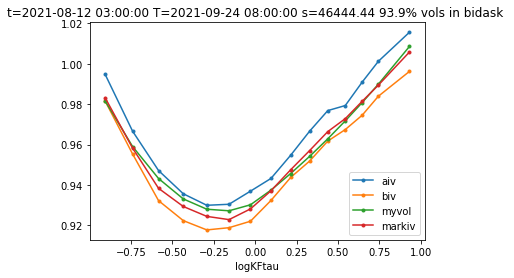

T=2021-09-24 08:00:00 t=2021-08-12 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02586906  0.07582454  0.10118554  0.01542906  0.17963294 -0.24748969]


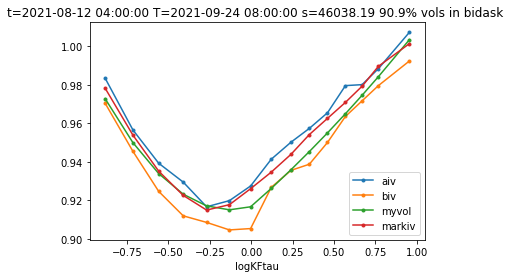

T=2021-09-24 08:00:00 t=2021-08-12 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02789421  0.07071898  0.10633993  0.01455211  0.17296778 -0.22697671]


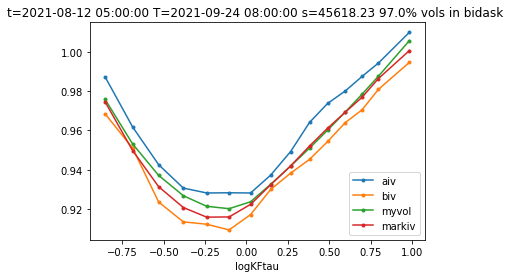

T=2021-09-24 08:00:00 t=2021-08-12 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02743862  0.06070095  0.10433039  0.01943611  0.16759597 -0.22351858]


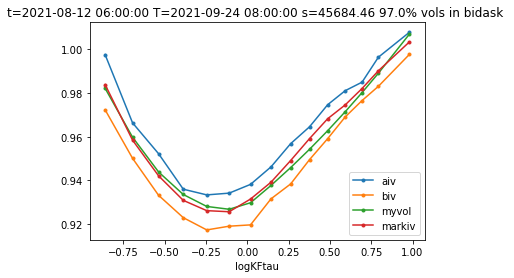

T=2021-09-24 08:00:00 t=2021-08-12 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04333112  0.05873526  0.11161989  0.01722176  0.16565585 -0.22088897]


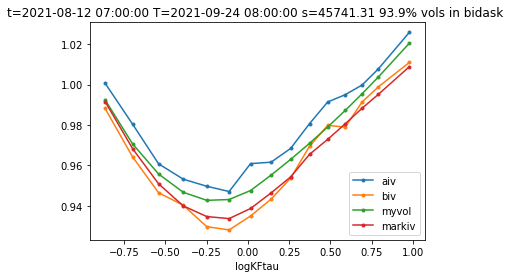

T=2021-09-24 08:00:00 t=2021-08-12 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02247566  0.05316022  0.09750966  0.01982788  0.16956461 -0.21983692]


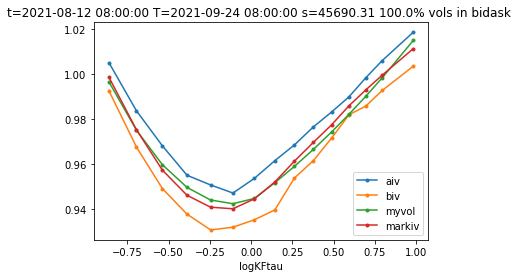

T=2021-09-24 08:00:00 t=2021-08-12 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02068141  0.05806773  0.10154319  0.01814035  0.16676765 -0.22528437]


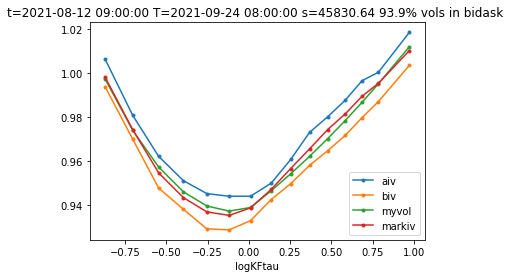

T=2021-09-24 08:00:00 t=2021-08-12 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02738752  0.06007692  0.10537942  0.01793552  0.16362849 -0.23014472]


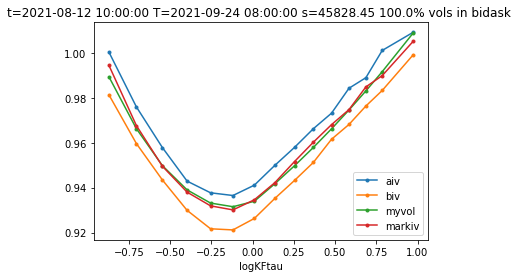

T=2021-09-24 08:00:00 t=2021-08-12 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02823433  0.06001952  0.10465184  0.01731724  0.17090778 -0.22807295]


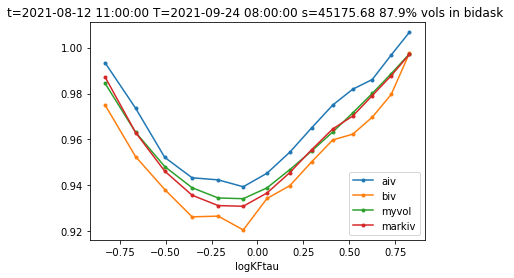

T=2021-09-24 08:00:00 t=2021-08-12 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02462206  0.05549559  0.10794894  0.01832741  0.17017787 -0.2308704 ]


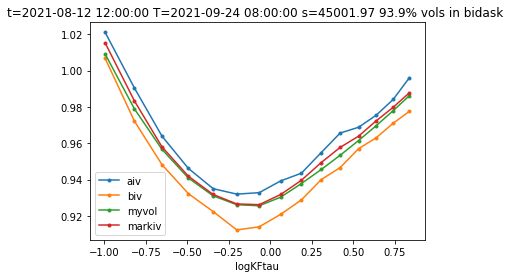

T=2021-09-24 08:00:00 t=2021-08-12 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02726653  0.05881234  0.11112445  0.01802456  0.16409452 -0.23758432]


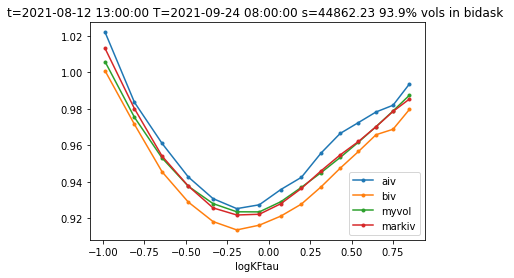

T=2021-09-24 08:00:00 t=2021-08-12 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02808646  0.05718448  0.11161753  0.01947255  0.1635766  -0.24460439]


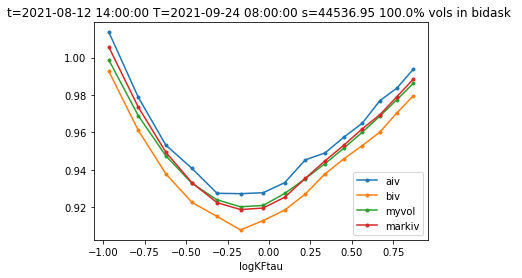

T=2021-09-24 08:00:00 t=2021-08-12 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02132738  0.06386861  0.11056279  0.01721187  0.16214526 -0.23336119]


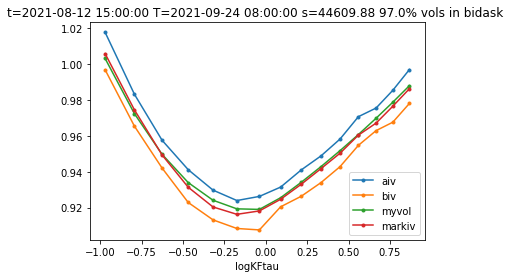

T=2021-09-24 08:00:00 t=2021-08-12 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0210317   0.06444114  0.10959138  0.01375504  0.1758841  -0.23347646]


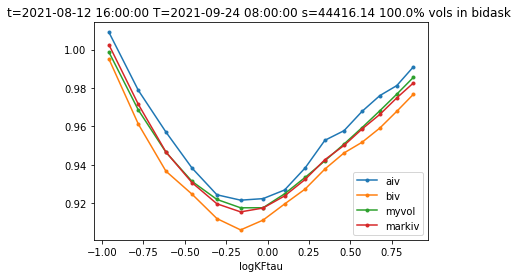

T=2021-09-24 08:00:00 t=2021-08-12 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03042399  0.06049483  0.11594608  0.01689803  0.17485325 -0.23561684]


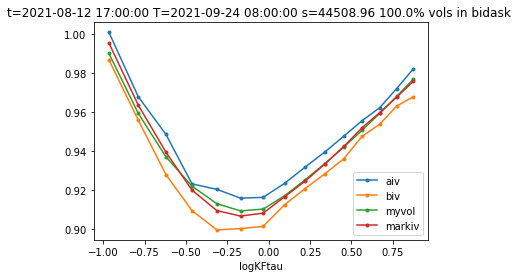

T=2021-09-24 08:00:00 t=2021-08-12 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02276179  0.06519355  0.11037138  0.01431543  0.17637079 -0.22345633]


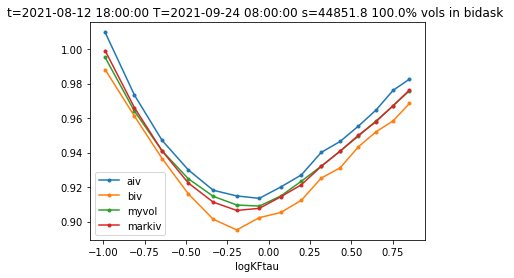

T=2021-09-24 08:00:00 t=2021-08-12 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02691391  0.06227161  0.11238337  0.01614779  0.17498329 -0.21757955]


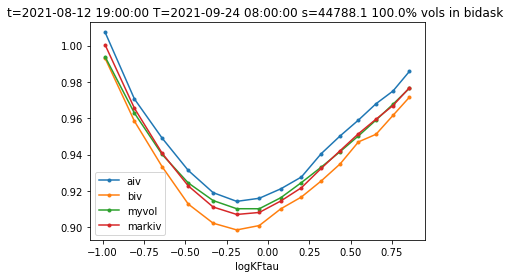

T=2021-09-24 08:00:00 t=2021-08-12 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02735198  0.06012028  0.11359567  0.01632706  0.1762096  -0.21658842]


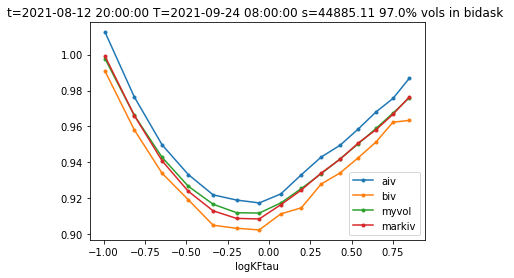

T=2021-09-24 08:00:00 t=2021-08-12 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01932892  0.05827982  0.1077469   0.01903044  0.17597592 -0.21927347]


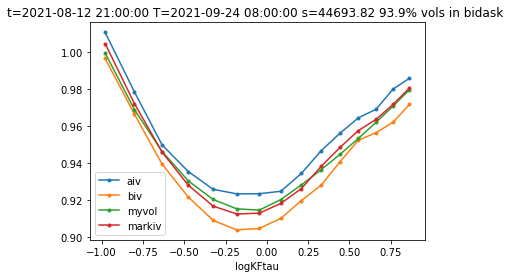

T=2021-09-24 08:00:00 t=2021-08-12 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0320833   0.05527138  0.11468188  0.02060387  0.1739373  -0.22095766]


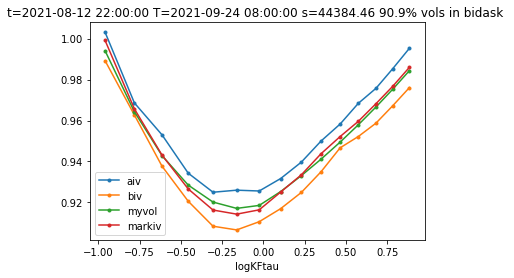

T=2021-09-24 08:00:00 t=2021-08-12 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03417696  0.05686713  0.11721812  0.02115236  0.17146809 -0.21901235]


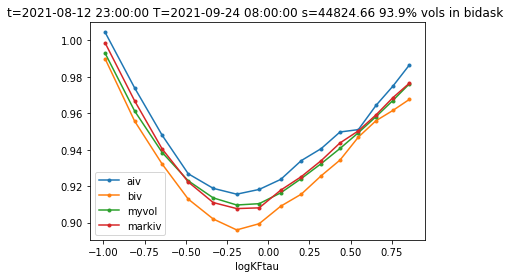

T=2021-09-24 08:00:00 t=2021-08-13 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03251884  0.05901956  0.12091474  0.02229681  0.16974708 -0.22132067]


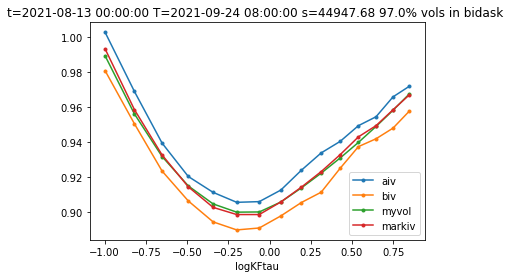

T=2021-09-24 08:00:00 t=2021-08-13 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0416331   0.06526242  0.12492233  0.01817117  0.18009684 -0.22811592]


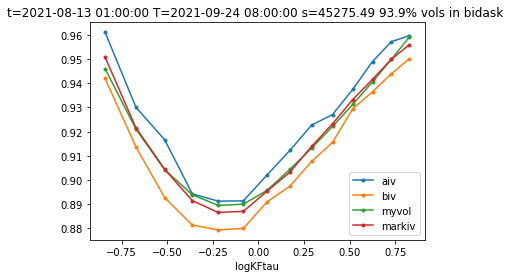

T=2021-09-24 08:00:00 t=2021-08-13 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05359468  0.06904779  0.13093936  0.01848892  0.17802215 -0.23967382]


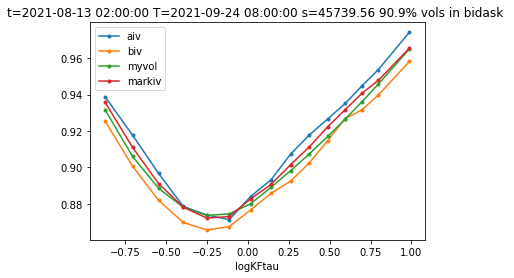

T=2021-09-24 08:00:00 t=2021-08-13 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04905822  0.07240991  0.12826632  0.01748206  0.17881503 -0.23692764]


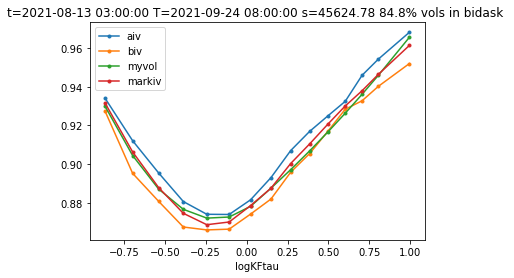

T=2021-09-24 08:00:00 t=2021-08-13 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04586861  0.07732308  0.12474287  0.01291434  0.18115509 -0.23796858]


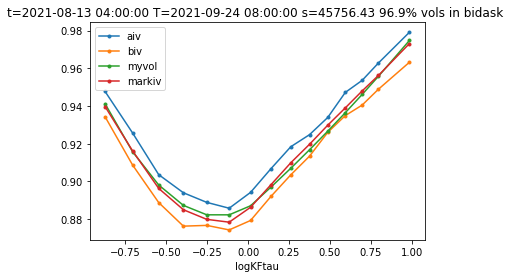

T=2021-09-24 08:00:00 t=2021-08-13 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04543386  0.06947503  0.12299773  0.01974158  0.17113261 -0.23735353]


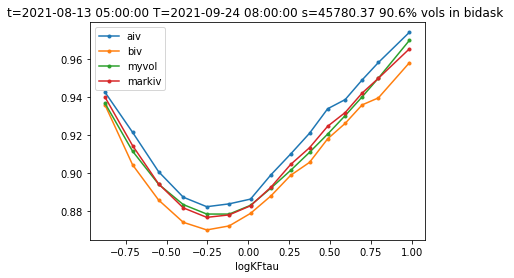

T=2021-09-24 08:00:00 t=2021-08-13 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04301914  0.06362275  0.12198243  0.02128816  0.17006275 -0.23856897]


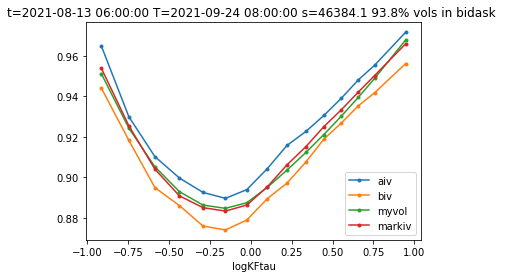

T=2021-09-24 08:00:00 t=2021-08-13 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0543809   0.05430374  0.12476322  0.02431855  0.17612461 -0.24127326]


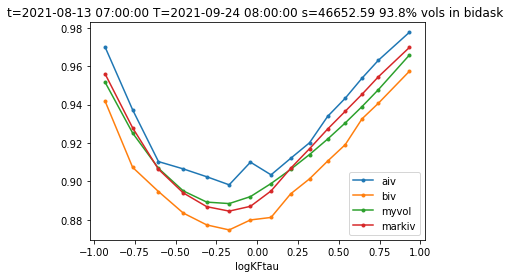

T=2021-09-24 08:00:00 t=2021-08-13 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05191902  0.0708038   0.12679928  0.01611203  0.17839649 -0.24029167]


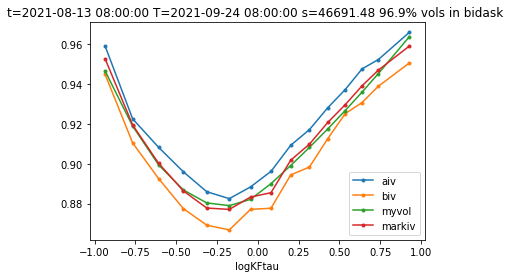

T=2021-09-24 08:00:00 t=2021-08-13 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04533243  0.07241446  0.12213048  0.01543595  0.1782105  -0.24140572]


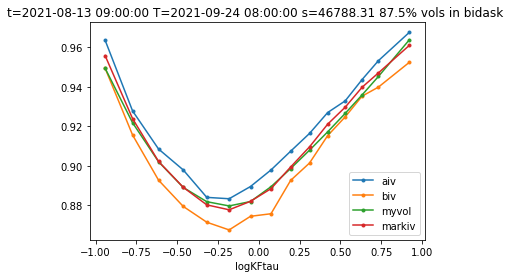

T=2021-09-24 08:00:00 t=2021-08-13 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04890932  0.06920183  0.12355413  0.01646973  0.17753833 -0.24140338]


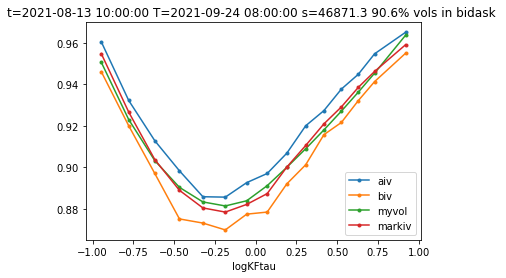

T=2021-09-24 08:00:00 t=2021-08-13 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0478799   0.06551932  0.12046119  0.01874601  0.1737278  -0.23951699]


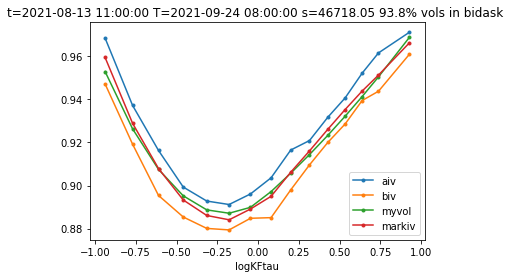

T=2021-09-24 08:00:00 t=2021-08-13 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04022087  0.06878007  0.11476104  0.01391103  0.18473532 -0.2469539 ]


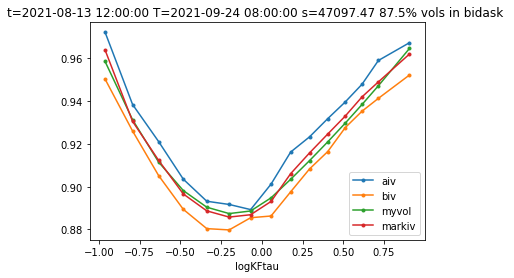

T=2021-09-24 08:00:00 t=2021-08-13 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04171766  0.0667393   0.113761    0.01507488  0.18301561 -0.24696333]


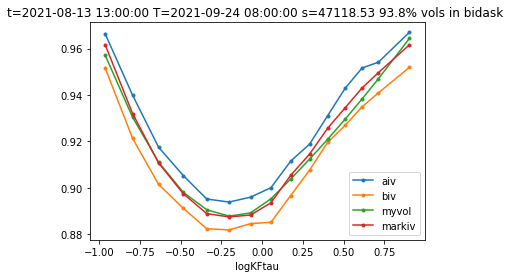

T=2021-09-24 08:00:00 t=2021-08-13 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05218218  0.07227513  0.11940808  0.01076116  0.18962321 -0.23541672]


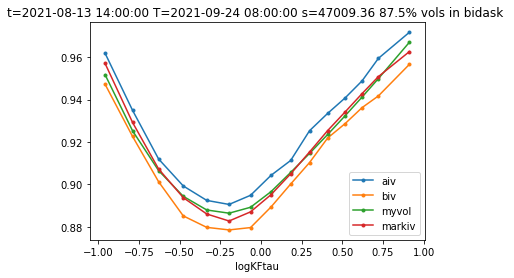

T=2021-09-24 08:00:00 t=2021-08-13 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04586871  0.06574613  0.11767733  0.01415587  0.18825066 -0.22315107]


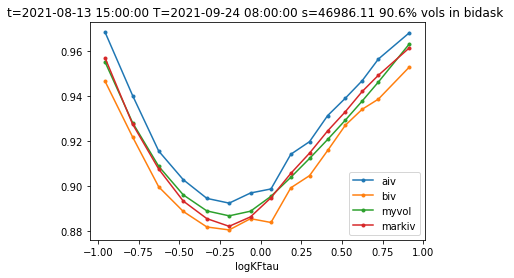

T=2021-09-24 08:00:00 t=2021-08-13 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05341019  0.06556399  0.12072957  0.01826137  0.1739292  -0.21967927]


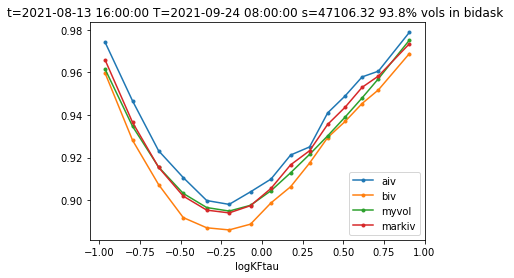

T=2021-09-24 08:00:00 t=2021-08-13 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05992708  0.07597722  0.12261994  0.01394815  0.17611177 -0.22748176]


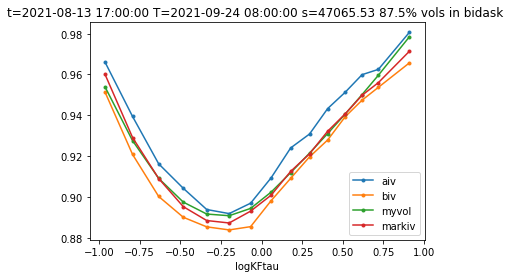

T=2021-09-24 08:00:00 t=2021-08-13 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0608606   0.07626527  0.12427609  0.01213388  0.18536583 -0.22676866]


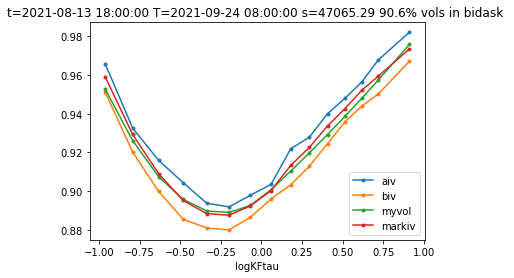

T=2021-09-24 08:00:00 t=2021-08-13 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.06114227  0.08084048  0.12687545  0.00949765  0.17949349 -0.22319162]


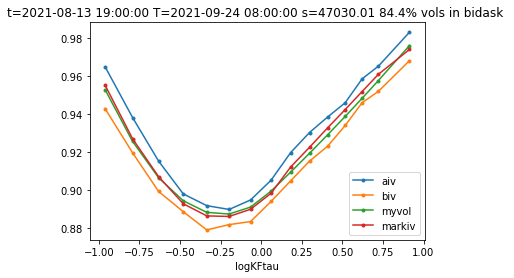

T=2021-09-24 08:00:00 t=2021-08-13 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.06050706  0.07585043  0.1210611   0.01206452  0.17215887 -0.21258518]


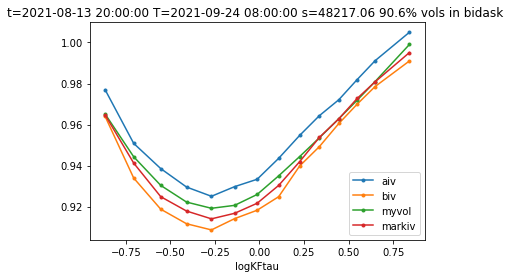

T=2021-09-24 08:00:00 t=2021-08-13 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05976602  0.07252666  0.11394787  0.01267281  0.18174272 -0.21517127]


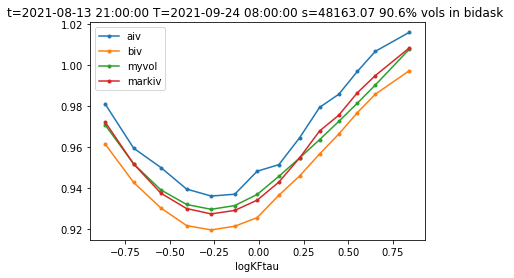

T=2021-09-24 08:00:00 t=2021-08-13 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05739938  0.07271073  0.11439633  0.01064078  0.18308588 -0.21985452]


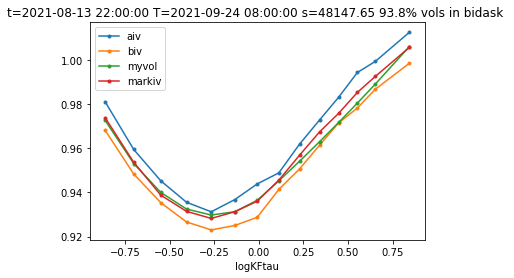

T=2021-09-24 08:00:00 t=2021-08-13 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05598671  0.07470485  0.11425265  0.00917862  0.18294151 -0.22494333]


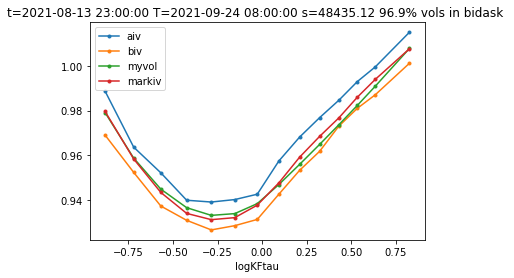

T=2021-09-24 08:00:00 t=2021-08-14 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05500759  0.09054964  0.11798462  0.00395119  0.18679606 -0.21803574]


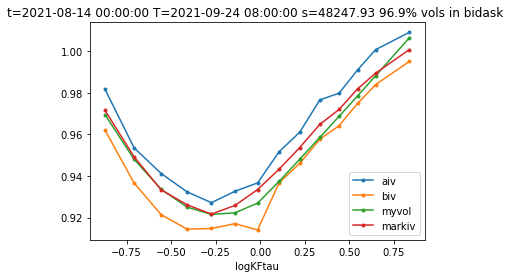

T=2021-09-24 08:00:00 t=2021-08-14 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.06295951  0.08564654  0.1235784   0.00430806  0.17790074 -0.2389619 ]


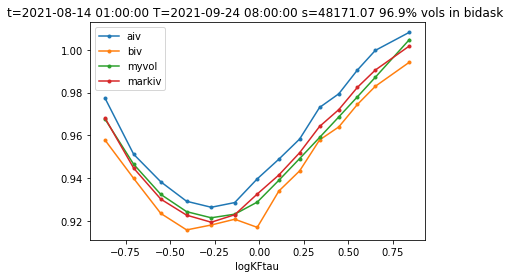

T=2021-09-24 08:00:00 t=2021-08-14 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04818007  0.08433862  0.11329181  0.00666012  0.18534631 -0.25945968]


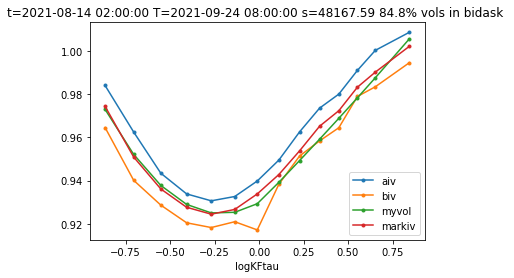

T=2021-09-24 08:00:00 t=2021-08-14 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05246683  0.08000584  0.11742978  0.01006504  0.18252849 -0.2449845 ]


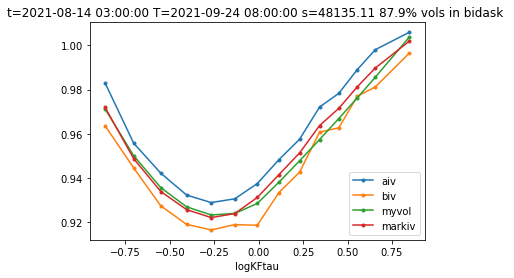

T=2021-09-24 08:00:00 t=2021-08-14 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05196219  0.07912966  0.11816316  0.0105829   0.17938324 -0.22895078]


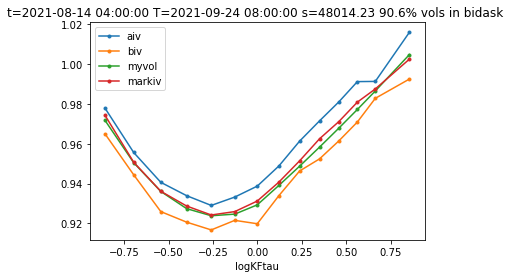

T=2021-09-24 08:00:00 t=2021-08-14 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04089     0.07632872  0.11164358  0.01087025  0.18499458 -0.23169144]


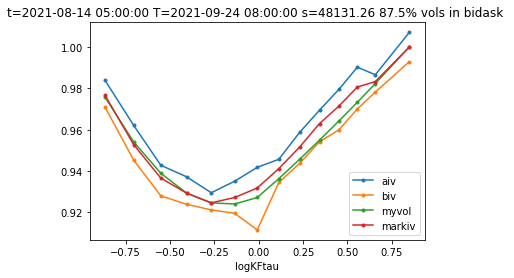

T=2021-09-24 08:00:00 t=2021-08-14 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03964883  0.08316696  0.11249346  0.00798544  0.18829347 -0.23854261]


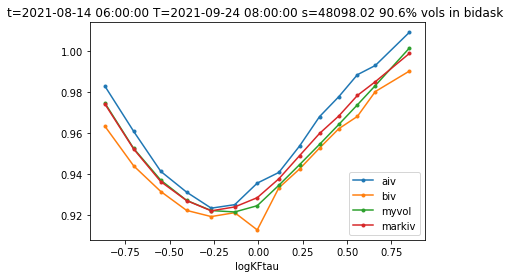

T=2021-09-24 08:00:00 t=2021-08-14 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04467649  0.07596399  0.11419574  0.01182906  0.17265322 -0.23635547]


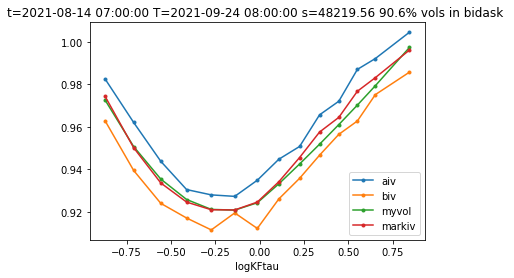

T=2021-09-24 08:00:00 t=2021-08-14 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05442545  0.07362753  0.12445394  0.01225373  0.18415043 -0.23865458]


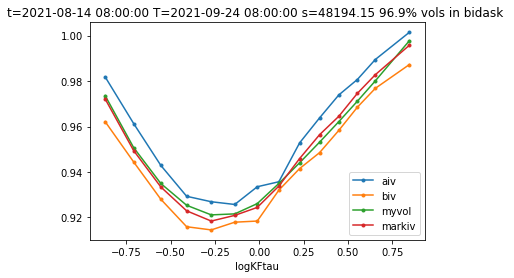

T=2021-09-24 08:00:00 t=2021-08-14 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05936322  0.06867503  0.12488357  0.01593808  0.18018936 -0.2248842 ]


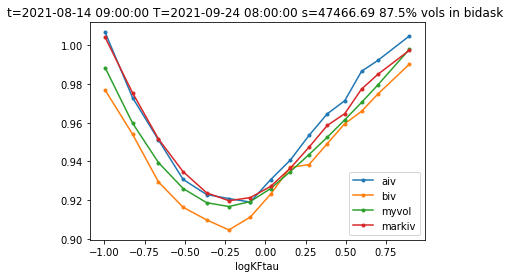

T=2021-09-24 08:00:00 t=2021-08-14 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05095089  0.06508885  0.11806259  0.01505951  0.17438389 -0.22976423]


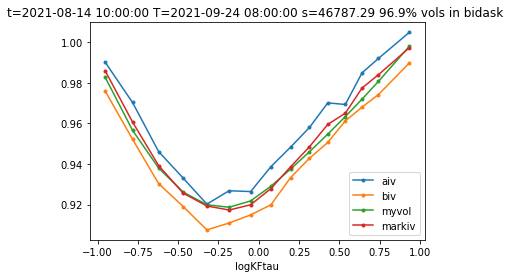

T=2021-09-24 08:00:00 t=2021-08-14 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05092075  0.06117273  0.11848496  0.0177437   0.17656353 -0.23016068]


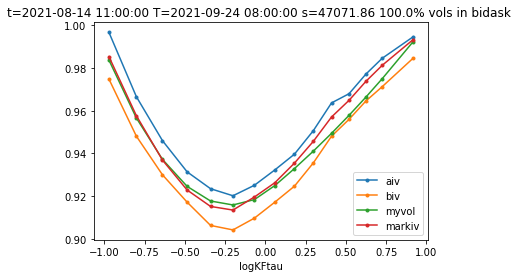

T=2021-09-24 08:00:00 t=2021-08-14 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05493817  0.06898773  0.11984639  0.01506136  0.17212563 -0.23224378]


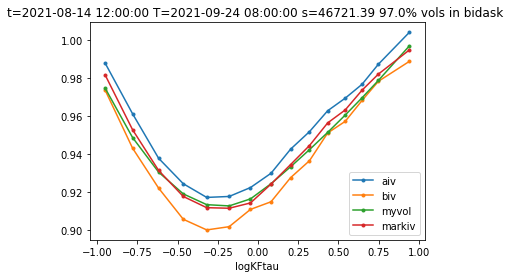

T=2021-09-24 08:00:00 t=2021-08-14 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04727821  0.0609546   0.11470237  0.01803125  0.17245846 -0.22307362]


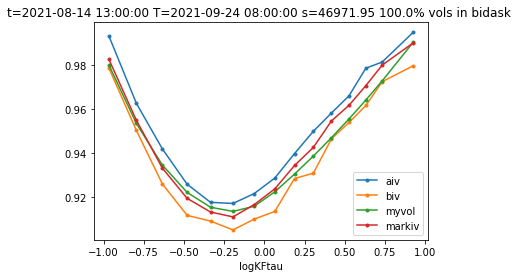

T=2021-09-24 08:00:00 t=2021-08-14 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05098733  0.06332293  0.12140616  0.01723892  0.18103359 -0.22351588]


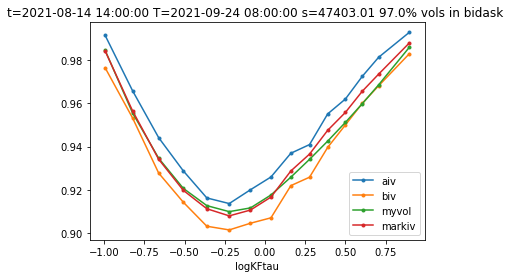

T=2021-09-24 08:00:00 t=2021-08-14 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.06122208  0.05580168  0.12615126  0.02069846  0.17989416 -0.2257836 ]


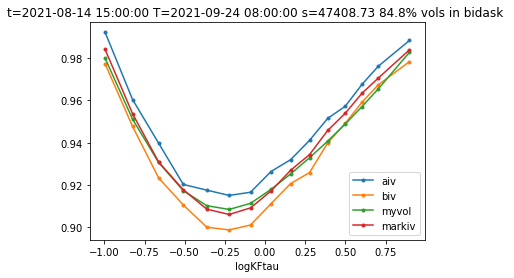

T=2021-09-24 08:00:00 t=2021-08-14 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0549911   0.05691988  0.12212301  0.02080672  0.17613859 -0.23091826]


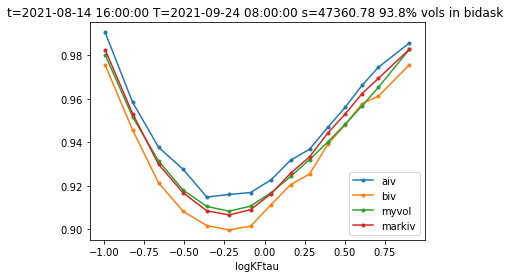

T=2021-09-24 08:00:00 t=2021-08-14 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05831036  0.05995621  0.12559588  0.01876988  0.17940494 -0.22864832]


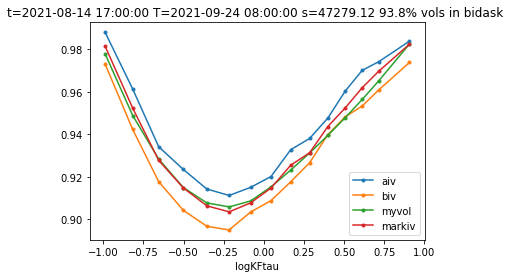

T=2021-09-24 08:00:00 t=2021-08-14 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05239936  0.06142675  0.12083939  0.0184288   0.17271143 -0.22972957]


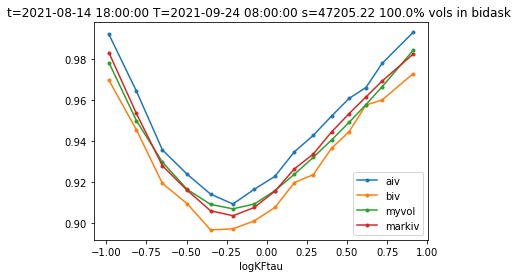

T=2021-09-24 08:00:00 t=2021-08-14 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05288441  0.06604471  0.12395757  0.01644915  0.18259888 -0.22381417]


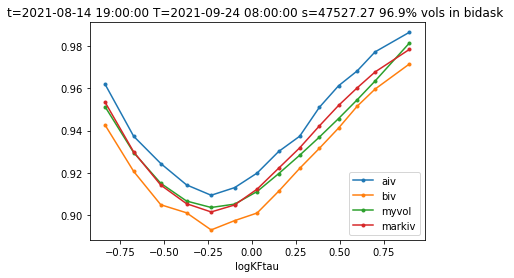

T=2021-09-24 08:00:00 t=2021-08-14 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04599866  0.05921287  0.12219903  0.02017969  0.17400372 -0.21252635]


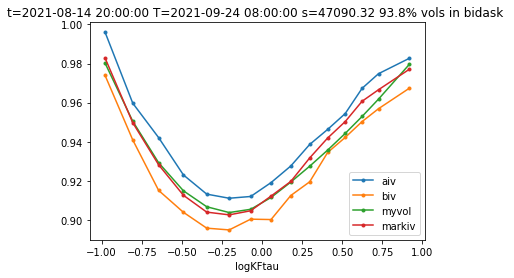

T=2021-09-24 08:00:00 t=2021-08-14 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05767875  0.06049201  0.12863822  0.0193183   0.17437751 -0.22051333]


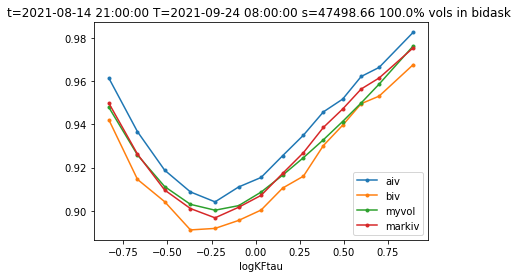

T=2021-09-24 08:00:00 t=2021-08-14 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05352047  0.06254056  0.12387419  0.01864779  0.18049322 -0.22429123]


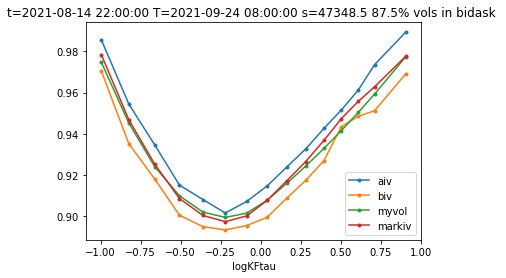

T=2021-09-24 08:00:00 t=2021-08-14 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05642217  0.0602726   0.1284669   0.01916065  0.17992747 -0.21636476]


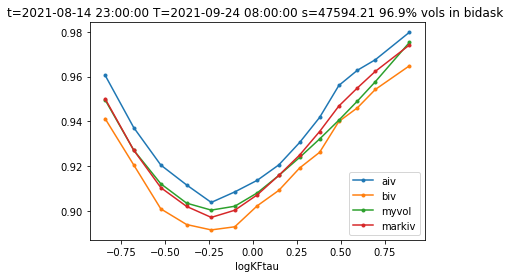

T=2021-09-24 08:00:00 t=2021-08-15 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04749794  0.061199    0.12172242  0.01923397  0.18515303 -0.22703565]


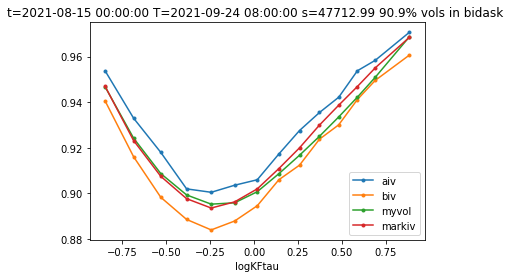

T=2021-09-24 08:00:00 t=2021-08-15 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05038521  0.05679978  0.1194536   0.02251638  0.18158266 -0.22917702]


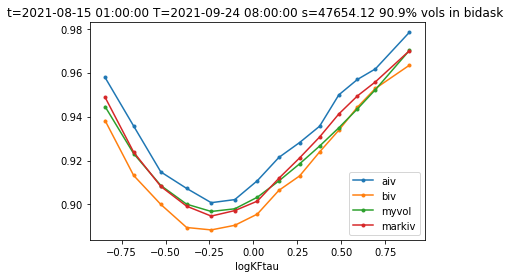

T=2021-09-24 08:00:00 t=2021-08-15 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04993875  0.05694102  0.11985924  0.02196486  0.18293219 -0.22854919]


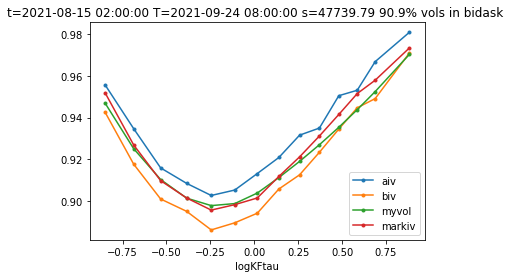

T=2021-09-24 08:00:00 t=2021-08-15 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05473818  0.06110025  0.12495644  0.02071082  0.18806329 -0.22765806]


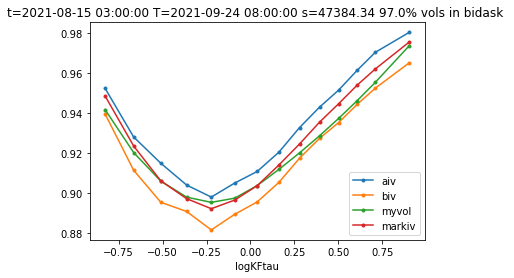

T=2021-09-24 08:00:00 t=2021-08-15 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04583412  0.06631679  0.12059983  0.01722596  0.20476119 -0.22267174]


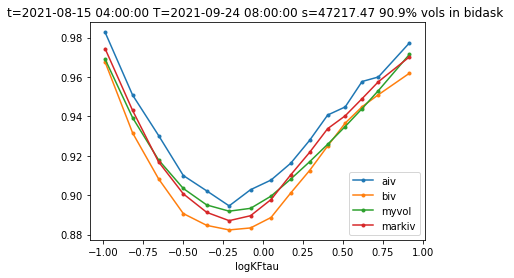

T=2021-09-24 08:00:00 t=2021-08-15 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04641432  0.06771128  0.12196834  0.01726113  0.20435455 -0.2292361 ]


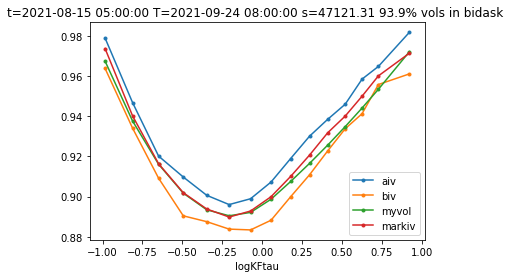

T=2021-09-24 08:00:00 t=2021-08-15 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04277048  0.066811    0.11948864  0.01885824  0.20080038 -0.22801192]


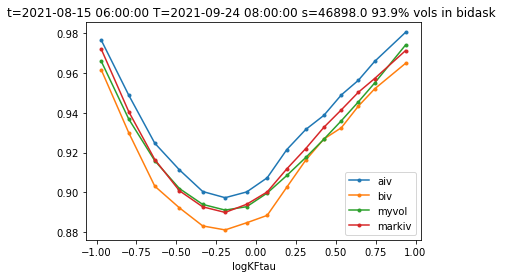

T=2021-09-24 08:00:00 t=2021-08-15 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04649097  0.05167771  0.11784317  0.02667091  0.18141437 -0.22987115]


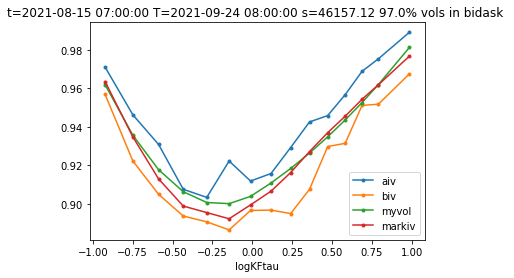

T=2021-09-24 08:00:00 t=2021-08-15 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05075043  0.06073669  0.12078832  0.02236552  0.18410493 -0.22691226]


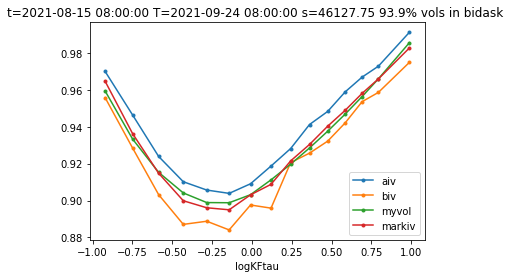

T=2021-09-24 08:00:00 t=2021-08-15 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.05111144  0.06376938  0.12309846  0.02118569  0.19187523 -0.21609972]


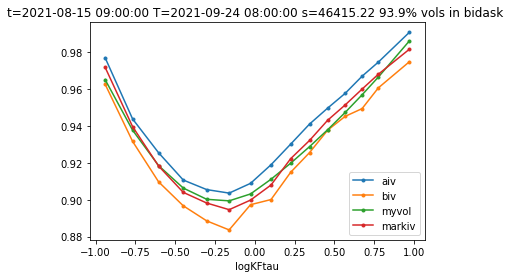

T=2021-09-24 08:00:00 t=2021-08-15 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02969867  0.05287229  0.10888293  0.02419875  0.17451382 -0.22816256]


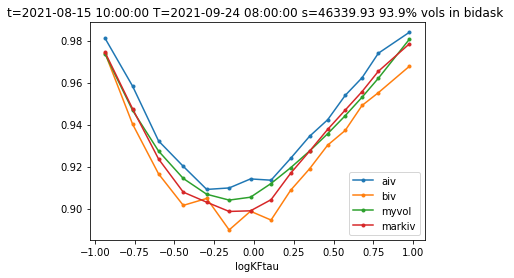

T=2021-09-24 08:00:00 t=2021-08-15 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03443389  0.06067649  0.11592886  0.02048774  0.1779354  -0.2137561 ]


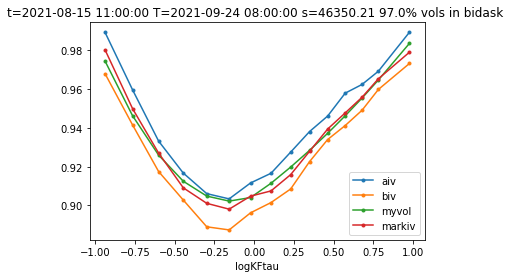

T=2021-09-24 08:00:00 t=2021-08-15 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03310746  0.06871643  0.11601078  0.01818255  0.18014335 -0.21586652]


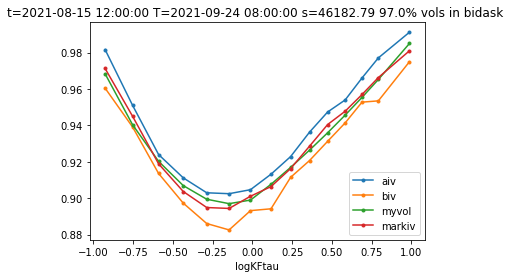

T=2021-09-24 08:00:00 t=2021-08-15 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02767548  0.06255667  0.11134754  0.02020903  0.17761174 -0.2131962 ]


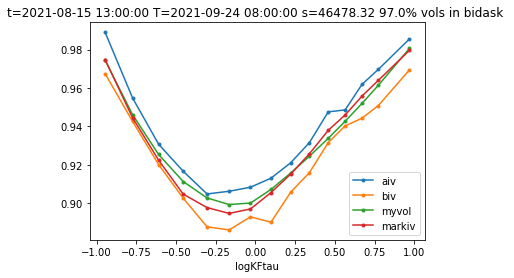

T=2021-09-24 08:00:00 t=2021-08-15 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03766541  0.05478474  0.12009135  0.02362595  0.1747393  -0.22592118]


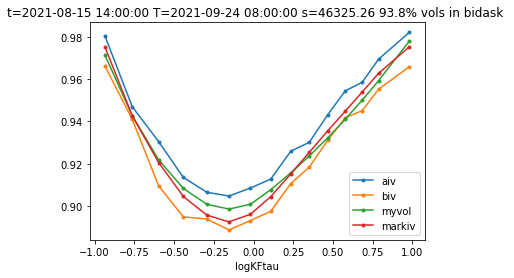

T=2021-09-24 08:00:00 t=2021-08-15 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02832882  0.05607183  0.11648269  0.02351629  0.17327888 -0.23442633]


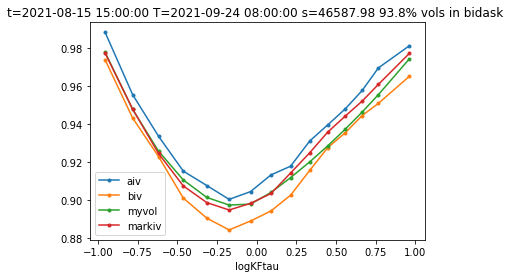

T=2021-09-24 08:00:00 t=2021-08-15 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02418456  0.05972416  0.11223099  0.021964    0.17863329 -0.23410969]


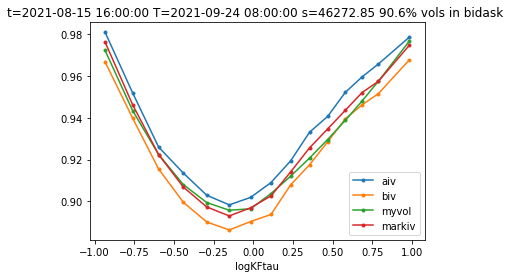

T=2021-09-24 08:00:00 t=2021-08-15 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02426772  0.05813073  0.11241622  0.02121152  0.1909071  -0.23592121]


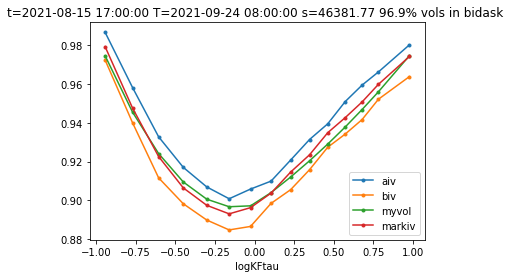

T=2021-09-24 08:00:00 t=2021-08-15 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03125402  0.05745058  0.11602128  0.02178173  0.17999709 -0.23560151]


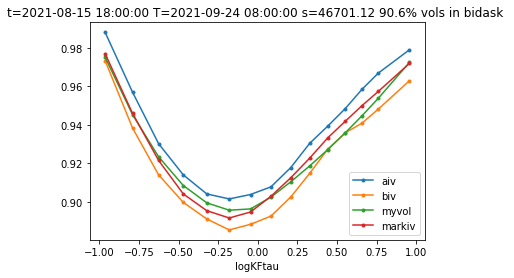

T=2021-09-24 08:00:00 t=2021-08-15 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03623995  0.05175661  0.11875179  0.02352905  0.18105187 -0.22982726]


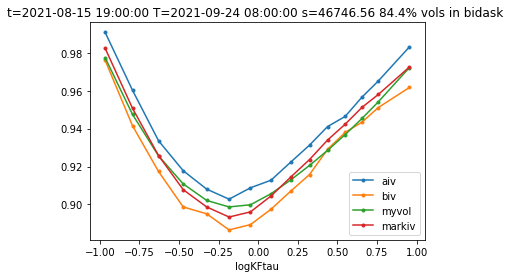

T=2021-09-24 08:00:00 t=2021-08-15 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03802713  0.05601039  0.12168729  0.02013574  0.183859   -0.23150677]


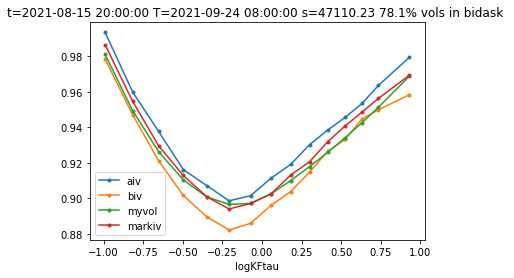

T=2021-09-24 08:00:00 t=2021-08-15 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04387734  0.05758751  0.12353516  0.01965968  0.18241343 -0.23147443]


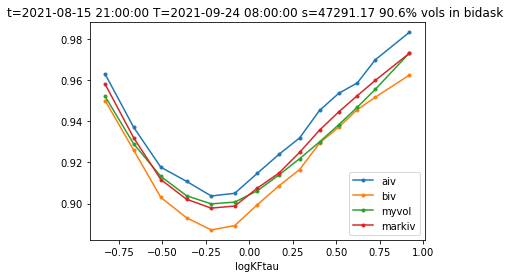

T=2021-09-24 08:00:00 t=2021-08-15 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04087361  0.06348653  0.12040684  0.01715481  0.18322734 -0.23741779]


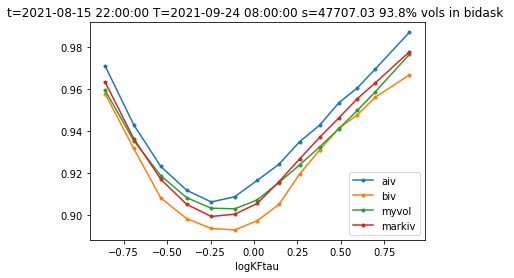

T=2021-09-24 08:00:00 t=2021-08-15 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04517312  0.05881573  0.12396419  0.0177295   0.18828957 -0.23217612]


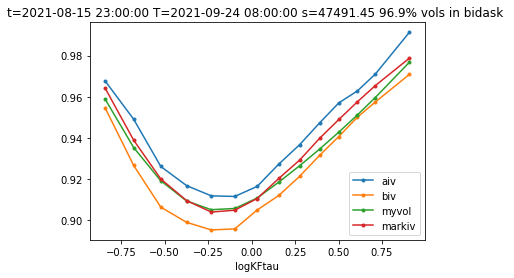

T=2021-09-24 08:00:00 t=2021-08-16 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03369095  0.0658244   0.11812293  0.01588365  0.18157096 -0.23662876]


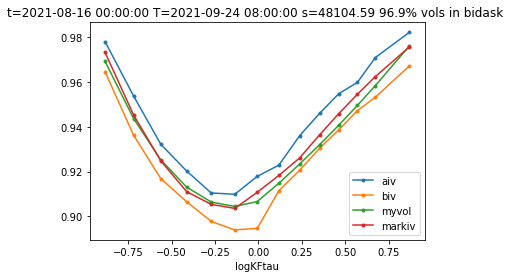

T=2021-09-24 08:00:00 t=2021-08-16 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0395388   0.06734715  0.12209713  0.01644478  0.18725346 -0.23861087]


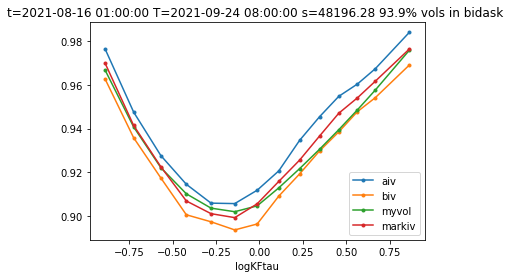

T=2021-09-24 08:00:00 t=2021-08-16 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03367487  0.06036184  0.12023951  0.01954997  0.18917645 -0.22791641]


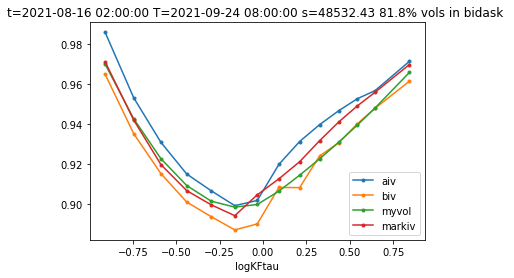

T=2021-09-24 08:00:00 t=2021-08-16 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04851074  0.06255363  0.12688408  0.01846496  0.1934899  -0.21974412]


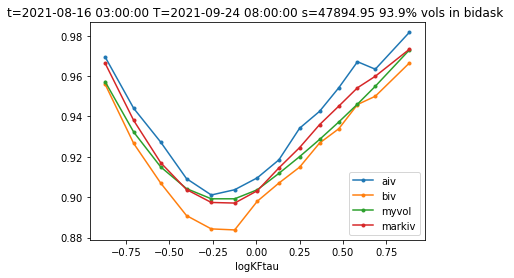

T=2021-09-24 08:00:00 t=2021-08-16 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03632977  0.06276846  0.11727714  0.01900896  0.18769956 -0.22807534]


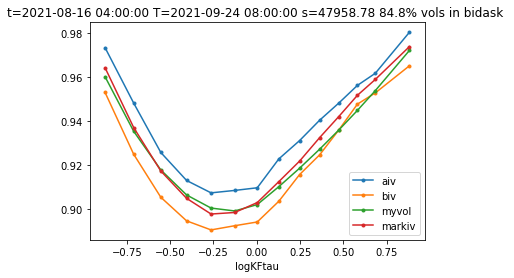

T=2021-09-24 08:00:00 t=2021-08-16 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04482383  0.06461844  0.12628953  0.01835141  0.17914148 -0.2214255 ]


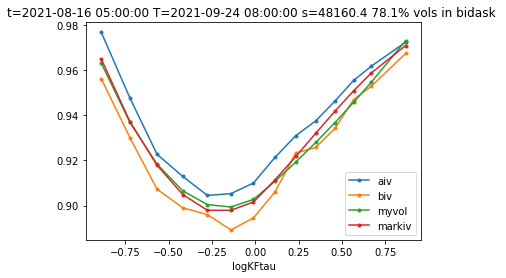

T=2021-09-24 08:00:00 t=2021-08-16 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03583311  0.05894508  0.1181484   0.02051618  0.18519745 -0.22018623]


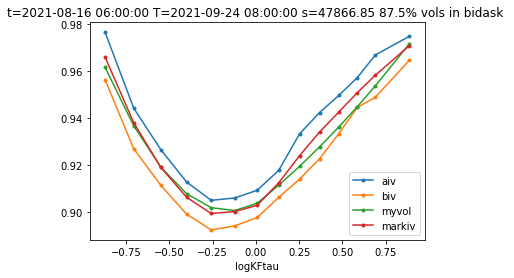

T=2021-09-24 08:00:00 t=2021-08-16 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04175268  0.0606609   0.12535631  0.01850557  0.18363552 -0.21090399]


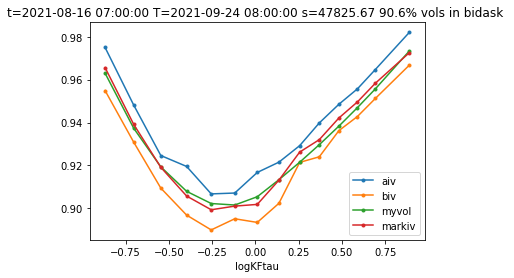

T=2021-09-24 08:00:00 t=2021-08-16 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04019502  0.06491109  0.12023893  0.01640066  0.18563281 -0.22134491]


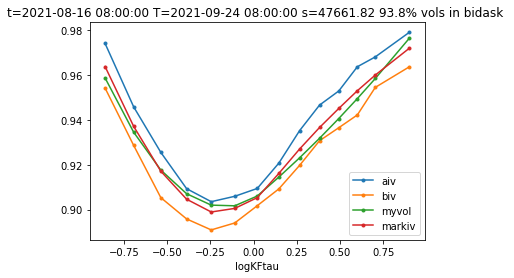

T=2021-09-24 08:00:00 t=2021-08-16 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03832833  0.05812093  0.11950774  0.01989187  0.1863384  -0.22404483]


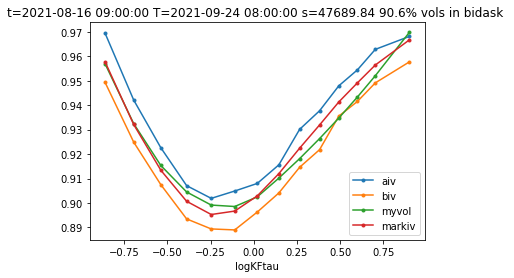

T=2021-09-24 08:00:00 t=2021-08-16 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.04716457  0.05926238  0.12484265  0.01873336  0.18604867 -0.2253921 ]


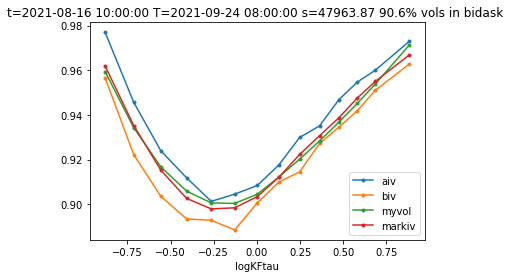

T=2021-09-24 08:00:00 t=2021-08-16 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02850648  0.0594025   0.11144754  0.016717    0.19370372 -0.22920283]


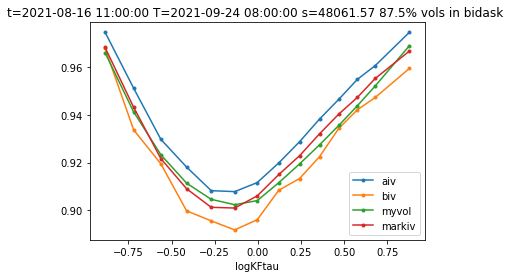

T=2021-09-24 08:00:00 t=2021-08-16 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02831238  0.04384565  0.11363627  0.02398888  0.18517098 -0.22152591]


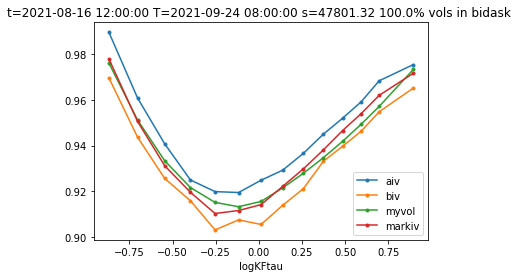

T=2021-09-24 08:00:00 t=2021-08-16 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03068068  0.05815621  0.11309561  0.01132767  0.2059637  -0.22604365]


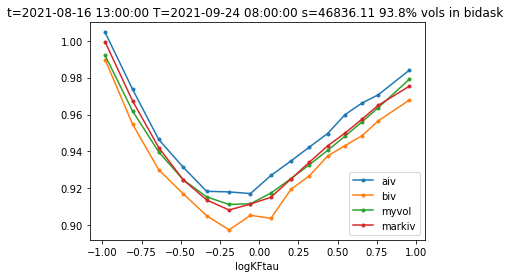

T=2021-09-24 08:00:00 t=2021-08-16 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02026631  0.05865025  0.10661089  0.01233935  0.20568269 -0.22924297]


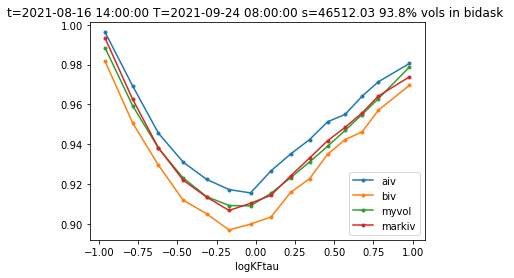

T=2021-09-24 08:00:00 t=2021-08-16 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01976019  0.04699217  0.10584556  0.01773518  0.20212372 -0.22345409]


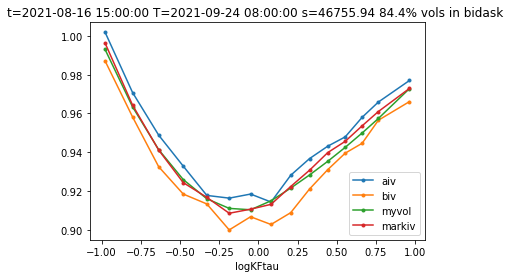

T=2021-09-24 08:00:00 t=2021-08-16 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02667274  0.05459804  0.10834603  0.01630449  0.20032927 -0.22962055]


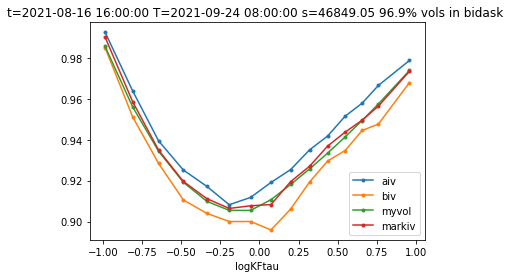

T=2021-09-24 08:00:00 t=2021-08-16 17:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02686691  0.05454248  0.10658669  0.01499614  0.20265237 -0.22781974]


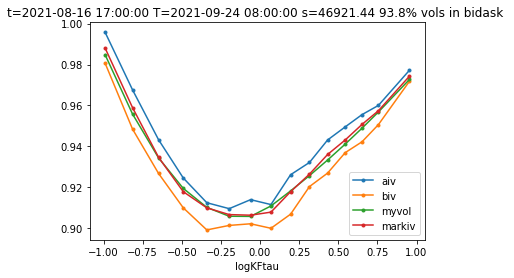

T=2021-09-24 08:00:00 t=2021-08-16 18:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02503613  0.0503991   0.10478396  0.01837431  0.19790411 -0.22244951]


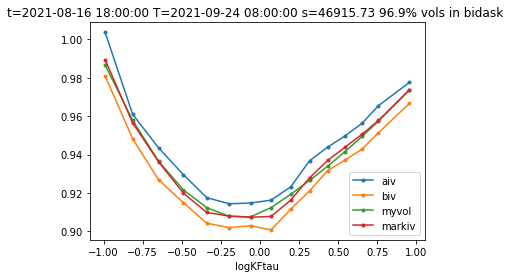

T=2021-09-24 08:00:00 t=2021-08-16 19:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02407446  0.04736503  0.104717    0.02014384  0.19918258 -0.22319118]


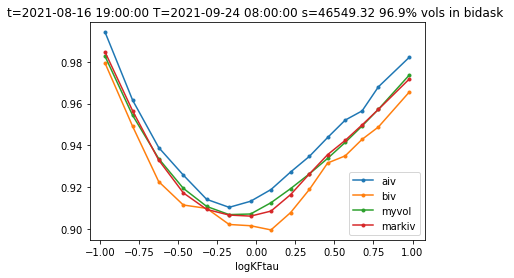

T=2021-09-24 08:00:00 t=2021-08-16 20:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03319593  0.05412383  0.11279065  0.01721997  0.20065519 -0.22045375]


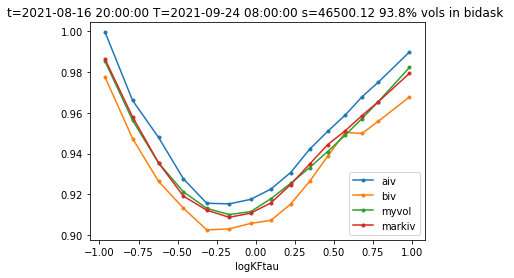

T=2021-09-24 08:00:00 t=2021-08-16 21:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03504341  0.05045646  0.11055517  0.01932022  0.1982992  -0.2259746 ]


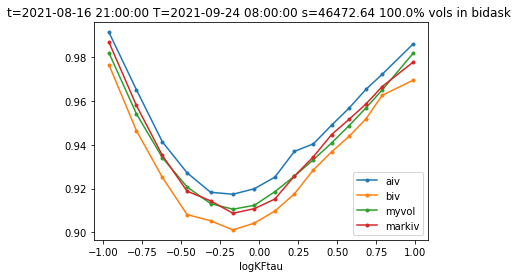

T=2021-09-24 08:00:00 t=2021-08-16 22:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03174759  0.04922048  0.11046517  0.02009642  0.19885809 -0.21937843]


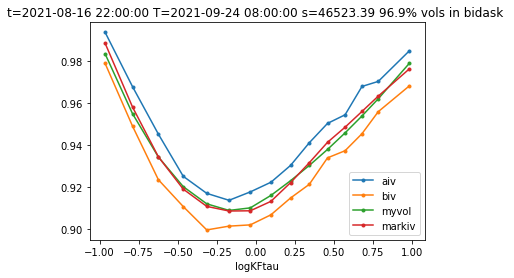

T=2021-09-24 08:00:00 t=2021-08-16 23:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02707857  0.05101231  0.10656278  0.01950457  0.20083683 -0.21987099]


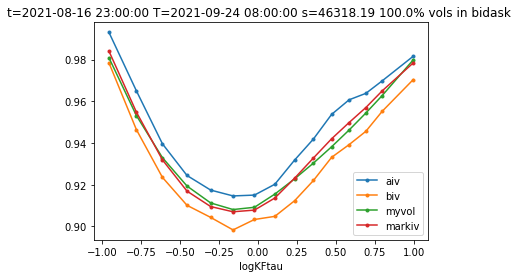

T=2021-09-24 08:00:00 t=2021-08-17 00:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03239474  0.05604217  0.11040683  0.01735192  0.1988451  -0.21784614]


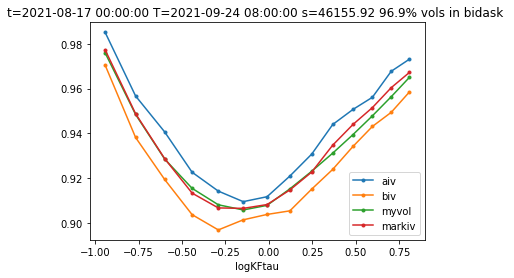

T=2021-09-24 08:00:00 t=2021-08-17 01:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02828421  0.05338935  0.10514596  0.01827928  0.19597628 -0.22142472]


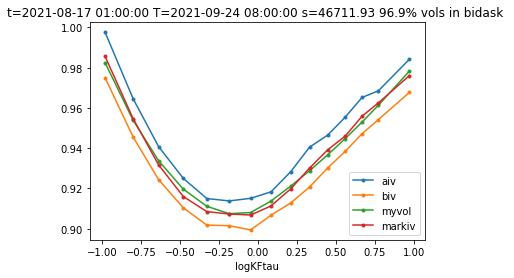

T=2021-09-24 08:00:00 t=2021-08-17 02:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02035514  0.04855162  0.09758335  0.02103813  0.19514564 -0.22514537]


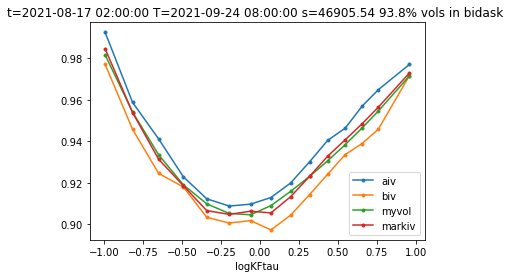

T=2021-09-24 08:00:00 t=2021-08-17 03:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.0241891   0.05389489  0.10648479  0.01901167  0.20047377 -0.21492434]


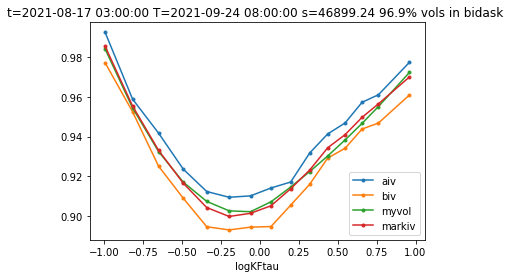

T=2021-09-24 08:00:00 t=2021-08-17 04:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02472082  0.05598008  0.10547938  0.01701047  0.19982049 -0.21624093]


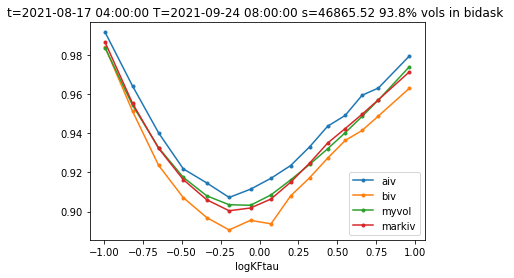

T=2021-09-24 08:00:00 t=2021-08-17 05:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02292199  0.0570966   0.10302594  0.01921432  0.19877434 -0.21628666]


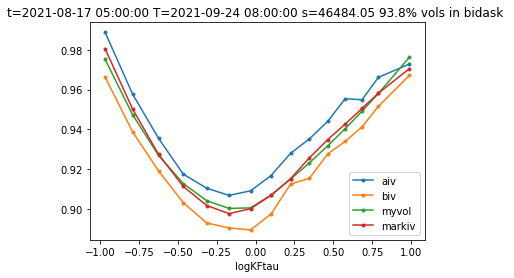

T=2021-09-24 08:00:00 t=2021-08-17 06:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03111829  0.05127347  0.10840414  0.02314196  0.19391416 -0.21165206]


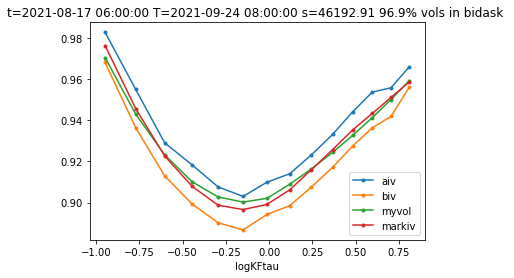

T=2021-09-24 08:00:00 t=2021-08-17 07:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03744146  0.05267915  0.11665088  0.02202113  0.20379497 -0.20457859]


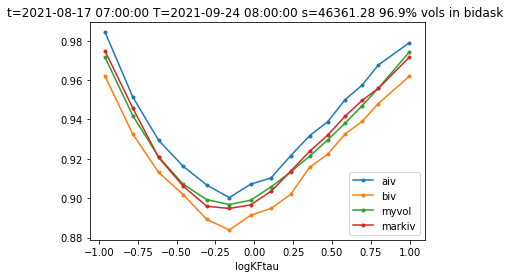

T=2021-09-24 08:00:00 t=2021-08-17 08:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03037762  0.05632872  0.10965286  0.0213243   0.19591838 -0.23471874]


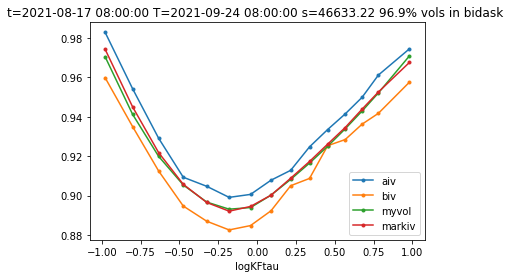

T=2021-09-24 08:00:00 t=2021-08-17 09:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03182906  0.05755593  0.11303904  0.01863177  0.19893866 -0.22767545]


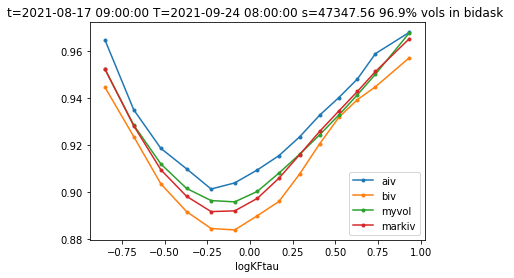

T=2021-09-24 08:00:00 t=2021-08-17 10:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03663136  0.05933182  0.11478892  0.01893424  0.19971126 -0.23328209]


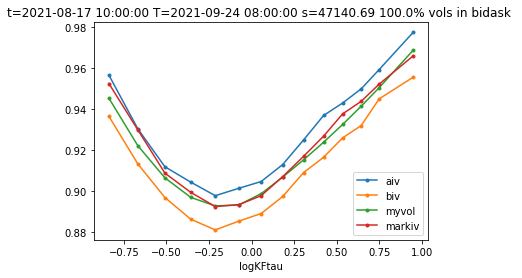

T=2021-09-24 08:00:00 t=2021-08-17 11:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02012889  0.05767133  0.10441516  0.01903226  0.19547131 -0.23460952]


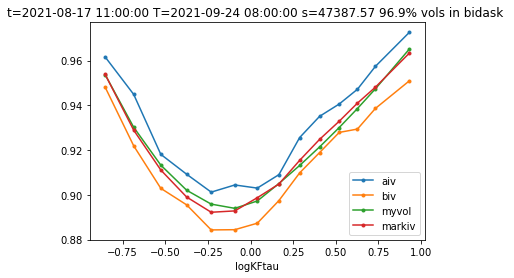

T=2021-09-24 08:00:00 t=2021-08-17 12:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.01922618  0.05766021  0.1044387   0.01881043  0.19621671 -0.23948909]


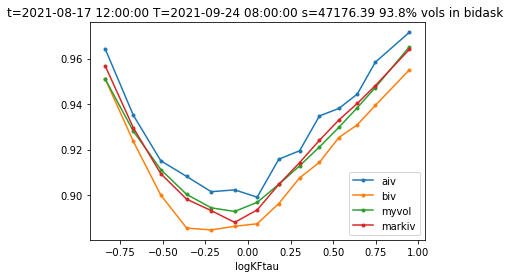

T=2021-09-24 08:00:00 t=2021-08-17 13:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02869936  0.05529703  0.11069818  0.01966439  0.19755441 -0.23316332]


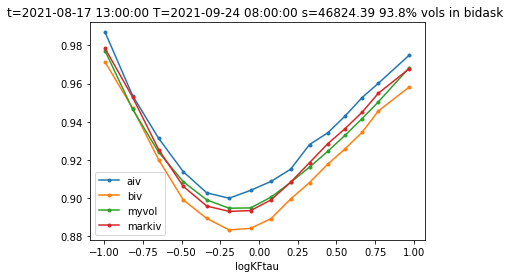

T=2021-09-24 08:00:00 t=2021-08-17 14:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.03262462  0.05469657  0.11365862  0.0197474   0.206908   -0.24155499]


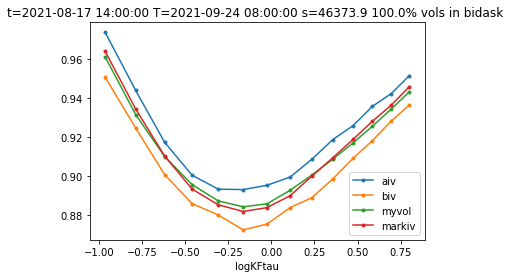

T=2021-09-24 08:00:00 t=2021-08-17 15:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6
optimized params:[ 0.02043094  0.06014187  0.10642093  0.01814273  0.20796306 -0.23934288]


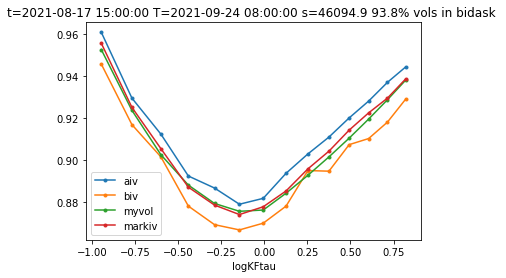

T=2021-09-24 08:00:00 t=2021-08-17 16:00:00
prevparams=[0.2, 0.2, 0.2, 0.2, 0.2, 0.2] model=errfunc_parabolic_linear6


In [ ]:
df = df_8_1m.copy()
df=df[df.symbol.str.contains('BTC')]
df=df.set_index(['tm','expire','strike']).sort_index()
optUtil.volfit(df,plot=3,model="errfunc_parabolic_linear6",kleft=-1.5,kright=2.3)

In [ ]:
vfres=volfit(df,plot=0,model='errfunc_parabolic_linear6',kleft=-2,kright=1.5)

In [ ]:
DF(vfres).set_index('t')[['p0','p1','p2','p3','p4','p5']].plot()